In [1]:
import scimap as sm
import pandas as pd
import sys
import os
import scanpy as sc
import seaborn as sns; sns.set(color_codes=True)
import anndata
import numpy as np
from scipy.stats import ranksums
from statsmodels.stats.multitest import multipletests
adata = anndata.read_h5ad('/data/vasileiosionat2/Xenium/Drake_outputs/ccProcessed.h5ad')

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning:

Transforming to str index.

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [2]:
adata.obs['PatientID_Atlas']=adata.obs['pt.id']

In [3]:
# Ensure 'PatientID_Atlas' is a string type
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].astype(str)

# Define the replacement dictionary
replacement_dict = {
'HV171' : 'HC-1',
'HV180' : 'HC-2',
'HV189'	: 'HC-3',
'HV191' : 'HC-4',
'HV203' : 'HC-5',
'HV207' : 'HC-6',
'HV220' : 'HC-7',
'HV187' : 'HC-8',
'HV205' : 'HC-9',
'HV137' : 'CP-1',
'HV140'	: 'CP-2',
'HV154' : 'CP-3',
'HV160' : 'CP-4',
'HV181' : 'CP-5',
'HV196' : 'CP-6',
'HV204' : 'CP-7',
'HV214' : 'CP-8',
'HV219' : 'CP-9',
'HV184' : 'CP-10',
'HV185' : 'CP-11',
'HV188' : 'CP-12',
'HV192' : 'CP-13',
'HV198' : 'CP-14',
'HV211' : 'CP-15',
    
}

# Replace only the specified categories in 'T_leiden2'
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].astype(str)  # Ensure it's string
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].replace(replacement_dict)

# Check the unique values in 'T_leiden2' to confirm
print(adata.obs['PatientID_Atlas'].unique())

['CP-7' 'HC-8' 'CP-8' 'CP-3' 'HC-4' 'HC-5' 'HC-6' 'CP-1' 'CP-10' 'CP-6'
 'CP-5' 'HC-2' 'CP-11' 'CP-12' 'CP-15' 'HC-3' 'CP-2' 'CP-4' 'HC-1' 'CP-13'
 'CP-14' 'HC-9' 'CP-9' 'HC-7']


In [4]:
# Ensure 'PatientID_Atlas' is a string type
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].astype(str)

# Define the replacement dictionary
replacement_dict = {
'HC-1': 'H-1',
'HC-2': 'H-2',
'HC-3': 'H-3',
'HC-4': 'H-4',
'HC-5': 'H-5',
'HC-6': 'H-6',
'HC-7': 'H-7',
'HC-8': 'H-8',
'HC-9': 'H-9',
'CP-1': 'P-1',
'CP-2': 'P-2',
'CP-3': 'P-3',
'CP-4': 'P-4',
'CP-5': 'P-5',
'CP-6': 'P-6',
'CP-7': 'P-7',
'CP-8': 'P-8',
'CP-9': 'P-9',
'CP-10': 'P-10',
'CP-11': 'P-11',
'CP-12': 'P-12',
'CP-13': 'P-13',
'CP-14': 'P-14',
'CP-15': 'P-15',
    
}

# Replace only the specified categories in 'T_leiden2'
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].astype(str)  # Ensure it's string
adata.obs['PatientID_Atlas'] = adata.obs['PatientID_Atlas'].replace(replacement_dict)

# Check the unique values in 'T_leiden2' to confirm
print(adata.obs['PatientID_Atlas'].unique())

['P-7' 'H-8' 'P-8' 'P-3' 'H-4' 'H-5' 'H-6' 'P-1' 'P-10' 'P-6' 'P-5' 'H-2'
 'P-11' 'P-12' 'P-15' 'H-3' 'P-2' 'P-4' 'H-1' 'P-13' 'P-14' 'H-9' 'P-9'
 'H-7']


In [5]:
# List of SampleIDs to exclude
excluded_sample_ids = ['s2r9_a', 's2r9_b', 'HV140A_C', 'HV140A_D', 's2r4_a', 's2r4_b', 's2r5', 's2r8_HV188_a', 's2r8_HV188_b', 's2r8_HV211', 
                       'HV192A_A', 'HV192A_B','HV192A_C']

# Create a subset of the AnnData object excluding the specific SampleIDs
adata_included = adata[~adata.obs['sample'].isin(excluded_sample_ids)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [98]:
adata_included.obs['status_niche'] = adata_included.obs['status.3'].astype(str) + '_' + adata_included.obs['niche_knn50k10_merged'].astype(str)

In [4]:
# Define the cluster name you want to subset
cluster_name = "Crevicular"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_TAEniche = adata_included[adata_included.obs['niche_knn50k10'] == cluster_name].copy()

In [5]:
# Extract indices for Crevicular and Oral groups
healthy_indices = adata_TAEniche.obs['status.3'] == 'healthy'
perio_indices = adata_TAEniche.obs['status.3'] == 'perio'

# Extract expression data for Crevicular and Oral groups
healthy_expr = adata_TAEniche[healthy_indices, :].X.toarray()
perio_expr = adata_TAEniche[perio_indices, :].X.toarray()

# Initialize lists to store results
gene_names = []  # List for gene names
log2fc = []      # List for log2 fold changes
p_values = []     # List for p-values

# Assuming the gene names are stored in the column headers of crev_expr and oral_expr
# You can adjust this depending on how your gene names are stored in your data
gene_names = adata_TAEniche.var_names.tolist()

# Perform Wilcoxon Rank-Sum test for each gene
for gene in range(healthy_expr.shape[1]):  # Iterate over genes (columns)
    healthy_gene_expression = healthy_expr[:, gene]  # Expression data for gene in Crevicular Epi
    perio_gene_expression = perio_expr[:, gene]  # Expression data for gene in Oral Epi

    # Wilcoxon Rank-Sum Test (Mann-Whitney U Test)
    stat, p_val = ranksums(perio_gene_expression, healthy_gene_expression)

    # Log2 Fold Change (mean of Crevicular Epi / Oral Epi)
    mean_healthy = np.mean(healthy_gene_expression)
    mean_perio = np.mean(perio_gene_expression)
    log2_fold_change = np.log2(mean_perio / mean_healthy)  # Crevicular Epi vs Oral Epi fold change
    
    # Store results
    log2fc.append(log2_fold_change)
    p_values.append(p_val)

# Step 3: Adjust p-values for multiple testing using Benjamini-Hochberg correction
_, p_values_adj, _, _ = multipletests(p_values, method='fdr_bh')

# Step 4: Create a DataFrame with the results
dge_results = pd.DataFrame({
    'Gene Name': gene_names,
    'Log2 Fold Change (Healthy vs Perio)': log2fc,
    'P-Value': p_values,
    'Adjusted P-Value (FDR)': p_values_adj
})

# Step 5: Display the top significant genes (optional, based on FDR)
# You can filter based on your preferred significance threshold (e.g., FDR < 0.05)
significant_genes = dge_results[dge_results['Adjusted P-Value (FDR)'] < 0.01]

# Display results
print(dge_results.head())  # Show the first few results
print(f"Number of significant genes (FDR < 0.05): {len(significant_genes)}")

/tmp/ipykernel_1463805/2595545397.py:29: RuntimeWarning:

divide by zero encountered in float_scalars



  Gene Name  Log2 Fold Change (Healthy vs Perio)   P-Value  \
0    ABCC11                            -2.168295  0.946302   
1      ACE2                            -0.108637  0.984749   
2     ACKR1                             1.458671  0.468408   
3     ACTA2                            -0.226591  0.704563   
4     ACTG2                            -0.173368  0.001926   

   Adjusted P-Value (FDR)  
0                0.999974  
1                0.999974  
2                0.999974  
3                0.999974  
4                0.012232  
Number of significant genes (FDR < 0.05): 70


In [6]:
# Set pandas display option to show all rows
pd.set_option('display.max_rows', None)  # Display all rows

# Display full results of significant genes
print(significant_genes)

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
5      ADAM28                             0.109112   4.719257e-09   
21      ANXA1                            -0.209468   2.822009e-53   
27       AQP3                            -0.132909   1.343890e-03   
36      BAMBI                            -1.566527   6.605132e-09   
38      BASP1                            -0.357233   6.236295e-19   
40    BCL2L11                            -0.411088   2.416329e-10   
45        C1R                             0.506075   7.754125e-65   
49         C3                             1.023528   5.796715e-50   
56       CAV1                            -0.478873   1.935857e-06   
57     CAVIN1                            -0.327558   2.958623e-09   
70       CD14                             0.828817   6.505158e-08   
91      CD79A                             1.337342   7.243804e-06   
92       CD83                            -1.116986   6.278346e-04   
100       CFB                     

In [7]:
# Filter for rows with fold change > 2 or < -2
filtered_genes = significant_genes[(significant_genes['Log2 Fold Change (Healthy vs Perio)'] > 0.5) | 
                                  (significant_genes['Log2 Fold Change (Healthy vs Perio)'] < -0.5)]

print("\nFiltered Most Significant Genes:")
print(filtered_genes[['Gene Name', 'Log2 Fold Change (Healthy vs Perio)', 'Adjusted P-Value (FDR)']])


Filtered Most Significant Genes:
    Gene Name  Log2 Fold Change (Healthy vs Perio)  Adjusted P-Value (FDR)
36      BAMBI                            -1.566527            8.274763e-08
45        C1R                             0.506075            3.885678e-63
49         C3                             1.023528            2.178599e-48
70       CD14                             0.828817            7.334566e-07
91      CD79A                             1.337342            6.282607e-05
92       CD83                            -1.116986            4.424272e-03
100       CFB                             0.666576            4.235979e-15
107     CLCA2                            -0.536571            4.519206e-73
126      CSF3                             1.647095            7.257164e-73
127     CSF3R                             1.552125            9.513481e-04
129      CTSC                             0.576980            7.579537e-06
136    CXCL17                             0.571597            8.98

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
45        C1R                             0.506075   7.754125e-65   
49         C3                             1.023528   5.796715e-50   
107     CLCA2                            -0.536571   4.008165e-75   
126      CSF3                             1.647095   8.045637e-75   
137     CXCL2                             0.775397   8.380596e-45   
226     IFI27                            -1.428471   4.853445e-40   
229     IGHA1                             1.798789   2.448552e-47   
252     ITGB5                            -0.533251   1.632046e-71   
319     ODAPH                            -0.746019   7.248547e-32   
370      SAA1                             1.988107  6.548147e-158   
371      SAA2                             1.486746  4.539801e-144   
390   SLC26A2                            -0.769099   1.108406e-53   

     Adjusted P-Value (FDR)  
45             3.885678e-63  
49             2.178599e-48  
107         

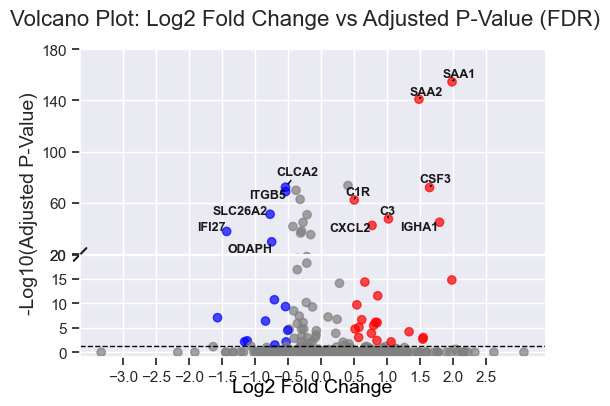

In [9]:
import numpy as np
import pandas as pd
from brokenaxes import brokenaxes
import matplotlib.pyplot as plt
from adjustText import adjust_text

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# List of genes to annotate
genes_of_interest = ['SAA1', 'SAA2', "CXCL2",  "ITGB5",  "ODAPH", "IFI27", "C3", "C1R", "CSF3", "CLCA2", "IGHA1", "SLC26A2"]

# Define your data
log2fc_values = dge_results['Log2 Fold Change (Healthy vs Perio)']
pvalues = dge_results['Adjusted P-Value (FDR)']
gene_names = dge_results['Gene Name']

# Convert p-values to -log10 scale
log10_pvalues = -np.log10(np.maximum(pvalues, 1e-300))

# Optional: check some genes of interest
print(dge_results[dge_results['Gene Name'].isin(genes_of_interest)])

# Create the figure with broken y-axis
fig = plt.figure(figsize=(6, 4))
bax = brokenaxes(ylims=((-1, 20), (20, 180)), hspace=0.001, height_ratios=[2, 1])

# Set strict significance threshold
significance_threshold = 0.05
cutoff_y = -np.log10(significance_threshold)

# Define colors and annotate
colors = []
texts = []
for log2fc, pval, log10_pval, gene_name in zip(log2fc_values, pvalues, log10_pvalues, gene_names):
    # Apply strict significance cutoff
    if pval < significance_threshold:
        if log2fc > 0.5:
            color = 'red'
        elif log2fc < -0.5:
            color = 'blue'
        else:
            color = 'grey'  # significant pval but small fold change
    else:
        color = 'grey'  # non-significant

    colors.append(color)

    # Annotate selected genes
    if gene_name in genes_of_interest:
        for ax in bax.axs:
            ylim = ax.get_ylim()
            if ylim[0] < log10_pval < ylim[1]:
                texts.append(ax.text(log2fc, log10_pval, gene_name, fontsize=9, 
                                     alpha=0.9, color='black', weight='bold', ha='right'))
                break

# Plot scatter
bax.scatter(log2fc_values, log10_pvalues, c=colors, alpha=0.7)

# Add significance threshold line
for ax in bax.axs:
    ax.axhline(y=cutoff_y, color='black', linestyle='--', linewidth=1)
# Set X-axis ticks for all subplots in the broken axis
# You can define custom tick locations for each subplot if needed,
# or set them uniformly for all as shown here.
x_ticks = np.arange(-3, 3, 0.5)
for ax in bax.axs:
    ax.set_xticks(x_ticks)

# Set Y-axis ticks for the first subplot (bottom part of the broken y-axis)
bax.axs[1].set_yticks(np.arange(0, 21, 5))

# Set Y-axis ticks for the second subplot (top part of the broken y-axis)
bax.axs[0].set_yticks(np.arange(20, 181, 40))

# Adjust text
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'},
            arrowprops=dict(arrowstyle="->", color='black'))

# Labels and title
bax.set_xlabel('Log2 Fold Change', fontsize=14, color='black')
bax.set_ylabel('-Log10(Adjusted P-Value)', fontsize=14)
bax.fig.suptitle('Volcano Plot: Log2 Fold Change vs Adjusted P-Value (FDR)', fontsize=16)

# Show
plt.show()

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/TAE_HvsP_Volcano.pdf', bbox_inches='tight')

In [4]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_TAEniche)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_TAEniche, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_TAEniche.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TAEniche.uns['rank_genes_groups']['names'][cluster][:30]  # Top 20 genes

In [5]:
top_genes_per_cluster

{'healthy': array(['CLCA2', 'ODAM', 'ITGB5', 'GPC1', 'SLC26A2', 'ANXA1', 'SDC1',
        'LAMC2', 'S100A16', 'IFI27', 'DST', 'IL1RN', 'ODAPH', 'COL17A1',
        'BASP1', 'TNC', 'CLEC7A', 'SNCA', 'EHF', 'BCL2L11', 'CAVIN1',
        'BAMBI', 'SEMA3C', 'MYC', 'SOX4', 'CFHR3', 'CAV1', 'ICAM1',
        'RTKN2', 'KRT5'], dtype=object),
 'perio': array(['SAA1', 'SAA2', 'SLPI', 'CSF3', 'C1R', 'C3', 'IGHA1', 'CXCL2',
        'MZB1', 'CFB', 'CXCL1', 'TENT5C', 'CXCL6', 'ADAM28', 'DNASE1L3',
        'IL1A', 'CD14', 'RAPGEF3', 'PECAM1', 'CTSC', 'PDPN', 'CD79A',
        'SERPINB3', 'IL36G', 'CXCL17', 'CSF3R', 'IL36A', 'KLK11', 'VWF',
        'SERPINB9'], dtype=object)}

In [8]:
# Define the cluster name you want to subset
cluster_name = "Fibroblast"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Fib = adata_included[adata_included.obs['Lvl1'] == cluster_name].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [9]:
target_niches = [
    'Fibrous CT', 
    'Plasma-Fib CT',
    'Plasma',
    'Epi-CT',
    'Lymphoid',
]
adata_Fib_filtered = adata_Fib[adata_Fib.obs['niche_knn50k10_merged'].isin(target_niches)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [10]:
# Define the cluster name you want to subset
cluster_name = "perio"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Fib_perio_filtered = adata_Fib_filtered[adata_Fib_filtered.obs['status.3'] == cluster_name].copy()

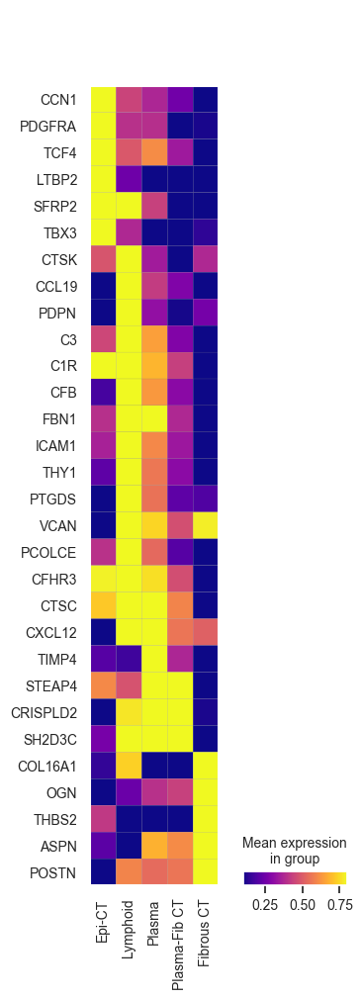

In [16]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Fib_perio_filtered)

# Step 2: Manually set niche order
niche_order = ['Epi-CT', 'Lymphoid', 'Plasma', 'Plasma-Fib CT', 'Fibrous CT']
adata_Fib_perio_filtered.obs['niche_knn50k10_merged'] = adata_Fib_perio_filtered.obs['niche_knn50k10_merged'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
    'CCN1', 'PDGFRA', 'TCF4', 
    'LTBP2', 'SFRP2',  'TBX3', 'CTSK', 'CCL19', 'PDPN', 'C3', 'C1R', 'CFB', 'FBN1',
    'ICAM1', 'THY1', 'PTGDS', 'VCAN', 'PCOLCE', 'CFHR3', 'CTSC', 'CXCL12', 'TIMP4',
    'STEAP4', 'CRISPLD2', 'SH2D3C',
    'COL16A1', 'OGN', 'THBS2', 'ASPN',
    'POSTN']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Fib_perio_filtered.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_Fib_perio_filtered,
    var_names=genes_to_plot,
    groupby='niche_knn50k10_merged',
    use_raw=False,
    vmin=0.1,
    vmax=0.8,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/perio_Fib_per_niche.pdf', bbox_inches='tight')

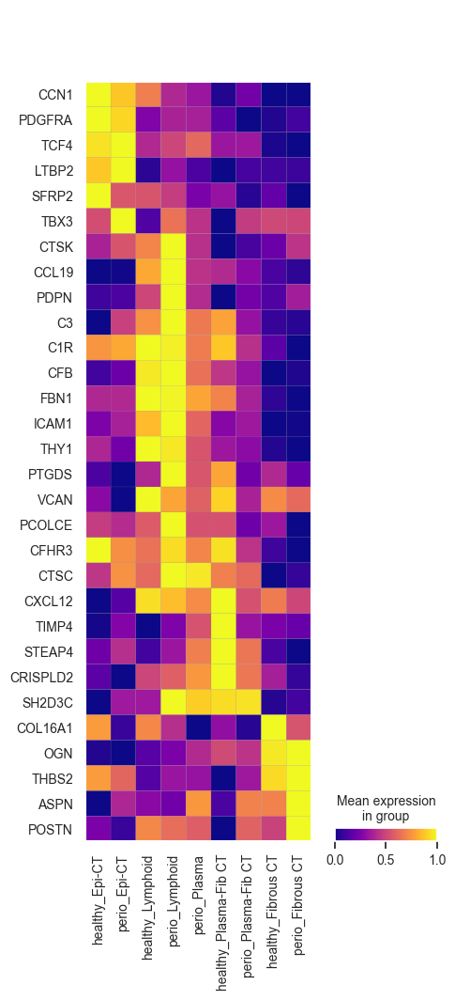

In [15]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Fib_filtered)

# Step 2: Manually set niche order
niche_order = ['healthy_Epi-CT', 'perio_Epi-CT', 'healthy_Lymphoid', 'perio_Lymphoid', 
               'perio_Plasma', 'healthy_Plasma-Fib CT', 'perio_Plasma-Fib CT', 'healthy_Fibrous CT', 'perio_Fibrous CT']
adata_Fib_filtered.obs['status_niche'] = adata_Fib_filtered.obs['status_niche'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
    'CCN1', 'PDGFRA', 'TCF4', 
    'LTBP2', 'SFRP2',  'TBX3', 'CTSK', 'CCL19', 'PDPN', 'C3', 'C1R', 'CFB', 'FBN1',
    'ICAM1', 'THY1', 'PTGDS', 'VCAN', 'PCOLCE', 'CFHR3', 'CTSC', 'CXCL12', 'TIMP4',
    'STEAP4', 'CRISPLD2', 'SH2D3C',
    'COL16A1', 'OGN', 'THBS2', 'ASPN',
    'POSTN']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Fib_filtered.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_Fib_filtered,
    var_names=genes_to_plot,
    groupby='status_niche',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/HvsP_Fib_per_niche.pdf', bbox_inches='tight')

In [17]:
# Define the cluster name you want to subset
cluster_name = "Vascular"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Vasc = adata_included[adata_included.obs['Lvl1'] == cluster_name].copy()

In [18]:
target_niches = [
    'Fibrous CT', 
    'Plasma-Fib CT',
    'Plasma',
    'Epi-CT',
    'Lymphoid',
]
adata_Vasc_filtered = adata_Vasc[adata_Vasc.obs['niche_knn50k10_merged'].isin(target_niches)].copy()

In [19]:
# Define the cluster name you want to subset
cluster_name = "perio"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Vasc_perio_filtered = adata_Vasc_filtered[adata_Vasc_filtered.obs['status.3'] == cluster_name].copy()

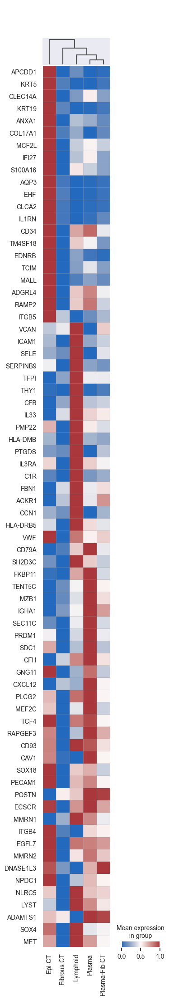

In [44]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_Vasc_perio_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_Vasc_perio_filtered, 'niche_knn50k10_merged', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_Vasc_perio_filtered.obs['niche_knn50k10_merged'].cat.categories:
    top_genes_per_cluster[cluster] = adata_Vasc_perio_filtered.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Vasc_perio_filtered, groupby='niche_knn50k10_merged')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_Vasc_perio_filtered.uns['dendrogram_niche_knn50k10_merged']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_Vasc_perio_filtered[adata_Vasc_perio_filtered.obs['niche_knn50k10_merged'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_Vasc_perio_filtered,
    var_names=genes_for_plot,
    groupby='niche_knn50k10_merged',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [45]:
print(genes_for_plot)

['APCDD1', 'KRT5', 'CLEC14A', 'KRT19', 'ANXA1', 'COL17A1', 'MCF2L', 'IFI27', 'S100A16', 'AQP3', 'EHF', 'CLCA2', 'IL1RN', 'CD34', 'TM4SF18', 'EDNRB', 'TCIM', 'MALL', 'ADGRL4', 'RAMP2', 'ITGB5', 'VCAN', 'ICAM1', 'SELE', 'SERPINB9', 'TFPI', 'THY1', 'CFB', 'IL33', 'PMP22', 'HLA-DMB', 'PTGDS', 'IL3RA', 'C1R', 'FBN1', 'ACKR1', 'CCN1', 'HLA-DRB5', 'VWF', 'CD79A', 'SH2D3C', 'FKBP11', 'TENT5C', 'MZB1', 'IGHA1', 'SEC11C', 'PRDM1', 'SDC1', 'CFH', 'GNG11', 'CXCL12', 'PLCG2', 'MEF2C', 'TCF4', 'RAPGEF3', 'CD93', 'CAV1', 'SOX18', 'PECAM1', 'POSTN', 'ECSCR', 'MMRN1', 'ITGB4', 'EGFL7', 'MMRN2', 'DNASE1L3', 'NPDC1', 'NLRC5', 'LYST', 'ADAMTS1', 'SOX4', 'MET']


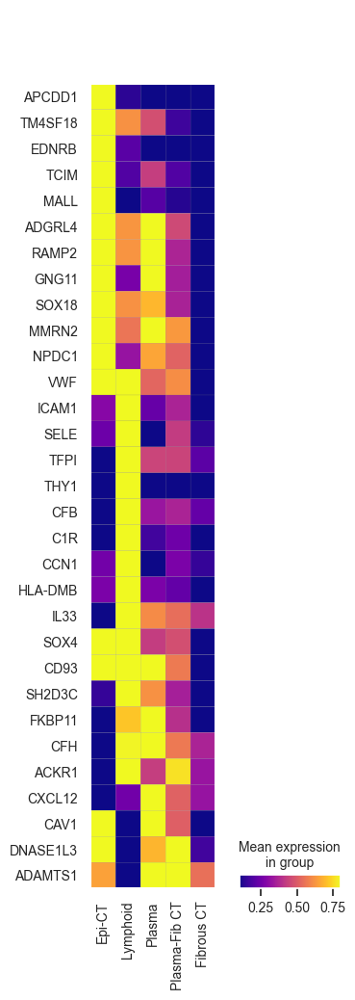

In [22]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Vasc_perio_filtered)

# Step 2: Manually set niche order
niche_order = ['Epi-CT', 'Lymphoid', 'Plasma', 'Plasma-Fib CT', 'Fibrous CT']
adata_Vasc_perio_filtered.obs['niche_knn50k10_merged'] = adata_Vasc_perio_filtered.obs['niche_knn50k10_merged'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'TM4SF18', 'EDNRB', 'TCIM', 'MALL', 'ADGRL4', 'RAMP2', 
    'GNG11', 'SOX18', 'MMRN2',  'NPDC1', 'VWF',
    'ICAM1', 'SELE',  'TFPI', 'THY1', 'CFB', 'C1R',  'CCN1', 'HLA-DMB','IL33', 'SOX4',  'CD93',
    'SH2D3C', 'FKBP11','CFH', 'ACKR1',  'CXCL12', 'CAV1', 'DNASE1L3', 'ADAMTS1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Fib_perio_filtered.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_Vasc_perio_filtered,
    var_names=genes_to_plot,
    groupby='niche_knn50k10_merged',
    use_raw=False,
    vmin=0.1,
    vmax=0.8,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
   return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/perio_Vasc_per_niche.pdf', bbox_inches='tight')

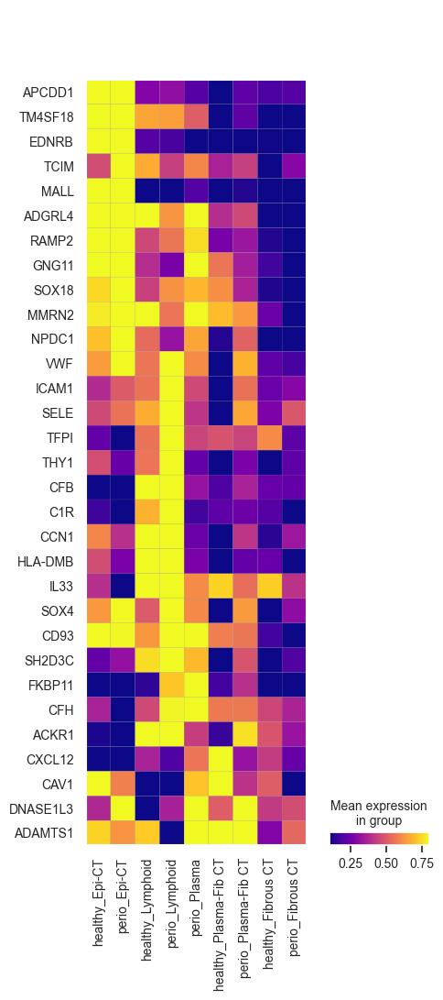

In [23]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Vasc_filtered)

# Step 2: Manually set niche order
niche_order = ['healthy_Epi-CT', 'perio_Epi-CT', 'healthy_Lymphoid', 'perio_Lymphoid', 
               'perio_Plasma', 'healthy_Plasma-Fib CT', 'perio_Plasma-Fib CT', 'healthy_Fibrous CT', 'perio_Fibrous CT']
adata_Vasc_filtered.obs['status_niche'] = adata_Vasc_filtered.obs['status_niche'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'TM4SF18', 'EDNRB', 'TCIM', 'MALL', 'ADGRL4', 'RAMP2', 
    'GNG11', 'SOX18', 'MMRN2',  'NPDC1', 'VWF',
    'ICAM1', 'SELE',  'TFPI', 'THY1', 'CFB', 'C1R',  'CCN1', 'HLA-DMB','IL33', 'SOX4',  'CD93',
    'SH2D3C', 'FKBP11','CFH', 'ACKR1',  'CXCL12', 'CAV1', 'DNASE1L3', 'ADAMTS1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Vasc_filtered.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_Vasc_filtered,
    var_names=genes_to_plot,
    groupby='status_niche',
    use_raw=False,
    vmin=0.1,
    vmax=0.8,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
   return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/HvsP_Vasc_per_niche.pdf', bbox_inches='tight')

In [35]:
cluster_names = ["Vascular", "Epithelial", "Fibroblast"]

adata_nonimmune = adata[adata.obs['Lvl1'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [2]:
from sklearn.neighbors import BallTree
import numpy as np

# Set max allowed distance (in your spatial units)
max_distance = 1500  

# Initialize the column
adata_nonimmune.obs['distance_to_TAE'] = np.nan

# Loop through each sample
for sample_name in adata_nonimmune.obs['sample'].unique():
    print(f"Processing sample: {sample_name}")

    adata_sample = adata_nonimmune[adata_nonimmune.obs['sample'] == sample_name]

    crevicular_mask = adata_sample.obs['niche_knn50k10_merged'] == 'Crevicular'
    crevicular_coords = adata_sample.obs.loc[crevicular_mask, ['x_centroid', 'y_centroid']].to_numpy()

    if crevicular_coords.shape[0] > 0:
        tree = BallTree(crevicular_coords)

        non_crevicular_indices = adata_sample.obs[~crevicular_mask].index
        non_crevicular_coords = adata_sample.obs.loc[non_crevicular_indices, ['x_centroid', 'y_centroid']].to_numpy()

        dist, _ = tree.query(non_crevicular_coords, k=1)

        for idx, d in zip(non_crevicular_indices, dist.flatten()):
            if d <= max_distance:
                adata_nonimmune.obs.at[idx, 'distance_to_TAE'] = d
            # else: value remains NaN

    print(f"Finished sample: {sample_name}")

# Assign 0 to Crevicular cells
adata_nonimmune.obs.loc[adata_nonimmune.obs['niche_knn50k10_merged'] == 'Crevicular', 'distance_to_TAE'] = 0.0
l

NameError: name 'adata_nonimmune' is not defined

In [74]:
# Step 1: Define custom bin edges and labels
bin_edges = [0, 100, 500, 1500]
bin_labels = ['0–100', '100–500', '500–1500']

# Step 2: Create the categorical column based on your distance column
adata_nonimmune.obs['distance_bin_100um'] = pd.cut(
    adata_nonimmune.obs['distance_to_TAE'], 
    bins=bin_edges,
    labels=bin_labels,
    include_lowest=True,
    right=False  # left-inclusive bins: [0,100), [100,500), etc.
)

In [44]:
adata_nonimmune.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_bin_100um
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,100–500
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,100–500
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,100–500
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,100–500
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,100–500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,6,11,6,0,0,0,Fib CT 1,Fibrous CT,609.640863,500–1500
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,1,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,693.317526,500–1500
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,692.303945,500–1500


In [67]:
adata_nonimmune.write_h5ad("/data/vasileiosionat2/Xenium/Drake_outputs/adata_nonimmune_distances.h5ad")

In [ ]:
adata_nonimmune = anndata.read_h5ad('/data/vasileiosionat2/Xenium/Drake_outputs/adata_nonimmune_distances.h5ad')

In [ ]:
cluster_names = ["Fibroblast", "Vascular"]

adata_stromal = adata_nonimmune[adata_nonimmune.obs['Lvl2'].isin(cluster_names)].copy()

In [ ]:
adata_stromal.obs['PatientID_Atlas']=adata_stromal.obs['pt.id']

In [ ]:
# Ensure 'PatientID_Atlas' is a string type
adata_stromal.obs['PatientID_Atlas'] = adata_stromal.obs['PatientID_Atlas'].astype(str)

# Define the replacement dictionary
replacement_dict = {
'HV171' : 'H-1',
'HV180' : 'H-2',
'HV189'	: 'H-3',
'HV191' : 'H-4',
'HV203' : 'H-5',
'HV207' : 'H-6',
'HV220' : 'H-7',
'HV187' : 'H-8',
'HV205' : 'H-9',
'HV137' : 'P-1',
'HV140'	: 'P-2',
'HV154' : 'P-3',
'HV160' : 'P-4',
'HV181' : 'P-5',
'HV196' : 'P-6',
'HV204' : 'P-7',
'HV214' : 'P-8',
'HV219' : 'P-9',
'HV184' : 'P-10',
'HV185' : 'P-11',
'HV188' : 'P-12',
'HV192' : 'P-13',
'HV198' : 'P-14',
'HV211' : 'P-15',
    
}

# Replace only the specified categories in 'T_leiden2'
adata_stromal.obs['PatientID_Atlas'] = adata_stromal.obs['PatientID_Atlas'].astype(str)  # Ensure it's string
adata_stromal.obs['PatientID_Atlas'] = adata_stromal.obs['PatientID_Atlas'].replace(replacement_dict)

# Check the unique values in 'T_leiden2' to confirm
print(adata_stromal.obs['PatientID_Atlas'].unique())

In [ ]:
# List of SampleIDs to exclude
excluded_sample_ids = ['s2r9_a', 's2r9_b', 'HV140A_C', 'HV140A_D', 's2r4_a', 's2r4_b', 's2r5', 's2r8_HV188_a', 's2r8_HV188_b', 's2r8_HV211', 
                       'HV192A_A', 'HV192A_B','HV192A_C']

# Create a subset of the AnnData object excluding the specific SampleIDs
adata_stromal = adata_stromal[~adata_stromal.obs['sample'].isin(excluded_sample_ids)].copy()

In [ ]:
adata_stromal = adata_stromal[~adata_stromal.obs['distance_to_TAE'].isna()].copy()

In [33]:
adata_stromal.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_bin_100um,status_distance
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,100–500,perio_100–500
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,100–500,perio_100–500
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,100–500,perio_100–500
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,100–500,perio_100–500
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,100–500,perio_100–500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,11,6,0,0,0,Fib CT 1,Fibrous CT,609.640863,500–1500,healthy_500–1500
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,693.317526,500–1500,healthy_500–1500
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,692.303945,500–1500,healthy_500–1500


In [41]:
adata_stromal.obs['sample'].unique().tolist()

['s1r1_a',
 's1r1_b',
 's1r2',
 's1r3',
 's2r1_HV203',
 's2r1_HV207',
 's2r2_HV184',
 's2r3',
 's2r7_b',
 's2r8_HV185',
 'HV137A',
 'HV140A_A',
 'HV140A_B',
 'HV160C_A',
 'HV160C_B',
 'HV171A',
 'HV191A_A',
 'HV191A_B',
 'HV198B_A',
 'HV198B_B',
 'HV205A',
 'HV205B',
 'HV219AS_A',
 'HV219AS_C',
 'HV220A_A',
 'HV220A_B']

In [8]:
adata_HV184 = adata[adata.obs['sample'] == 's2r2_HV184'].copy()
adata_stromal_HV184 = adata_stromal[adata_stromal.obs['sample'] == 's2r2_HV184'].copy()
# Define common indices
common_indices = adata_HV184.obs.index.intersection(adata_stromal_HV184.obs.index)

# Ensure the destination column is not Categorical
if 'distance_bin_100um' in adata_HV184.obs.columns:
    adata_HV184.obs['distance_bin_100um'] = adata_HV184.obs['distance_bin_100um'].astype('object')

# Now assign from the source — cast to object to avoid Categorical mismatch
adata_HV184.obs.loc[common_indices, 'distance_bin_100um'] = (
    adata_stromal_HV184.obs.loc[common_indices, 'distance_bin_100um'].astype('object')
)

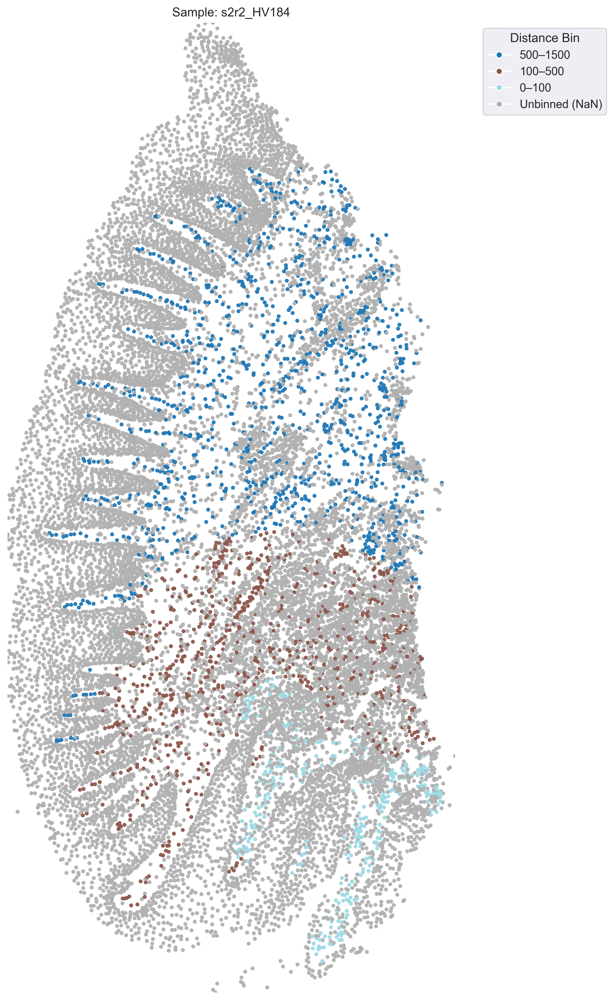

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def generate_spatial_plot_distance_bins_single(adata, distance_key, save_path):
    # Extract coordinates
    x_coords = adata.obs['x_centroid'].values
    y_coords = adata.obs['y_centroid'].values

    # Spatial transformation
    rotation_angle = 0
    rotation_rad = np.deg2rad(rotation_angle)
    rotation_matrix = np.array([[np.cos(rotation_rad), -np.sin(rotation_rad)],
                                [np.sin(rotation_rad),  np.cos(rotation_rad)]])
    horizontal_flip_matrix = np.array([[-1, 0], [0, -1]])
    combined_matrix = rotation_matrix @ horizontal_flip_matrix

    coords = np.vstack((x_coords, y_coords))
    transformed_coords = combined_matrix @ coords
    new_x_coords, new_y_coords = transformed_coords[0, :], transformed_coords[1, :]

    # Handle empty data
    if new_x_coords.size == 0:
        print("⚠️ No data to plot.")
        return

    # Aspect ratio
    x_range = new_x_coords.max() - new_x_coords.min()
    y_range = new_y_coords.max() - new_y_coords.min()
    aspect_ratio = x_range / y_range
    figsize = (6 * aspect_ratio, 6) if aspect_ratio > 1 else (6, 6 / aspect_ratio)

    # Generate color map for bins
    unique_bins = adata.obs[distance_key].dropna().unique()
    random_colors = plt.cm.tab20(np.linspace(0, 1, len(unique_bins)))
    bin_color_map = {bin_label: mcolors.to_hex(color) for bin_label, color in zip(unique_bins, random_colors)}

    # Assign plot colors; NaN -> grey
    adata.obs['plot_color'] = adata.obs[distance_key].map(bin_color_map)
    adata.obs['plot_color'] = adata.obs['plot_color'].fillna('#B0B0B0')  # grey for NaN

    # Plot
    plt.figure(figsize=figsize)
    ax = plt.gca()
    plt.gcf().patch.set_facecolor('white')
    ax.set_facecolor('white')

    plt.scatter(x=new_x_coords, y=new_y_coords, c=adata.obs['plot_color'], s=8, alpha=0.9)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlim(new_x_coords.min(), new_x_coords.max())
    ax.set_ylim(new_y_coords.min(), new_y_coords.max())

    for spine in ax.spines.values():
        spine.set_visible(False)

    # Build legend
    handles = [
        plt.Line2D([0], [0], marker='o', color='w',
                   markerfacecolor=bin_color_map[bin_label],
                   label=str(bin_label), markersize=6)
        for bin_label in unique_bins
    ]
    # Add grey for NaNs
    handles.append(
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#B0B0B0',
                   label='Unbinned (NaN)', markersize=6)
    )
    plt.legend(handles=handles, title='Distance Bin', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Final touches
    plt.gcf().set_dpi(300)
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.title(f"Sample: {adata.obs['sample'].unique()[0]}")
    #plt.savefig(save_path, format='svg', bbox_inches='tight')
    plt.show()
    plt.close()
save_path = "/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/s2r2_HV184_distance_bins.svg"

generate_spatial_plot_distance_bins_single(
    adata=adata_HV184,
    distance_key='distance_bin_100um',
    save_path=save_path
)

In [59]:
adata_stromal.obs['status_distance'] = adata_stromal.obs['status.3'].astype(str) + '_' + adata_stromal.obs['distance_bin_100um'].astype(str)

In [17]:
cluster_names = ["perio"]

adata_stromal_perio = adata_stromal[adata_stromal.obs['status.3'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [15]:
cluster_names = ["healthy"]

adata_stromal_healthy = adata_stromal[adata_stromal.obs['status.3'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



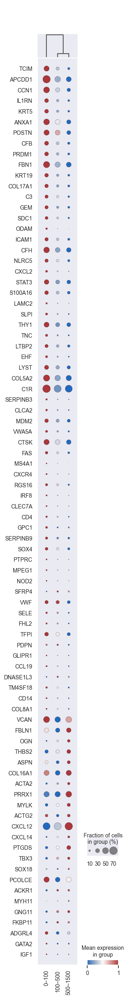

In [16]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_stromal_healthy)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_stromal_healthy, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_stromal_healthy.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_stromal_healthy.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_stromal_healthy, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_stromal_healthy.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_stromal_healthy[adata_stromal_healthy.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 50:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.dotplot(
    adata_stromal_healthy,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



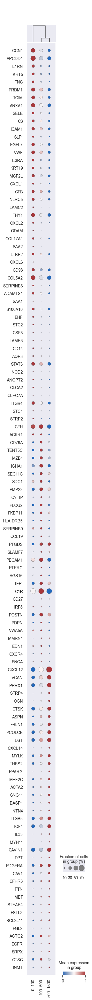

In [18]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_stromal_perio)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_stromal_perio, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_stromal_perio.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_stromal_perio.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_stromal_perio, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_stromal_perio.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_stromal_perio[adata_stromal_perio.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 50:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.dotplot(
    adata_stromal_perio,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



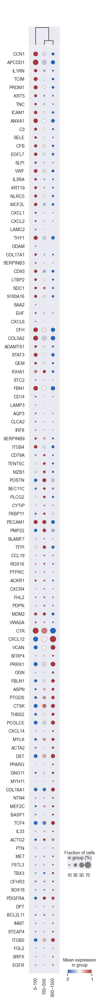

In [19]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_stromal)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_stromal, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_stromal.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_stromal.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_stromal, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_stromal.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_stromal[adata_stromal.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 50:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.dotplot(
    adata_stromal,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [10]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_healthy)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_healthy, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_healthy.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_healthy.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_healthy, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_healthy.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_healthy[adata_healthy.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 50:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.dotplot(
    adata_healthy,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

KeyError: 'distance_bin_100um'

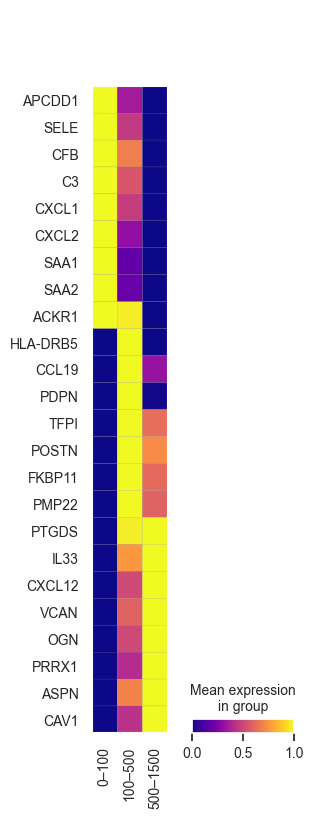

In [22]:
# Step 2: Manually set niche order
niche_order = ['0–100', '100–500', '500–1500']  # en dash!
adata_stromal_perio.obs['distance_bin_100um'] = adata_stromal_perio.obs['distance_bin_100um'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'SELE', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'ACKR1', 'HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22',  
    'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_stromal_perio.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_stromal_perio,
    var_names=genes_to_plot,
    groupby='distance_bin_100um',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/perio_Stromal_zones.pdf', bbox_inches='tight')

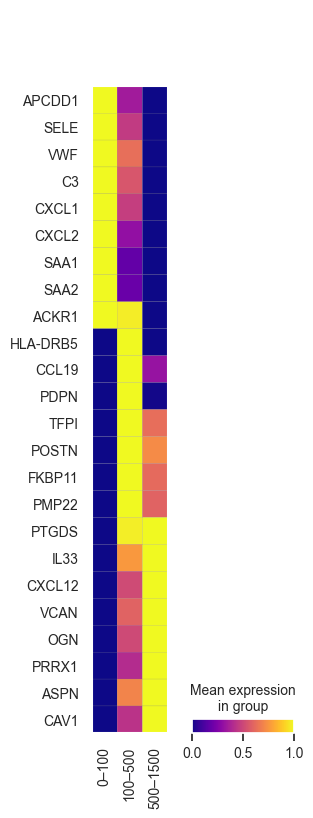

In [25]:
# Step 2: Manually set niche order
niche_order = ['0–100', '100–500', '500–1500']  # en dash!
adata_stromal_perio.obs['distance_bin_100um'] = adata_stromal_perio.obs['distance_bin_100um'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'SELE', 'VWF', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'ACKR1', 'HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22',  
    'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_stromal_perio.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_stromal_perio,
    var_names=genes_to_plot,
    groupby='distance_bin_100um',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/perio_Stromal_zones.pdf', bbox_inches='tight')

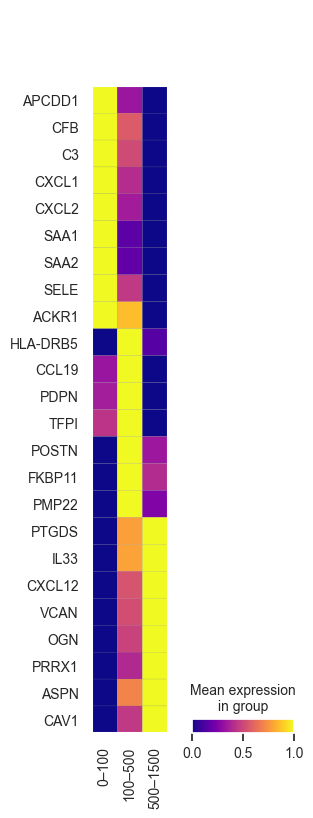

In [82]:
# Step 2: Manually set niche order
niche_order = ['0–100', '100–500', '500–1500']  # en dash!
adata_stromal.obs['distance_bin_100um'] = adata_stromal.obs['distance_bin_100um'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'SELE', 'ACKR1', 'HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN',  'PMP22',  
    'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_stromal.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_stromal,
    var_names=genes_to_plot,
    groupby='distance_bin_100um',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/total_Stromal_zones.pdf', bbox_inches='tight')

In [ ]:
cluster_names = ["0–100"]

adata_stromal_0_100 = adata_stromal[adata_stromal.obs['distance_bin_100um'].isin(cluster_names)].copy()

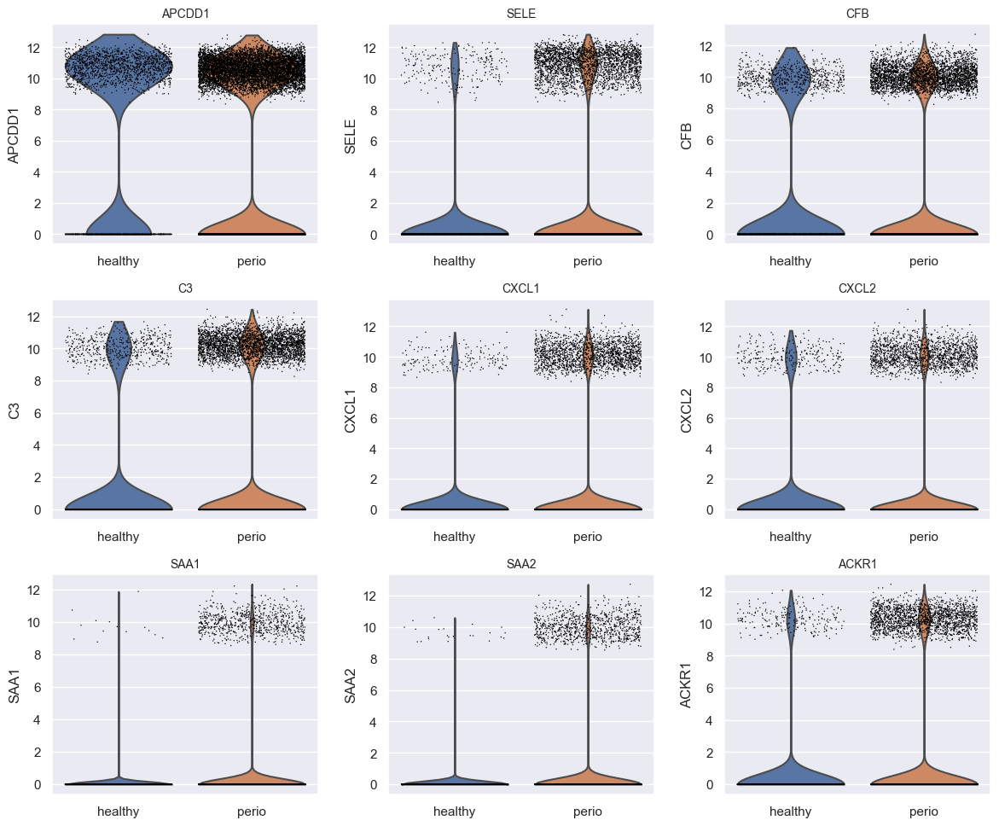

In [91]:
import numpy as np
import math
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd

# Step 2: Manually set niche order
niche_order = ['healthy', 'perio']
adata_stromal_0_100.obs['status.3'] = adata_stromal_0_100.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
 'APCDD1', 'SELE', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'ACKR1',
]

# Step 4: keep only genes present
genes_to_plot = [g for g in genes_of_interest if g in adata_stromal_0_100.var_names]
if not genes_to_plot:
    raise ValueError("None of the requested genes are present in adata_B.var_names.")

# --- grid with 4 rows ---
n_genes = len(genes_to_plot)
nrows = 4
ncols = math.ceil(n_genes / nrows)

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3.2*nrows))
axes = np.atleast_1d(axes).ravel()

# Draw each gene on its own axis (no return_fig here)
for i, gene in enumerate(genes_to_plot):
    sc.pl.violin(
        adata_stromal_0_100,
        keys=gene,
        groupby="status.3",
        stripplot=True,
        jitter=0.4,
        rotation=0,
        show=False,
        ax=axes[i],
        use_raw=True,  # uncomment/adjust depending on where your normalized values live
    )
    axes[i].set_title(gene, fontsize=10)

# Hide any unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()

# Save the WHOLE grid figure (the one from plt.subplots)
outpath = "/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/0-100_stromal_Violin.pdf"
fig.savefig(outpath, bbox_inches="tight", dpi=300)
plt.show()

In [35]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
import numpy as np

genes_tested = adata_stromal_0_100.var_names  # <-- ALL genes
raw_p = []
for g in genes_tested:
    x = adata_stromal_0_100[:, g].X.toarray().ravel()
    y = adata_stromal_0_100.obs["status.3"].values
    a = x[y == "healthy"]
    b = x[y == "perio"]
    _, p = mannwhitneyu(a, b, alternative="two-sided")
    raw_p.append(p)

# FDR across all genes
_, qvals, _, _ = multipletests(raw_p, method="fdr_bh")

results = dict(zip(genes_tested, qvals))

# Now just grab your 3
for g in [ 'APCDD1', 'SELE', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'ACKR1',]:
    print(g, results[g])


APCDD1 5.941978414865179e-35
SELE 4.5364264509536935e-33
CFB 0.020401785060989018
C3 0.007051816739017895
CXCL1 1.3811955983966445e-17
CXCL2 0.9842658925320906
SAA1 5.264865810158665e-23
SAA2 6.639964621718581e-26
ACKR1 3.12859802258763e-09


In [48]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_stromal_0_100
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = ['APCDD1', 'SELE', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'ACKR1']
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

           p_raw  q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                    
APCDD1 1.186e-36 5.942e-35        1.587e-01 5.793e-01       2.421e+00   
SELE   1.106e-34 4.536e-33       -1.101e-01 4.449e-01       0.000e+00   
SAA2   2.061e-27 6.640e-26       -5.790e-02 4.711e-01       0.000e+00   
SAA1   2.685e-24 5.265e-23       -4.912e-02 4.754e-01       0.000e+00   
CXCL1  8.575e-19 1.381e-17       -6.704e-02 4.665e-01       0.000e+00   
ACKR1  3.469e-10 3.129e-09       -4.896e-02 4.755e-01       0.000e+00   
C3     1.986e-03 7.052e-03       -3.040e-02 4.848e-01       0.000e+00   
CFB    6.605e-03 2.040e-02        2.769e-02 5.138e-01       0.000e+00   
CXCL2  9.709e-01 9.843e-01        2.704e-04 5.001e-01       0.000e+00   

        median_perio          direction  
gene                                     
APCDD1     2.364e+00  higher in healthy  
SELE       0.000e+00  higher in disease  
SAA2       0.000e+00  higher

In [92]:
import numpy as np, pandas as pd
from scipy import sparse
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests

adata = adata_stromal_0_100            # <- your AnnData
group_col = "status.3"                 # 'healthy' / 'perio'
genes = ['APCDD1','SELE','SAA1','SAA2','CXCL1','CXCL2','ACKR1','C3','CFB']

# choose threshold in the scale of the matrix you use:
# - if use_raw=True with log1p data: threshold=0 means "detected"; t -> raw > exp(t)-1
threshold = 0.0                        # 0 = “any nonzero”
use_raw = True                         # set False to use adata.X

# -------- helper to get the matrix we want --------
def get_matrix(adata, genes, use_raw=True):
    V = adata.raw[:, genes].X if use_raw else adata[:, genes].X
    if sparse.issparse(V): V = V.toarray()
    return V

X = get_matrix(adata, genes, use_raw=use_raw)
g = adata.obs[group_col].astype(str).values
mask_H = (g == "healthy")
mask_P = (g == "perio")

rows = []
for j, gene in enumerate(genes):
    v = X[:, j]
    pos_H = int(np.sum(v[mask_H] > threshold))
    neg_H = int(np.sum(v[mask_H] <= threshold))
    pos_P = int(np.sum(v[mask_P] > threshold))
    neg_P = int(np.sum(v[mask_P] <= threshold))

    # 2x2 table:        positive  negative
    # Healthy (row 0)     a          b
    # Perio   (row 1)     c          d
    table = np.array([[pos_H, neg_H],
                      [pos_P, neg_P]], dtype=int)

    # Fisher's exact (two-sided) on proportions
    # (use alternative="greater"/"less" if you want direction-specific tests)
    _, p = fisher_exact(table, alternative="two-sided")

    frac_H = pos_H / (pos_H + neg_H) if (pos_H + neg_H) > 0 else np.nan
    frac_P = pos_P / (pos_P + neg_P) if (pos_P + neg_P) > 0 else np.nan

    rows.append([gene, pos_H, neg_H, frac_H, pos_P, neg_P, frac_P, p])

df_frac = pd.DataFrame(rows, columns=[
    "gene", "pos_H", "neg_H", "frac_pos_H",
    "pos_P", "neg_P", "frac_pos_P", "p_fisher_raw"
])

# FDR across all tested genes
_, q, _, _ = multipletests(df_frac["p_fisher_raw"].fillna(1.0), method="fdr_bh")
df_frac["q_fisher_fdr"] = q

# effect size for proportions (difference and log2 odds ratio)
df_frac["frac_diff_PminusH"] = df_frac["frac_pos_P"] - df_frac["frac_pos_H"]
# add a tiny offset to avoid div-by-zero
eps = 1e-9
odds_H = (df_frac["pos_H"] + eps) / (df_frac["neg_H"] + eps)
odds_P = (df_frac["pos_P"] + eps) / (df_frac["neg_P"] + eps)
df_frac["log2_OR_P_vs_H"] = np.log2(odds_P / odds_H)

# view results for your genes
df_frac.sort_values("q_fisher_fdr").head(12)

,gene,pos_H,neg_H,frac_pos_H,pos_P,neg_P,frac_pos_P,p_fisher_raw,q_fisher_fdr,frac_diff_PminusH,log2_OR_P_vs_H
1,SELE,231,2064,1.007e-01,2746,10496,2.074e-01,2.530e-37,1.138e-36,1.067e-01,1.225e+00
3,SAA2,23,2272,1.002e-02,896,12346,6.766e-02,1.523e-37,1.138e-36,5.764e-02,2.842e+00
2,SAA1,14,2281,6.100e-03,730,12512,5.513e-02,1.812e-34,5.436e-34,4.903e-02,3.249e+00
0,APCDD1,1523,772,6.636e-01,7432,5810,5.612e-01,2.441e-20,5.491e-20,-1.024e-01,-6.250e-01
4,CXCL1,167,2128,7.277e-02,1819,11423,1.374e-01,1.303e-19,2.346e-19,6.460e-02,1.021e+00
6,ACKR1,219,2076,9.542e-02,1908,11334,1.441e-01,8.313e-11,1.247e-10,4.866e-02,6.743e-01
8,CFB,687,1608,2.993e-01,3498,9744,2.642e-01,5.259e-04,6.762e-04,-3.519e-02,-2.511e-01
7,C3,516,1779,2.248e-01,3268,9974,2.468e-01,2.351e-02,2.645e-02,2.195e-02,1.759e-01
5,CXCL2,281,2014,1.224e-01,1603,11639,1.211e-01,8.625e-01,8.625e-01,-1.386e-03,-1.870e-02


In [93]:
adata.obs.columns.unique().tolist()

['cell_id',
 'x_centroid',
 'y_centroid',
 'transcript_counts',
 'control_probe_counts',
 'control_codeword_counts',
 'unassigned_codeword_counts',
 'deprecated_codeword_counts',
 'total_counts',
 'cell_area',
 'nucleus_area_x',
 'orig.ident',
 'nucleus_area_y',
 'pt.id',
 'oct.id',
 'status',
 'status.2',
 'status.3',
 'age',
 'sex',
 'race',
 'region',
 'orig_reg',
 'total_area_mm2',
 'Lvl1',
 'Lvl2',
 'Lvl3',
 'epiHL',
 'fibHL',
 'endoHL',
 'immuneHL',
 'Lvl4',
 'Lvl1_IE',
 'Lvl2_IE',
 'lymphoidHL',
 'myeloidHL',
 'sample',
 '_scvi_batch',
 '_scvi_labels',
 'cc8',
 'cc14',
 'cc17',
 'Lvl2.5',
 'niche_cc14',
 'Lvl4_old',
 'T_leiden',
 'T_leiden2',
 'T_leiden3',
 'Lvl4_thesis',
 'F_leiden',
 'V_leiden',
 'V_leiden2',
 'Lvl5',
 'B_leiden',
 'Lvl4_kmeans_Mel',
 'Mel_leiden',
 'KNN100_K10',
 'KNN100_K12',
 'spatial_expression_cluster',
 'KNN50_K10',
 'KNN30_K10',
 'KNN10_K10',
 'niche_knn50k10',
 'niche_knn50k10_merged',
 'distance_to_TAE',
 'distance_bin_100um',
 'status_distance']

In [17]:
import pandas as pd
import numpy as np
from scipy import sparse

adata = adata_stromal_0_100
status_col  = "status.3"
patient_col = "PatientID_Atlas"
genes = ['APCDD1','SELE','SAA1','SAA2','CXCL1','CXCL2','ACKR1','C3','CFB']

# Extract expression
X = adata.raw[:, genes].X if adata.raw is not None else adata[:, genes].X
if sparse.issparse(X):
    X = X.toarray()

# Build dataframe
df = pd.DataFrame(X, columns=genes)
df[patient_col] = adata.obs[patient_col].values
df[status_col]  = adata.obs[status_col].values

# If these are categoricals, drop unused categories to avoid phantom combos
for col in [patient_col, status_col]:
    if pd.api.types.is_categorical_dtype(df[col]):
        df[col] = df[col].cat.remove_unused_categories()
    else:
        # optional: ensure simple dtype (avoids category issues entirely)
        df[col] = df[col].astype(str)

threshold = 0.0

# Long format
long = df.melt(id_vars=[patient_col, status_col],
               var_name="gene", value_name="expr")

# Aggregate — observed=True prevents unused category combos like (H-1, perio)
patient_counts = (
    long.groupby([patient_col, status_col, "gene"], observed=True)
        .agg(
            pos_cells=("expr", lambda x: (x > threshold).sum()),
            total_cells=("expr", "size")
        )
        .reset_index()
)

# Optional safety filter: drop any rows that somehow have zero total cells
patient_counts = patient_counts.query("total_cells > 0").copy()

# Optional fraction
patient_counts["fraction"] = patient_counts["pos_cells"] / patient_counts["total_cells"]
patient_counts.head(30)

,PatientID_Atlas,status.3,gene,pos_cells,total_cells,fraction
0,H-1,healthy,ACKR1,1,63,0.015873
1,H-1,healthy,APCDD1,35,63,0.555556
2,H-1,healthy,C3,27,63,0.428571
3,H-1,healthy,CFB,22,63,0.349206
4,H-1,healthy,CXCL1,5,63,0.079365
5,H-1,healthy,CXCL2,18,63,0.285714
6,H-1,healthy,SAA1,1,63,0.015873
7,H-1,healthy,SAA2,0,63,0.000000
8,H-1,healthy,SELE,4,63,0.063492
9,H-2,healthy,ACKR1,80,710,0.112676


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

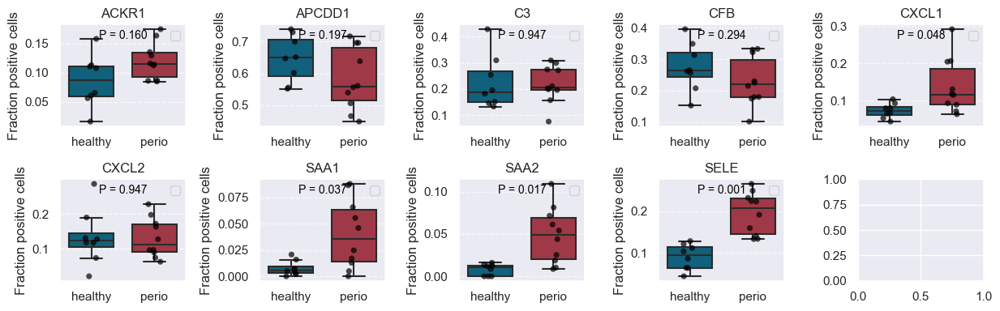

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statsmodels.stats.multitest import multipletests

# Load your data
df = patient_counts

# Filter relevant columns
df = df[['gene', 'status.3', 'fraction', 'PatientID_Atlas']]  # Include 'patient' for uniqueness

# Get unique annotations
annotations = df['gene'].unique()

# Define number of rows and columns for the subplot grid
n_rows = 2
n_cols = (len(annotations) + n_rows - 1) // n_rows  # Calculate number of columns based on number of annotations

# Set up the figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2.5, n_rows * 2))
axes = axes.flatten()  # Flatten the axes array to easily index

# Store p-values for multiple testing correction
p_values = []

# Iterate over each annotation and plot
for idx, annotation in enumerate(annotations):
    # Filter data for the current annotation
    df_annotation = df[df['gene'] == annotation]
    
    # Perform t-test for 'status' groups (Healthy vs Perio) in the current annotation
    healthy_data = df_annotation[df_annotation['status.3'] == 'healthy']['fraction']
    perio_data = df_annotation[df_annotation['status.3'] == 'perio']['fraction']
    
    # Perform t-test
    u_stat, p_val = stats.mannwhitneyu(healthy_data, perio_data, alternative='two-sided', method='auto')
    p_values.append(p_val)
    # Define the desired order
    order = ["healthy", "perio"]

    # Plotting on the corresponding subplot axis
    sns.boxplot(data=df_annotation, x="status.3", y="fraction", 
            palette={"healthy": "#006A8E", "perio": "#B1283A"}, width=0.7, 
            fliersize=0, dodge=True, order=order, ax=axes[idx])  

    # Add individual data points (jittered for visibility)
    sns.stripplot(data=df_annotation, x="status.3", y="fraction", 
              palette={"healthy": "black", "perio": "black"}, dodge=True,
              jitter=True, alpha=0.7, marker="o", edgecolor="black", 
              linewidth=0.1, order=order, ax=axes[idx])

    # Set aesthetics for the subplot
    axes[idx].set_xlabel("")
    axes[idx].set_ylabel("Fraction positive cells")
    axes[idx].set_title(f"{annotation}")
    axes[idx].legend(title="", loc="upper right")
    axes[idx].grid(axis="y", linestyle="--", alpha=0.7)

# Correct p-values for multiple comparisons using Bonferroni
_, corrected_p_values, _, _ = multipletests(p_values, method='fdr_bh')

# Display corrected p-values on the plots
for idx, annotation in enumerate(annotations):
    # Correct p-values
    p_val = corrected_p_values[idx]
    axes[idx].text(0.5, 0.95, f'P = {p_val:.3f}', transform=axes[idx].transAxes, ha='center', va='top', fontsize=10, color='black')

# Adjust layout to ensure labels and titles fit
plt.tight_layout()
plt.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/Xenium_Lvl2.5_total_clusters_per_area)_polished.pdf', format='pdf')
# Show the figure
plt.show()


In [23]:
cluster_names = ["100–500"]

adata_stromal_100_500 = adata_stromal[adata_stromal.obs['distance_bin_100um'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



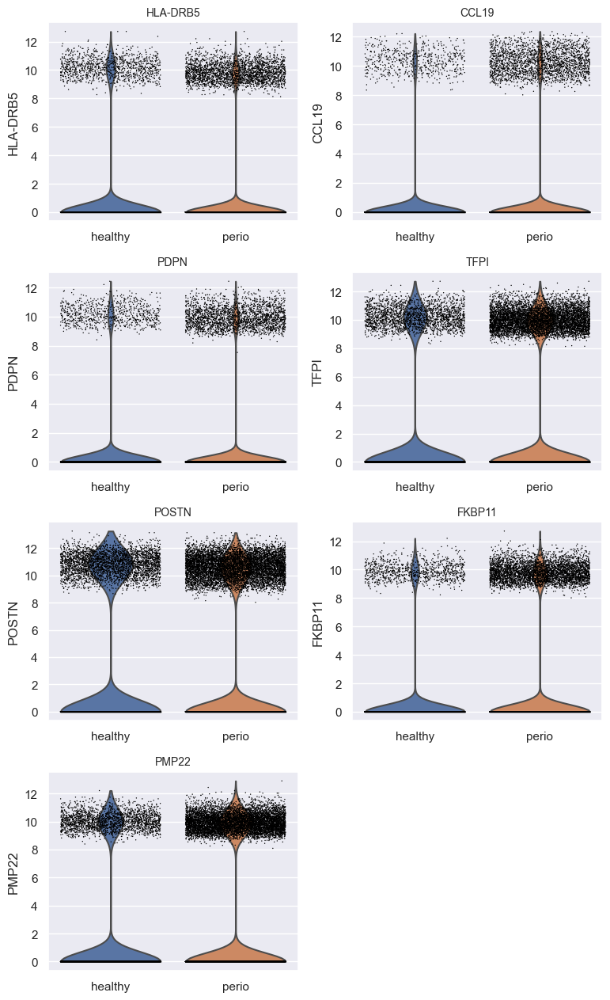

In [40]:
import numpy as np
import math
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd

# Step 2: Manually set niche order
niche_order = ['healthy', 'perio']
adata_stromal_100_500.obs['status.3'] = adata_stromal_100_500.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
'HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22',
]

# Step 4: keep only genes present
genes_to_plot = [g for g in genes_of_interest if g in adata_stromal_100_500.var_names]
if not genes_to_plot:
    raise ValueError("None of the requested genes are present in adata_stromal_100_500.var_names.")

# --- grid with 4 rows ---
n_genes = len(genes_to_plot)
nrows = 4
ncols = math.ceil(n_genes / nrows)

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3.2*nrows))
axes = np.atleast_1d(axes).ravel()

# Draw each gene on its own axis (no return_fig here)
for i, gene in enumerate(genes_to_plot):
    sc.pl.violin(
        adata_stromal_100_500,
        keys=gene,
        groupby="status.3",
        stripplot=True,
        jitter=0.4,
        rotation=0,
        show=False,
        ax=axes[i],
        # use_raw=False,  # uncomment/adjust depending on where your normalized values live
    )
    axes[i].set_title(gene, fontsize=10)

# Hide any unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()

# Save the WHOLE grid figure (the one from plt.subplots)
outpath = "/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/100-500_stromal_Violin.pdf"
fig.savefig(outpath, bbox_inches="tight", dpi=300)
plt.show()

In [34]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
import numpy as np

genes_tested = adata_stromal_100_500.var_names  # <-- ALL genes
raw_p = []
for g in genes_tested:
    x = adata_stromal_100_500[:, g].X.toarray().ravel()
    y = adata_stromal_100_500.obs["status.3"].values
    a = x[y == "healthy"]
    b = x[y == "perio"]
    _, p = mannwhitneyu(a, b, alternative="two-sided")
    raw_p.append(p)

# FDR across all genes
_, qvals, _, _ = multipletests(raw_p, method="fdr_bh")

results = dict(zip(genes_tested, qvals))

# Now just grab your 3
for g in ['HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22']:
    print(g, results[g])


HLA-DRB5 0.00012935945764713008
CCL19 9.569822506712039e-16
PDPN 0.004055821157341891
TFPI 4.032485285221606e-09
POSTN 5.899532709520325e-21
FKBP11 1.9119651689463373e-63
PMP22 3.3543807701300164e-37


In [47]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_stromal_100_500
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = ['HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22']
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

             p_raw  q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                      
FKBP11   6.359e-65 1.912e-63       -7.770e-02 4.612e-01       0.000e+00   
PMP22    1.859e-38 3.354e-37       -7.488e-02 4.626e-01       0.000e+00   
POSTN    6.279e-22 5.900e-21        5.811e-02 5.291e-01       0.000e+00   
CCL19    1.464e-16 9.570e-16       -2.856e-02 4.857e-01       0.000e+00   
TFPI     9.209e-10 4.032e-09       -3.425e-02 4.829e-01       0.000e+00   
HLA-DRB5 4.475e-05 1.294e-04        1.602e-02 5.080e-01       0.000e+00   
PDPN     1.778e-03 4.056e-03       -1.132e-02 4.943e-01       0.000e+00   

          median_perio          direction  
gene                                       
FKBP11       0.000e+00  higher in disease  
PMP22        0.000e+00  higher in disease  
POSTN        0.000e+00  higher in healthy  
CCL19        0.000e+00  higher in disease  
TFPI         0.000e+00  higher in disease  
HLA-DRB5     0.0

In [17]:
import pandas as pd
import numpy as np
from scipy import sparse

adata = adata_stromal_0_100
status_col  = "status.3"
patient_col = "PatientID_Atlas"
genes = ['APCDD1','SELE','SAA1','SAA2','CXCL1','CXCL2','ACKR1','C3','CFB']

# Extract expression
X = adata.raw[:, genes].X if adata.raw is not None else adata[:, genes].X
if sparse.issparse(X):
    X = X.toarray()

# Build dataframe
df = pd.DataFrame(X, columns=genes)
df[patient_col] = adata.obs[patient_col].values
df[status_col]  = adata.obs[status_col].values

# If these are categoricals, drop unused categories to avoid phantom combos
for col in [patient_col, status_col]:
    if pd.api.types.is_categorical_dtype(df[col]):
        df[col] = df[col].cat.remove_unused_categories()
    else:
        # optional: ensure simple dtype (avoids category issues entirely)
        df[col] = df[col].astype(str)

threshold = 0.0

# Long format
long = df.melt(id_vars=[patient_col, status_col],
               var_name="gene", value_name="expr")

# Aggregate — observed=True prevents unused category combos like (H-1, perio)
patient_counts = (
    long.groupby([patient_col, status_col, "gene"], observed=True)
        .agg(
            pos_cells=("expr", lambda x: (x > threshold).sum()),
            total_cells=("expr", "size")
        )
        .reset_index()
)

# Optional safety filter: drop any rows that somehow have zero total cells
patient_counts = patient_counts.query("total_cells > 0").copy()

# Optional fraction
patient_counts["fraction"] = patient_counts["pos_cells"] / patient_counts["total_cells"]
patient_counts.head(30)

,PatientID_Atlas,status.3,gene,pos_cells,total_cells,fraction
0,H-1,healthy,ACKR1,1,63,0.015873
1,H-1,healthy,APCDD1,35,63,0.555556
2,H-1,healthy,C3,27,63,0.428571
3,H-1,healthy,CFB,22,63,0.349206
4,H-1,healthy,CXCL1,5,63,0.079365
5,H-1,healthy,CXCL2,18,63,0.285714
6,H-1,healthy,SAA1,1,63,0.015873
7,H-1,healthy,SAA2,0,63,0.000000
8,H-1,healthy,SELE,4,63,0.063492
9,H-2,healthy,ACKR1,80,710,0.112676


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

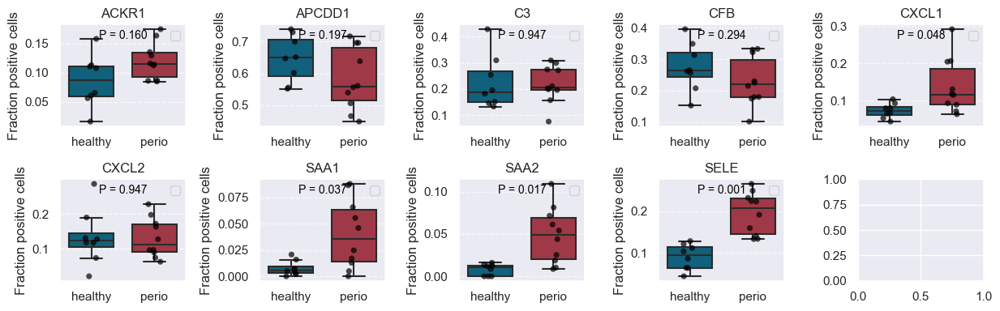

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statsmodels.stats.multitest import multipletests

# Load your data
df = patient_counts

# Filter relevant columns
df = df[['gene', 'status.3', 'fraction', 'PatientID_Atlas']]  # Include 'patient' for uniqueness

# Get unique annotations
annotations = df['gene'].unique()

# Define number of rows and columns for the subplot grid
n_rows = 2
n_cols = (len(annotations) + n_rows - 1) // n_rows  # Calculate number of columns based on number of annotations

# Set up the figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2.5, n_rows * 2))
axes = axes.flatten()  # Flatten the axes array to easily index

# Store p-values for multiple testing correction
p_values = []

# Iterate over each annotation and plot
for idx, annotation in enumerate(annotations):
    # Filter data for the current annotation
    df_annotation = df[df['gene'] == annotation]
    
    # Perform t-test for 'status' groups (Healthy vs Perio) in the current annotation
    healthy_data = df_annotation[df_annotation['status.3'] == 'healthy']['fraction']
    perio_data = df_annotation[df_annotation['status.3'] == 'perio']['fraction']
    
    # Perform t-test
    t_stat, p_val = stats.ttest_ind(healthy_data, perio_data, equal_var=False)  # Welch's t-test
    p_values.append(p_val)
    # Define the desired order
    order = ["healthy", "perio"]

    # Plotting on the corresponding subplot axis
    sns.boxplot(data=df_annotation, x="status.3", y="fraction", 
            palette={"healthy": "#006A8E", "perio": "#B1283A"}, width=0.7, 
            fliersize=0, dodge=True, order=order, ax=axes[idx])  

    # Add individual data points (jittered for visibility)
    sns.stripplot(data=df_annotation, x="status.3", y="fraction", 
              palette={"healthy": "black", "perio": "black"}, dodge=True,
              jitter=True, alpha=0.7, marker="o", edgecolor="black", 
              linewidth=0.1, order=order, ax=axes[idx])

    # Set aesthetics for the subplot
    axes[idx].set_xlabel("")
    axes[idx].set_ylabel("Fraction positive cells")
    axes[idx].set_title(f"{annotation}")
    axes[idx].legend(title="", loc="upper right")
    axes[idx].grid(axis="y", linestyle="--", alpha=0.7)

# Correct p-values for multiple comparisons using Bonferroni
_, corrected_p_values, _, _ = multipletests(p_values, method='fdr_bh')

# Display corrected p-values on the plots
for idx, annotation in enumerate(annotations):
    # Correct p-values
    p_val = corrected_p_values[idx]
    axes[idx].text(0.5, 0.95, f'P = {p_val:.3f}', transform=axes[idx].transAxes, ha='center', va='top', fontsize=10, color='black')

# Adjust layout to ensure labels and titles fit
plt.tight_layout()
#plt.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/Xenium_Lvl2.5_total_clusters_per_area)_polished.pdf', format='pdf')
# Show the figure
plt.show()


In [37]:
cluster_names = ["500–1500"]

adata_stromal_500_1500 = adata_stromal[adata_stromal.obs['distance_bin_100um'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



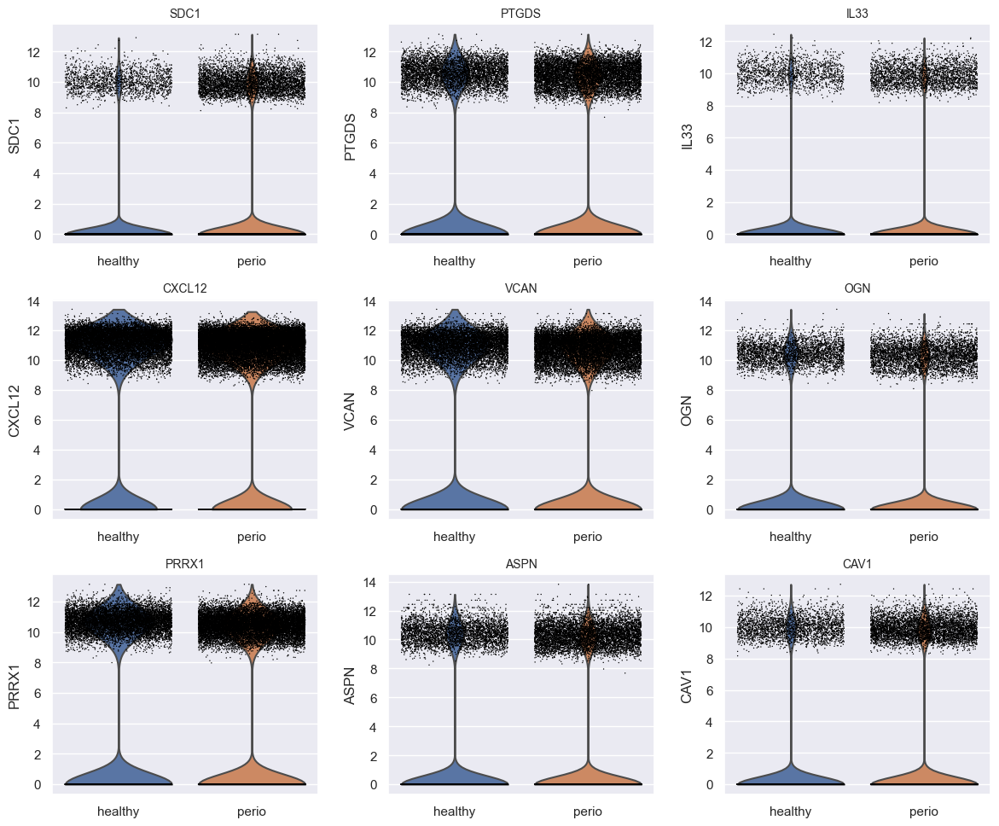

In [62]:
import numpy as np
import math
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd

# Step 2: Manually set niche order
niche_order = ['healthy', 'perio']
adata_stromal_500_1500.obs['status.3'] = adata_stromal_500_1500.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']


# Step 4: keep only genes present
genes_to_plot = [g for g in genes_of_interest if g in adata_stromal_500_1500.var_names]
if not genes_to_plot:
    raise ValueError("None of the requested genes are present in adata_stromal_500_1500.var_names.")

# --- grid with 4 rows ---
n_genes = len(genes_to_plot)
nrows = 4
ncols = math.ceil(n_genes / nrows)

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3.2*nrows))
axes = np.atleast_1d(axes).ravel()

# Draw each gene on its own axis (no return_fig here)
for i, gene in enumerate(genes_to_plot):
    sc.pl.violin(
        adata_stromal_500_1500,
        keys=gene,
        groupby="status.3",
        stripplot=True,
        jitter=0.4,
        rotation=0,
        show=False,
        ax=axes[i],
        # use_raw=False,  # uncomment/adjust depending on where your normalized values live
    )
    axes[i].set_title(gene, fontsize=10)

# Hide any unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()

# Save the WHOLE grid figure (the one from plt.subplots)
outpath = "/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/500-1500_stromal_Violin.pdf"
fig.savefig(outpath, bbox_inches="tight", dpi=300)
plt.show()

In [42]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
import numpy as np

genes_tested = adata_stromal_500_1500.var_names  # <-- ALL genes
raw_p = []
for g in genes_tested:
    x = adata_stromal_500_1500[:, g].X.toarray().ravel()
    y = adata_stromal_500_1500.obs["status.3"].values
    a = x[y == "healthy"]
    b = x[y == "perio"]
    _, p = mannwhitneyu(a, b, alternative="two-sided")
    raw_p.append(p)

# FDR across all genes
_, qvals, _, _ = multipletests(raw_p, method="fdr_bh")

results = dict(zip(genes_tested, qvals))

# Now just grab your 3
for g in [ 'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']:
    print(g, results[g])


PTGDS 0.3203084686002117
IL33 2.008300100136739e-05
CXCL12 2.1293042884770324e-15
VCAN 1.7756706524392724e-40
OGN 2.0482047447149953e-19
PRRX1 3.7110483562540717e-25
ASPN 0.023339332032250724
CAV1 8.028807517849798e-21


In [61]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_stromal_500_1500
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = ['PTGDS', 'IL33', 'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))

# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)


           p_raw  q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                    
VCAN   1.614e-41 1.776e-40        6.625e-02 5.331e-01       0.000e+00   
PRRX1  5.184e-26 3.711e-25        5.178e-02 5.259e-01       0.000e+00   
CAV1   1.282e-21 8.029e-21       -3.252e-02 4.837e-01       0.000e+00   
OGN    3.627e-20 2.048e-19        3.127e-02 5.156e-01       0.000e+00   
CXCL12 4.532e-16 2.129e-15        4.263e-02 5.213e-01       2.460e+00   
IL33   7.793e-06 2.008e-05       -1.163e-02 4.942e-01       0.000e+00   
ASPN   1.351e-02 2.334e-02       -9.567e-03 4.952e-01       0.000e+00   
PTGDS  2.422e-01 3.203e-01       -5.032e-03 4.975e-01       0.000e+00   

        median_perio          direction  
gene                                     
VCAN       0.000e+00  higher in healthy  
PRRX1      0.000e+00  higher in healthy  
CAV1       0.000e+00  higher in disease  
OGN        0.000e+00  higher in healthy  
CXCL12     2.444e

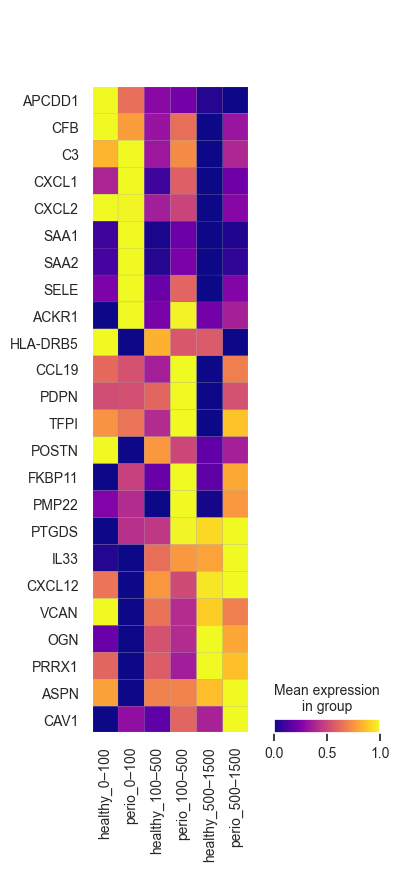

In [84]:
# Step 2: Manually set niche order
niche_order = ['healthy_0–100', 'perio_0–100', 'healthy_100–500', 'perio_100–500',  'healthy_500–1500', 'perio_500–1500']  # en dash!
adata_stromal.obs['status_distance'] = adata_stromal.obs['status_distance'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

# Step 3: Define your curated gene list
genes_of_interest = [
   'APCDD1', 'CFB', 'C3', 
    'CXCL1', 'CXCL2',  'SAA1',
    'SAA2', 'SELE', 'ACKR1', 'HLA-DRB5',  'CCL19', 'PDPN', 'TFPI',   'POSTN', 'FKBP11', 'PMP22',  
    'PTGDS', 'IL33',  'CXCL12', 'VCAN', 'OGN', 'PRRX1', 'ASPN', 'CAV1']

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_stromal.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_stromal,
    var_names=genes_to_plot,
    groupby='status_distance',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/HvsP_Stromal_zones.pdf', bbox_inches='tight')

In [86]:
cluster_names = ["perio"]

adata_perio = adata_included[adata_included.obs['status.3'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [9]:
cluster_names = ["healthy"]

adata_healthy = adata_stromal[adata_stromal.obs['status.3'].isin(cluster_names)].copy()

In [87]:
adata_perio.obs['niche_knn50k10_merged'].unique().tolist()

['Fibrous CT',
 'Epi-CT',
 'Plasma-Fib CT',
 'Plasma',
 'Spinous',
 'Keratin',
 'Crevicular',
 'Lymphoid']

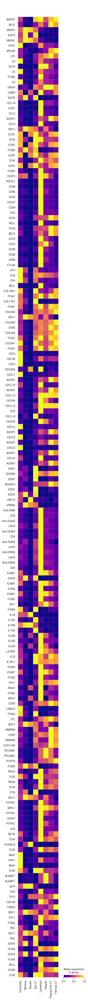

In [88]:
import scanpy as sc
import pandas as pd

# Step 1: Log-transform if not already done
sc.pp.log1p(adata_perio)

# Step 2: Define your manually curated order of niches
CT_niches = [
    'Crevicular', 'Spinous', 'Keratin', 'Epi-CT', 'Lymphoid', 'Plasma',
    'Plasma-Fib CT', 'Fibrous CT'
]

# Step 3: Set the niche column as a categorical with specified order
adata_perio.obs['niche_knn50k10_merged'] = adata_perio.obs['niche_knn50k10_merged'].astype(
    pd.CategoricalDtype(categories=CT_niches, ordered=True)
)

# Step 4: Define your curated gene list
genes_of_interest = ['ANPEP', 'SELE', 'ANXA1', 'EGFR', 'ANXA1', 'FPR1', 'APOA5', 'LPL', 'C3', 'CD19',
'C3', 'ITGB2', 'C3', 'VSIG4', 'CAMP', 'EGFR', 'CCL19', 'CCR7', 'CCL5', 'ACKR1',
'CCL5', 'SDC1', 'CCN1', 'TLR2', 'CCN1', 'ITGB5', 'CCN1', 'TLR4', 'CCN1', 'ITGB2',
'CD274', 'PDCD1', 'CD28', 'CD86', 'CD28', 'CD247', 'CD28', 'CD4', 'CD34', 'SELL',
'CD34', 'SELE', 'CD70', 'CD27', 'CD86', 'CD28', 'CD86', 'CTLA4', 'CFH', 'CFB',
'CFH', 'SELL', 'COL16A1', 'ITGA1', 'COL17A1', 'ITGA1', 'COL5A2', 'SDC1', 'COL5A2',
'CD93', 'COL5A2', 'ITGA1', 'COL8A1', 'ITGA1', 'CSF3', 'CSF3R', 'CSF3', 'CSF2RA',
'CXCL1', 'ACKR1', 'CXCL10', 'ACKR1', 'CXCL12', 'CXCR4', 'CXCL12', 'CD4',
'CXCL14', 'CXCR4', 'CXCL2', 'ACKR1', 'CXCL5', 'ACKR1', 'CXCL6', 'ACKR1',
'CXCL9', 'ACKR1', 'EDN1', 'EDNRB', 'EDN1', 'ADGRL4', 'EDN1', 'EGFR', 'GDF15',
'ERBB2', 'HLA-DMB', 'CD4', 'HLA-DQA2', 'LAG3', 'HLA-DQA2', 'CD4', 'HLA-DQB2',
'LAG3', 'HLA-DRB5', 'LAG3', 'HLA-DRB5', 'CD4', 'ICAM1', 'EGFR', 'ICAM1', 'IL2RA',
'ICAM1', 'ITGB2', 'IGF1', 'ITGB4', 'IL1A', 'IL1R2', 'IL1RN', 'IL1R2', 'IL23A',
'IL23R', 'IL23A', 'LILRB2', 'IL33', 'IL1RL1', 'ITGB2', 'ICAM1', 'ITGB2', 'THY1',
'KNG1', 'ITGB2', 'KNG1', 'CD93', 'LAMC2', 'ITGB4', 'LPL', 'SDC1', 'MMRN2',
'CD93', 'MMRN2', 'CLEC14A', 'PECAM1', 'PECAM1', 'POSTN', 'ITGB5', 'PRG4',
'TLR2', 'PRG4', 'TLR4', 'PTN', 'SDC1', 'PTPRC', 'MRC1', 'PTPRC', 'CD247',
'PTPRC', 'CD4', 'RETN', 'TLR4', 'S100A12', 'TLR4', 'SAA1', 'FPR1', 'SAA1',
'TLR2', 'SLAMF7', 'SLAMF7', 'SLPI', 'CD4', 'TFF2', 'CXCR4', 'THBS2', 'SDC1',
'THY1', 'ITGB2', 'TNC', 'SDC1', 'TNC', 'EGFR', 'VCAN', 'EGFR', 'VCAN', 'SELL',
'VCAN', 'TLR2'
                    ]
# Step 5: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_perio.var_names]

# Step 6: Plot matrixplot using the specified order
sc.pl.matrixplot(
    adata_perio,
    var_names=genes_to_plot,
    groupby='niche_knn50k10_merged',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True
)

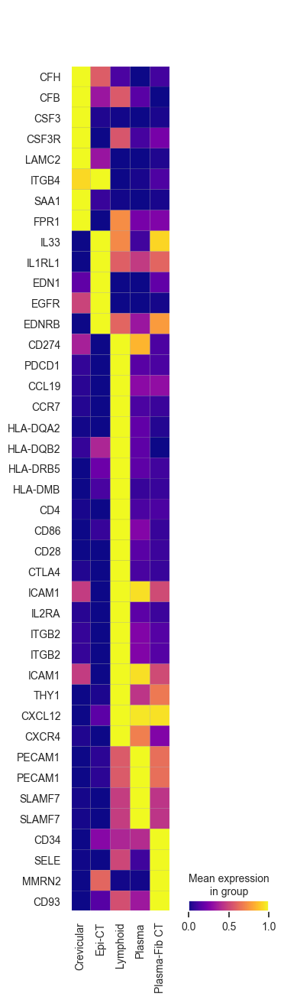

In [84]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Step 1: Log-transform if not already done
sc.pp.log1p(adata_perio)

# Step 2: Define your manually curated order of niches
CT_niches = [
    'Crevicular', 'Epi-CT', 'Lymphoid', 'Plasma',
    'Plasma-Fib CT'
]

# Step 3: Set the niche column as a categorical with specified order
adata_perio.obs['niche_knn50k10_merged'] = adata_perio.obs['niche_knn50k10_merged'].astype(
    pd.CategoricalDtype(categories=CT_niches, ordered=True)
)

# Step 4: Define your curated gene list
genes_of_interest = [
    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"
]

# Step 5: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_perio.var_names]

# Step 6: Plot matrixplot and manually save to full path
fig = sc.pl.matrixplot(
    adata_perio,
    var_names=genes_to_plot,
    groupby='niche_knn50k10_merged',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/New_L-R_per_niche.pdf', bbox_inches='tight')

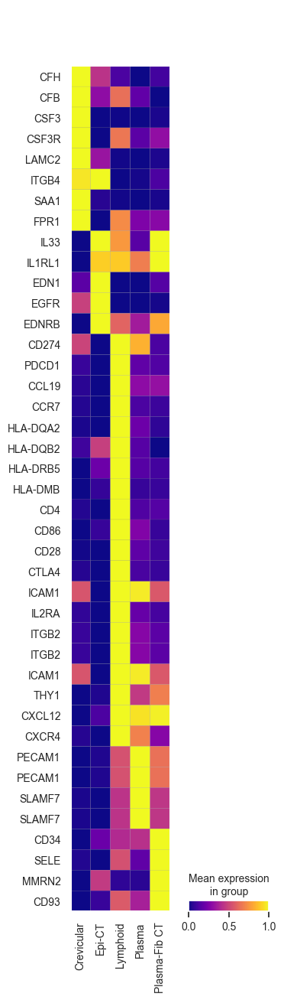

In [73]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Step 1: Log-transform if not already done
sc.pp.log1p(adata_included)

# Step 2: Define your manually curated order of niches
CT_niches = [
    'Crevicular', 'Epi-CT', 'Lymphoid', 'Plasma',
    'Plasma-Fib CT'
]

# Step 3: Set the niche column as a categorical with specified order
adata_included.obs['niche_knn50k10_merged'] = adata_included.obs['niche_knn50k10_merged'].astype(
    pd.CategoricalDtype(categories=CT_niches, ordered=True)
)

# Step 4: Define your curated gene list
genes_of_interest = [
    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"
]

# Step 5: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_included.var_names]

# Step 6: Plot matrixplot and manually save to full path
fig = sc.pl.matrixplot(
    adata_included,
    var_names=genes_to_plot,
    groupby='niche_knn50k10_merged',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/New_L-R_per_niche_total.pdf', bbox_inches='tight')

In [92]:
adata_included.obs['status_niche'].unique().tolist()

['perio_Fibrous CT',
 'perio_Epi-CT',
 'perio_Plasma-Fib CT',
 'perio_Plasma',
 'perio_Spinous',
 'perio_Keratin',
 'perio_Crevicular',
 'perio_Lymphoid',
 'healthy_Fibrous CT',
 'healthy_Plasma-Fib CT',
 'healthy_Crevicular',
 'healthy_Lymphoid',
 'healthy_Plasma',
 'healthy_Epi-CT',
 'healthy_Spinous',
 'healthy_Keratin']

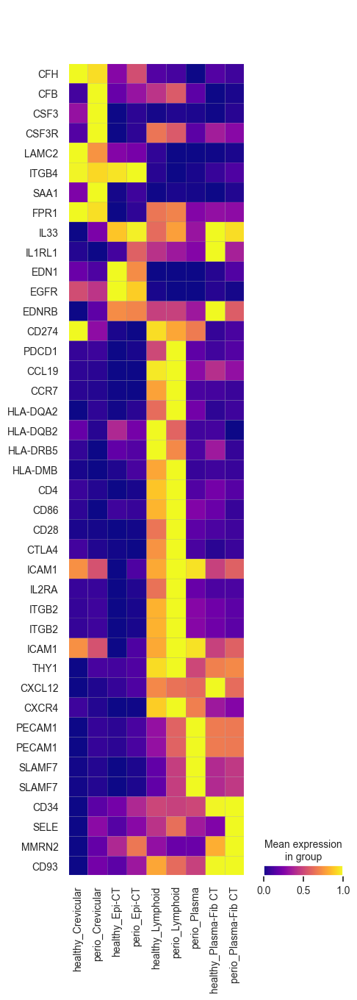

In [93]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Step 1: Log-transform if not already done
sc.pp.log1p(adata_included)

# Step 2: Define your manually curated order of niches
CT_niches = [
'healthy_Crevicular', 'perio_Crevicular', 'healthy_Epi-CT', 'perio_Epi-CT', 'healthy_Lymphoid', 'perio_Lymphoid', 
               'perio_Plasma', 'healthy_Plasma-Fib CT', 'perio_Plasma-Fib CT',
]

# Step 3: Set the niche column as a categorical with specified order
adata_included.obs['status_niche'] = adata_included.obs['status_niche'].astype(
    pd.CategoricalDtype(categories=CT_niches, ordered=True)
)

# Step 4: Define your curated gene list
genes_of_interest = [
    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"
]

# Step 5: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_included.var_names]

# Step 6: Plot matrixplot and manually save to full path
fig = sc.pl.matrixplot(
    adata_included,
    var_names=genes_to_plot,
    groupby='status_niche',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/New_HvsP_L-R_per_niche.pdf', bbox_inches='tight')

In [63]:
cluster_names = ["Crevicular"]

adata_TAE = adata_included[adata_included.obs['niche_knn50k10_merged'].isin(cluster_names)].copy()

In [64]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_TAE
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = [    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"]
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

              p_raw   q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                        
SAA1     2.045e-257 9.222e-255       -2.331e-01 3.835e-01       0.000e+00   
CSF3     6.576e-147 7.414e-145       -1.593e-01 4.203e-01       0.000e+00   
LAMC2     2.111e-61  5.289e-60        1.210e-01 5.605e-01       0.000e+00   
CFB       1.642e-34  2.644e-33       -7.141e-02 4.643e-01       0.000e+00   
CSF3R     7.440e-26  9.869e-25       -3.342e-02 4.833e-01       0.000e+00   
PECAM1    3.847e-23  4.449e-22       -4.456e-02 4.777e-01       0.000e+00   
PECAM1    3.847e-23  4.449e-22       -4.456e-02 4.777e-01       0.000e+00   
SELE      1.047e-15  8.586e-15       -1.692e-02 4.915e-01       0.000e+00   
HLA-DQB2  2.726e-15  2.157e-14        2.428e-02 5.121e-01       0.000e+00   
CXCR4     1.561e-13  1.154e-12        2.836e-02 5.142e-01       0.000e+00   
ICAM1     3.648e-12  2.419e-11        4.144e-02 5.207e-01       0.000e+00   

In [70]:
cluster_names = ["Epi-CT"]

adata_Epi_CT = adata_included[adata_included.obs['niche_knn50k10_merged'].isin(cluster_names)].copy()

In [67]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_Epi_CT
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = [    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"]
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

              p_raw   q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                        
CFH       0.000e+00  0.000e+00       -1.308e-01 4.346e-01       0.000e+00   
SAA1     1.054e-210 3.170e-209       -2.447e-02 4.878e-01       0.000e+00   
CSF3     8.225e-113 1.279e-111       -1.216e-02 4.939e-01       0.000e+00   
EGFR     1.725e-112 2.594e-111        6.637e-02 5.332e-01       0.000e+00   
PECAM1   2.590e-110 3.769e-109       -4.081e-02 4.796e-01       0.000e+00   
PECAM1   2.590e-110 3.769e-109       -4.081e-02 4.796e-01       0.000e+00   
HLA-DQB2  1.279e-67  1.202e-66        2.756e-02 5.138e-01       0.000e+00   
ICAM1     2.177e-65  2.004e-64       -2.738e-02 4.863e-01       0.000e+00   
ICAM1     2.177e-65  2.004e-64       -2.738e-02 4.863e-01       0.000e+00   
EDN1      5.304e-60  4.600e-59        3.032e-02 5.152e-01       0.000e+00   
SLAMF7    1.858e-59  1.581e-58       -1.439e-02 4.928e-01       0.000e+00   

In [69]:
cluster_names = ["Lymphoid"]

adata_TBAPC = adata_included[adata_included.obs['niche_knn50k10_merged'].isin(cluster_names)].copy()

In [71]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_TBAPC
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = [    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"]
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

              p_raw   q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                        
SLAMF7   6.085e-131 3.049e-129       -1.743e-01 4.128e-01       0.000e+00   
SLAMF7   6.085e-131 3.049e-129       -1.743e-01 4.128e-01       0.000e+00   
PECAM1    2.494e-92  9.373e-91       -1.636e-01 4.182e-01       0.000e+00   
PECAM1    2.494e-92  9.373e-91       -1.636e-01 4.182e-01       0.000e+00   
HLA-DRB5  2.496e-72  7.504e-71        1.385e-01 5.692e-01       0.000e+00   
HLA-DQB2  2.365e-41  4.444e-40        7.382e-02 5.369e-01       0.000e+00   
CD28      2.660e-33  3.999e-32       -8.448e-02 4.578e-01       0.000e+00   
LAMC2     5.008e-27  6.274e-26        2.484e-02 5.124e-01       0.000e+00   
HLA-DQA2  5.154e-24  5.960e-23       -6.720e-02 4.664e-01       0.000e+00   
CXCL12    2.037e-22  2.187e-21        8.079e-02 5.404e-01       0.000e+00   
ITGB4     9.342e-13  6.288e-12        2.743e-02 5.137e-01       0.000e+00   

In [78]:
cluster_names = ["Plasma"]

adata_Plasma = adata_included[adata_included.obs['niche_knn50k10_merged'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [75]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_Plasma
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = [    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"]
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

             p_raw  q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                      
CXCL12   3.759e-28 1.695e-25        2.913e-01 6.457e-01       1.224e+00   
CCL19    1.324e-10 8.527e-09        6.316e-02 5.316e-01       0.000e+00   
CCR7     7.838e-08 2.105e-06        5.294e-02 5.265e-01       0.000e+00   
SLAMF7   2.601e-06 3.666e-05       -1.330e-01 4.335e-01       0.000e+00   
SLAMF7   2.601e-06 3.666e-05       -1.330e-01 4.335e-01       0.000e+00   
THY1     1.062e-04 1.064e-03        6.459e-02 5.323e-01       0.000e+00   
PECAM1   9.984e-04 7.764e-03       -9.419e-02 4.529e-01       1.211e+00   
PECAM1   9.984e-04 7.764e-03       -9.419e-02 4.529e-01       1.211e+00   
SELE     8.307e-03 4.561e-02       -2.137e-02 4.893e-01       0.000e+00   
CTLA4    8.394e-03 4.561e-02        2.153e-02 5.108e-01       0.000e+00   
CD28     1.226e-02 6.011e-02        2.963e-02 5.148e-01       0.000e+00   
CD4      1.590e-02 7.393e

In [77]:
cluster_names = ["Plasma-Fib CT"]

adata_Im_Str = adata_included[adata_included.obs['niche_knn50k10_merged'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [79]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy import sparse
import numpy as np
import pandas as pd

adata = adata_Im_Str
status_col = "status.3"
genes_tested = adata.var_names  # ALL genes

# Prepare labels once
y = adata.obs[status_col].values
mask_h = (y == "healthy")
mask_p = (y == "perio")

results = []

def col1d(Acol):
    """Return gene column as 1D numpy array, works for sparse or dense."""
    if sparse.issparse(Acol):
        return np.ravel(Acol.toarray())
    return np.ravel(Acol)

for g in genes_tested:
    x = col1d(adata[:, g].X)
    a = x[mask_h]
    b = x[mask_p]

    # Skip genes with empty groups (shouldn't happen, but safe)
    if a.size == 0 or b.size == 0:
        results.append((g, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan))
        continue

    U, p = mannwhitneyu(a, b, alternative="two-sided")

    n1 = a.size
    n2 = b.size
    Ahat = U / (n1 * n2)                 # Common Language Effect Size (prob cell_healthy > cell_perio)
    r_rb = 2 * Ahat - 1                  # Rank-biserial correlation in [-1, 1]
    med_h = float(np.median(a))
    med_p = float(np.median(b))

    results.append((g, p, U, Ahat, r_rb, med_h, med_p))

# Assemble DataFrame and FDR-correct across ALL genes
df = pd.DataFrame(results, columns=["gene", "p_raw", "U", "Ahat", "r_rank_biserial", "median_healthy", "median_perio"])
_, q, _, _ = multipletests(df["p_raw"].fillna(1.0).values, method="fdr_bh")
df["q_fdr_bh"] = q

# Direction label for readability
def direction(row):
    if np.isnan(row["r_rank_biserial"]):
        return "NA"
    return "higher in healthy" if row["r_rank_biserial"] > 0 else "higher in disease"

df["direction"] = df.apply(direction, axis=1)

# Lookup your genes of interest
genes_of_interest = [    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"]
out = (df.set_index("gene")
         .loc[[g for g in genes_of_interest if g in df["gene"].values],
              ["p_raw", "q_fdr_bh", "r_rank_biserial", "Ahat", "median_healthy", "median_perio", "direction"]]
         .sort_values("q_fdr_bh"))
# Pretty print
pd.options.display.float_format = lambda v: f"{v:.3e}"
print(out)

              p_raw   q_fdr_bh  r_rank_biserial      Ahat  median_healthy  \
gene                                                                        
CXCL12   2.008e-214 9.054e-212        2.324e-01 6.162e-01       1.229e+00   
HLA-DRB5  1.486e-80  2.234e-78        9.002e-02 5.450e-01       0.000e+00   
SELE      8.587e-38  3.520e-36       -4.404e-02 4.780e-01       0.000e+00   
HLA-DQB2  3.650e-12  4.115e-11        1.761e-02 5.088e-01       0.000e+00   
ITGB4     3.797e-12  4.176e-11       -3.377e-02 4.831e-01       0.000e+00   
EDNRB     1.398e-11  1.433e-10        1.662e-02 5.083e-01       0.000e+00   
CXCR4     4.221e-11  4.051e-10        3.633e-02 5.182e-01       0.000e+00   
SAA1      4.176e-10  3.693e-09       -9.622e-03 4.952e-01       0.000e+00   
CSF3      1.796e-09  1.472e-08       -9.510e-03 4.952e-01       0.000e+00   
SLAMF7    4.497e-07  2.669e-06       -3.271e-02 4.836e-01       0.000e+00   
SLAMF7    4.497e-07  2.669e-06       -3.271e-02 4.836e-01       0.000e+00   

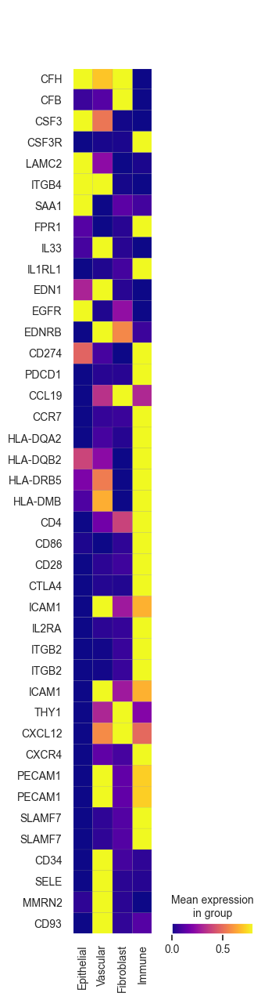

In [95]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Step 1: Log-transform if not already done
sc.pp.log1p(adata_perio)

# Step 2: Define your manually curated order of niches
CT_niches = [
    'Epithelial', 'Vascular', 'Fibroblast',
    'Immune'
]

# Step 3: Set the niche column as a categorical with specified order
adata_perio.obs['Lvl1'] = adata_perio.obs['Lvl1'].astype(
    pd.CategoricalDtype(categories=CT_niches, ordered=True)
)

# Step 4: Define your curated gene list
genes_of_interest = [
    "CFH", "CFB", "CSF3", "CSF3R", "LAMC2", "ITGB4", "SAA1", "FPR1", "IL33", "IL1RL1", "EDN1", "EGFR", "EDNRB", "CD274", "PDCD1",
    "CCL19", "CCR7",  "HLA-DQA2", "HLA-DQB2", "HLA-DRB5", "HLA-DMB", "CD4", "CD86", "CD28", "CTLA4", "ICAM1", "IL2RA", "ITGB2", "ITGB2", "ICAM1", "THY1", "CXCL12", "CXCR4",
    "PECAM1", "PECAM1", "SLAMF7", "SLAMF7",  "CD34", "SELE", "MMRN2", "CD93"
]

# Step 5: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_perio.var_names]

# Step 6: Plot matrixplot and manually save to full path
fig = sc.pl.matrixplot(
    adata_perio,
    vmax=0.8,
    var_names=genes_to_plot,
    groupby='Lvl1',
    use_raw=False,
    cmap="plasma",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)

# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/L-R_per_Lvl1.pdf', bbox_inches='tight')

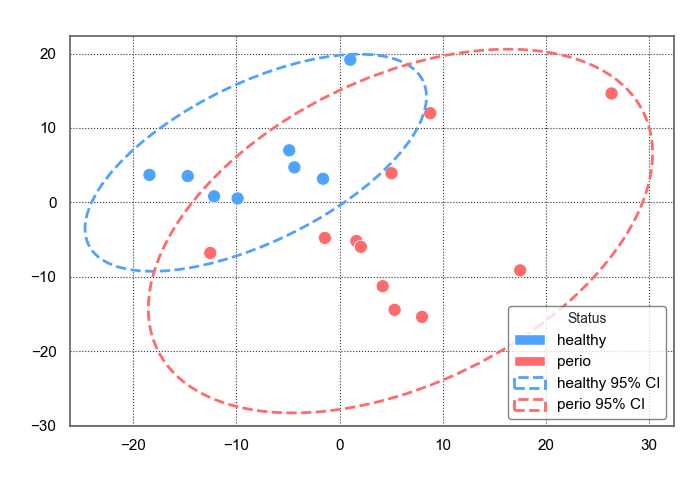

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Ellipse, Patch
from scipy.stats import chi2

# ---------- Helpers ----------
def plot_confidence_ellipse(x, y, ax, conf=0.95, edgecolor='white', facecolor='none', label=None):
    x = np.asarray(x); y = np.asarray(y)
    if x.size < 2:  # need at least 2 points
        return None
    cov = np.cov(x, y)
    if not np.isfinite(cov).all() or np.linalg.det(cov) <= 0:
        return None

    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))

    # 95% ellipse scaling for 2D Gaussian: sqrt(chi2.ppf(0.95, df=2)) ≈ 2.447
    scale = np.sqrt(chi2.ppf(conf, df=2))
    width, height = 2 * scale * np.sqrt(vals)
    cx, cy = np.mean(x), np.mean(y)

    e = Ellipse((cx, cy), width=width, height=height, angle=theta,
                edgecolor=edgecolor, facecolor=facecolor, linestyle='--', linewidth=2, label=label)
    ax.add_patch(e)
    return e

# ---------- 1) Aggregate mean expression per sample (vectorized) ----------
# Create a categorical index for grouping
pid = adata_included.obs['PatientID_Atlas']
# Get dense (n_cells x n_genes) in chunks if big
X = adata_included.X
if hasattr(X, "toarray"):
    X = X.toarray()

df_expr = pd.DataFrame(X, index=adata_included.obs_names, columns=adata_included.var_names)
df_expr['PatientID_Atlas'] = pid.values
df_sample_expr = df_expr.groupby('PatientID_Atlas').mean().astype(float)

# ---------- 2) Status per sample ----------
sample_status = (adata_included.obs[['PatientID_Atlas', 'status.3']]
                 .drop_duplicates()
                 .set_index('PatientID_Atlas')
                 .reindex(df_sample_expr.index))

# map colors; include a fallback
color_map = {'healthy': '#4DA3FF', 'perio': '#FF6B6B'}  # feel free to tweak
colors = sample_status['status.3'].map(color_map).fillna('#AAAAAA')

# ---------- 3) Scale genes and PCA ----------
scaler = StandardScaler(with_mean=True, with_std=True)
X_scaled = scaler.fit_transform(df_sample_expr.values)

pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# ---------- 4) Plot (dark theme) ----------
fig, ax = plt.subplots(figsize=(7, 5), facecolor='white')
ax.set_facecolor('white')

sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=colors.values, s=90,
                edgecolor='white', linewidths=0.6)

# Ellipses per status
ellipse_handles = []
for status, col in color_map.items():
    mask = (sample_status['status.3'] == status).values
    if np.sum(mask) >= 2:
        e = plot_confidence_ellipse(X_pca[mask, 0], X_pca[mask, 1], ax,
                                    conf=0.95, edgecolor=col, facecolor='none',
                                    label=f'{status} 95% CI')
        if e is not None:
            ellipse_handles.append(e)

# Labels, ticks, grid
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)", color='white')
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)", color='white')
ax.set_title("Sample-level PCA (per-sample mean expression)", color='white', pad=10)

for spine in ax.spines.values():
    spine.set_color('#666666')
ax.tick_params(colors='black')
ax.grid(True, color='#333333', linestyle=':', linewidth=0.8)

# Legend (points + ellipses)
point_handles = [Patch(facecolor=c, edgecolor='white', label=l) for l, c in color_map.items()]
if colors.isin(['#AAAAAA']).any():
    point_handles.append(Patch(facecolor='#AAAAAA', edgecolor='black', label='unknown'))

handles = point_handles + ellipse_handles
leg = ax.legend(handles=handles, title="Status", facecolor='white', edgecolor='#666666', labelcolor='black', title_fontsize=10)
plt.setp(leg.get_texts(), color='black')

plt.tight_layout()

# ---------- 5) Save ----------
out_base = '/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/Patient_PCA_Xenium'
fig.savefig(out_base + '.pdf', bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

In [24]:
from statsmodels.multivariate.manova import MANOVA

df_pca = pd.DataFrame(X_pca, index=df_sample_expr.index, columns=['PC1', 'PC2'])
df_pca['status'] = sample_status['status.3'].values

maov = MANOVA.from_formula('PC1 + PC2 ~ status', data=df_pca)
print(maov.mv_test())

                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.4843 2.0000 16.0000  8.5184 0.0030
         Pillai's trace 0.5157 2.0000 16.0000  8.5184 0.0030
 Hotelling-Lawley trace 1.0648 2.0000 16.0000  8.5184 0.0030
    Roy's greatest root 1.0648 2.0000 16.0000  8.5184 0.0030
------------------------------------------------------------
                                                            
------------------------------------------------------------
         status         Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.3522 2.0000 16.0000 14.7136 0.0002
         Pillai's trace 0.6478 2.0000 16.0000 14.7136 0.0002
 Hotelling-Lawley trace 1.8392 2.0000 16.0

In [33]:
import numpy as np
import pandas as pd
from scipy.stats import chi2

X = df_pca[['PC1','PC2']].values
mu = X.mean(axis=0)
cov = np.cov(X, rowvar=False)
inv_cov = np.linalg.inv(cov)

md = [np.dot((x-mu).T, np.dot(inv_cov, (x-mu))) for x in X]
pvals = 1 - chi2.cdf(md, df=X.shape[1])

print("Proportion with p<0.05 (should be ~0.05 if normal):", (pvals<0.05).mean())


Proportion with p<0.05 (should be ~0.05 if normal): 0.05263157894736842


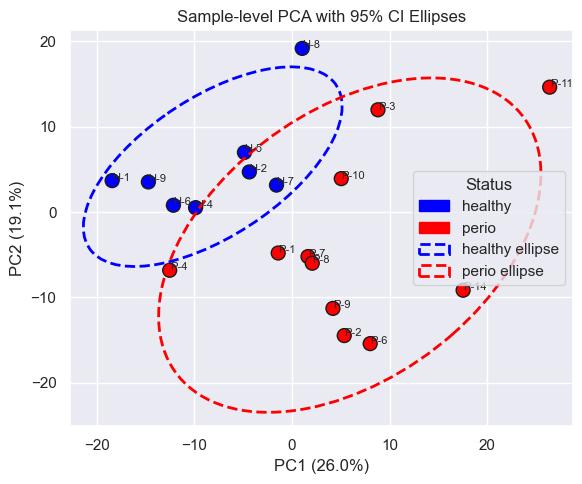

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches
import matplotlib.transforms as transforms
from matplotlib.patches import Ellipse

# Function to draw 95% confidence ellipse
def plot_confidence_ellipse(x, y, ax, n_std=1.96, edgecolor='black', facecolor='none', label=None):
    if x.size <= 1:
        return
    cov = np.cov(x, y)
    if np.linalg.det(cov) == 0:
        return  # Skip if covariance is degenerate

    # Compute ellipse properties
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))

    width, height = 2 * n_std * np.sqrt(vals)
    mean_x, mean_y = np.mean(x), np.mean(y)

    ellipse = Ellipse((mean_x, mean_y),
                      width=width,
                      height=height,
                      angle=theta,
                      edgecolor=edgecolor,
                      facecolor=facecolor,
                      linestyle='--',
                      linewidth=2,
                      label=label)
    ax.add_patch(ellipse)

# Step 1: Get unique sample IDs
sample_ids = adata_included.obs['PatientID_Atlas'].unique()

# Step 2: Aggregate mean expression per sample
sample_expr = []
for sample in sample_ids:
    sample_mask = adata_included.obs['PatientID_Atlas'] == sample
    X_sample = adata_included[sample_mask].X
    mean_expr = X_sample.mean(axis=0)
    if hasattr(mean_expr, 'A1'):
        mean_expr = mean_expr.A1
    sample_expr.append(mean_expr)

# Step 3: Create DataFrame of samples × genes
df_sample_expr = pd.DataFrame(sample_expr, index=sample_ids, columns=adata_included.var_names)

# Optional: use only highly variable genes
if 'highly_variable' in adata_included.var.columns:
    hvg_genes = adata_included.var_names[adata.var['highly_variable']]
    df_sample_expr = df_sample_expr[hvg_genes]

# Step 4: Normalize across genes (z-score per gene)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_sample_expr)

# Step 5: PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Step 6: Extract status per sample
sample_status = adata_included.obs[['PatientID_Atlas', 'status.3']].drop_duplicates().set_index('PatientID_Atlas')
status_aligned = sample_status.loc[sample_ids, 'status.3']

# Step 7: Assign colors to statuses
color_map = {'healthy': 'blue', 'perio': 'red'}
colors = status_aligned.map(color_map)

# Step 8: Plot PCA with ellipses
fig, ax = plt.subplots(figsize=(6, 5))
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=100, edgecolor='k')

# Annotate sample names
for i, name in enumerate(sample_ids):
    ax.text(X_pca[i, 0], X_pca[i, 1], name, fontsize=8)

# Add confidence ellipses per group
for status, color in color_map.items():
    mask = (status_aligned == status).values
    plot_confidence_ellipse(X_pca[mask, 0], X_pca[mask, 1], ax, edgecolor=color, label=f"{status} ellipse")

# Axis labels and title
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
ax.set_title("Sample-level PCA with 95% CI Ellipses")

# Legend
legend_patches = [mpatches.Patch(color=c, label=l) for l, c in color_map.items()]
ax.legend(handles=legend_patches + ax.patches[-2:], title="Status", loc='best')

ax.grid(True)
plt.tight_layout()
plt.show()

In [101]:
# List of immune-relevant keywords to search in GO term names
keywords = ['cytokine', 'chemokine']

# Create one regex pattern
import re
pattern = '|'.join(keywords)

# Filter GO terms by keyword match
mask = df['GO term name'].str.contains(pattern, case=False, na=False, regex=True)
filtered_df = df[mask]

# Extract gene names
functional_genes = filtered_df['Gene name'].dropna().unique().tolist()
print(f"Found {len(functional_genes)} genes matching immune-related keywords in GO term names.")


Found 74 genes matching immune-related keywords in GO term names.


In [ ]:
adata_included.obs['status_niche'] = adata_included.obs['status.3'].astype(str) + '_' + adata_included.obs['niche_knn50k10_merged'].astype(str)

In [102]:
print(functional_genes)

['IL3RA', 'CSF2RA', 'POSTN', 'LIF', 'TFF2', 'BMP4', 'CLEC4E', 'CLEC7A', 'CXCL6', 'SAA1', 'IL7R', 'PLD4', 'BTNL9', 'ADIPOQ', 'CCL27', 'CCL19', 'SELE', 'SELL', 'AIF1', 'CTSG', 'CCL5', 'CAV1', 'LILRA5', 'PTPRC', 'TIMP4', 'LILRB4', 'CXCL2', 'CXCL9', 'CXCL10', 'ACE2', 'KIT', 'CD274', 'CXCL1', 'CXCL5', 'IL1RL1', 'FOXP3', 'AGER', 'TLR4', 'CD14', 'HAVCR2', 'CCR6', 'CCR2', 'CXCL14', 'IL23A', 'LPL', 'GDF15', 'IL17A', 'IL17F', 'CXCL12', 'NOD2', 'IL33', 'PDPN', 'ARG1', 'IL1R2', 'INS', 'EDN1', 'TREM2', 'PLCG2', 'FFAR2', 'TLR2', 'STAT3', 'CXCR4', 'IL36G', 'IL36A', 'IL1RN', 'IL1A', 'CSF3', 'IL23R', 'CCR7', 'CD28', 'CSF3R', 'ACKR1', 'SLAMF1', 'S100A13']


In [8]:
# Step 1: Define your genes of interest
genes_of_interest = [
'IL3RA', 'CSF2RA', 'POSTN', 'LIF', 'TFF2', 'BMP4', 
    'CLEC4E', 'CLEC7A', 'CXCL6', 'SAA1', 'IL7R', 'PLD4', 'BTNL9', 'ADIPOQ', 
    'CCL27', 'CCL19', 'SELE', 'SELL', 'AIF1', 'CTSG', 'CCL5', 'CAV1', 'LILRA5', 
    'PTPRC', 'TIMP4', 'LILRB4', 'CXCL2', 'CXCL9', 'CXCL10', 'ACE2', 'KIT', 'CD274', 
    'CXCL1', 'CXCL5', 'IL1RL1', 'FOXP3', 'AGER', 'TLR4', 'CD14', 'HAVCR2', 'CCR6', 
    'CCR2', 'CXCL14', 'IL23A', 'LPL', 'GDF15', 'IL17A', 'IL17F', 'CXCL12', 'NOD2', 'IL33', 
    'PDPN', 'ARG1', 'IL1R2', 'INS', 'EDN1', 'TREM2', 'PLCG2', 'FFAR2', 'TLR2', 'STAT3', 
    'CXCR4', 'IL36G', 'IL36A', 'IL1RN', 'IL1A', 'CSF3', 'IL23R', 'CCR7', 'CD28', 'CSF3R', 'ACKR1', 'SLAMF1', 'S100A13'
]
# Keep only genes present in the dataset
valid_genes = [gene for gene in genes_of_interest if gene in adata_stromal.var_names]
adata_stromal_filtered = adata_stromal[:, valid_genes].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [11]:
import scipy.sparse

cluster_data = adata_stromal_filtered[adata_stromal_filtered.obs['distance_bin_100um'] == cluster]

if scipy.sparse.issparse(adata_stromal_filtered.X):
    adata_stromal_filtered.X = adata_stromal_filtered.X.toarray()
gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).flatten()


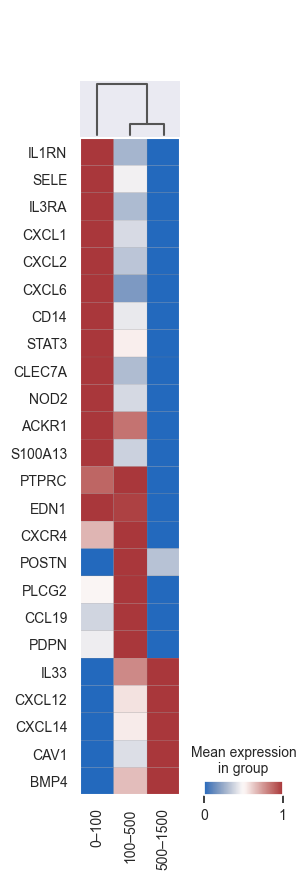

In [18]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_stromal_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_stromal_filtered, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_stromal_filtered.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_stromal_filtered.uns['rank_genes_groups']['names'][cluster][:30]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_stromal_filtered, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_stromal_filtered.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_stromal_filtered[adata_stromal_filtered.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).flatten()
  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 30:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_stromal_filtered,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [7]:
# Confirm everything looks good
print(adata_stromal.obs['distance_bin_100um'].value_counts())

500–1500    52265
100–500     35340
0–100       17017
Name: distance_bin_100um, dtype: int64


In [60]:
adata_stromal.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_bin_100um
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,100–500
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,100–500
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,100–500
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,100–500
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,100–500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,6,11,6,0,0,0,Fib CT 1,Fibrous CT,609.640863,500–1500
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,1,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,693.317526,500–1500
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,692.303945,500–1500


In [61]:
adata_stromal.obs['distance_to_TAE'].isna().sum()

61164

In [66]:
# Confirm everything looks good
print(adata_stromal.obs['Lvl2'].value_counts())

Fibroblast    65605
Vascular      39017
Name: Lvl2, dtype: int64


In [52]:
# Confirm everything looks good
print(adata_nonimmune.obs['Lvl2'].value_counts())

Oral Epi          202810
Fibroblast        105203
Vascular           60583
Crevicular Epi     23256
Name: Lvl2, dtype: int64


In [50]:
adata_stromal.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_bin_100um
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,100–500
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,100–500
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,100–500
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,100–500
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,100–500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,6,11,6,0,0,0,Fib CT 1,Fibrous CT,609.640863,500–1500
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,1,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,693.317526,500–1500
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,692.303945,500–1500


In [80]:
# Define the cluster name you want to subset
cluster_name = "Crev"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_TAE = adata_included[adata_included.obs['Lvl3'] == cluster_name].copy()

In [81]:
import numpy as np
import pandas as pd
from scipy.stats import ranksums
from statsmodels.stats.multitest import multipletests


# Extract indices for Crevicular and Oral groups
healthy_indices = adata_TAE.obs['status.3'] == 'healthy'
perio_indices = adata_TAE.obs['status.3'] == 'perio'

# Extract expression data for Crevicular and Oral groups
healthy_expr = adata_TAE[healthy_indices, :].X.toarray()
perio_expr = adata_TAE[perio_indices, :].X.toarray()

# Initialize lists to store results
gene_names = []  # List for gene names
log2fc = []      # List for log2 fold changes
p_values = []     # List for p-values

# Assuming the gene names are stored in the column headers of crev_expr and oral_expr
# You can adjust this depending on how your gene names are stored in your data
gene_names = adata_TAE.var_names.tolist()

# Perform Wilcoxon Rank-Sum test for each gene
for gene in range(healthy_expr.shape[1]):  # Iterate over genes (columns)
    healthy_gene_expression = healthy_expr[:, gene]  # Expression data for gene in Crevicular Epi
    perio_gene_expression = perio_expr[:, gene]  # Expression data for gene in Oral Epi

    # Wilcoxon Rank-Sum Test (Mann-Whitney U Test)
    stat, p_val = ranksums(perio_gene_expression, healthy_gene_expression)

    # Log2 Fold Change (mean of Crevicular Epi / Oral Epi)
    mean_healthy = np.mean(healthy_gene_expression)
    mean_perio = np.mean(perio_gene_expression)
    log2_fold_change = np.log2(mean_perio / mean_healthy)  # Crevicular Epi vs Oral Epi fold change
    
    # Store results
    log2fc.append(log2_fold_change)
    p_values.append(p_val)

# Step 3: Adjust p-values for multiple testing using Benjamini-Hochberg correction
_, p_values_adj, _, _ = multipletests(p_values, method='fdr_bh')

# Step 4: Create a DataFrame with the results
dge_results = pd.DataFrame({
    'Gene Name': gene_names,
    'Log2 Fold Change (Healthy vs Perio)': log2fc,
    'P-Value': p_values,
    'Adjusted P-Value (FDR)': p_values_adj
})

# Step 5: Display the top significant genes (optional, based on FDR)
# You can filter based on your preferred significance threshold (e.g., FDR < 0.05)
significant_genes = dge_results[dge_results['Adjusted P-Value (FDR)'] < 0.01]

# Display results
print(dge_results.head())  # Show the first few results
print(f"Number of significant genes (FDR < 0.05): {len(significant_genes)}")

/tmp/ipykernel_1596771/4098224417.py:35: RuntimeWarning:

invalid value encountered in float_scalars

/tmp/ipykernel_1596771/4098224417.py:35: RuntimeWarning:

divide by zero encountered in float_scalars



  Gene Name  Log2 Fold Change (Healthy vs Perio)   P-Value  \
0    ABCC11                            -0.348006  0.997754   
1      ACE2                            -0.088596  0.982117   
2     ACKR1                             0.781278  0.894269   
3     ACTA2                            -0.131299  0.923566   
4     ACTG2                            -0.221617  0.000021   

   Adjusted P-Value (FDR)  
0                1.000000  
1                1.000000  
2                1.000000  
3                1.000000  
4                0.000205  
Number of significant genes (FDR < 0.05): 59


In [82]:
# Set pandas display option to show all rows
pd.set_option('display.max_rows', None)  # Display all rows

# Display full results of significant genes
print(significant_genes)

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
4       ACTG2                            -0.221617   2.134157e-05   
5      ADAM28                             0.464531   1.457114e-85   
21      ANXA1                            -0.089872   4.709335e-19   
36      BAMBI                            -1.365944   1.705989e-07   
45        C1R                             0.396721   1.554894e-35   
49         C3                             1.212934   2.918678e-61   
56       CAV1                            -0.372552   1.284483e-04   
57     CAVIN1                            -0.424557   4.321513e-16   
65       CCN1                            -0.475360   7.574455e-05   
70       CD14                             1.306759   7.408420e-06   
91      CD79A                             2.280003   6.238761e-05   
100       CFB                             0.512425   1.027903e-10   
101       CFH                             0.195274   5.534633e-39   
107     CLCA2                     

In [83]:
# Filter for rows with fold change > 2 or < -2
filtered_genes = significant_genes[(significant_genes['Log2 Fold Change (Healthy vs Perio)'] > 0.5) | 
                                  (significant_genes['Log2 Fold Change (Healthy vs Perio)'] < -0.5)]

print("\nFiltered Most Significant Genes:")
print(filtered_genes[['Gene Name', 'Log2 Fold Change (Healthy vs Perio)', 'Adjusted P-Value (FDR)']])


Filtered Most Significant Genes:
    Gene Name  Log2 Fold Change (Healthy vs Perio)  Adjusted P-Value (FDR)
36      BAMBI                            -1.365944            2.137225e-06
49         C3                             1.212934            1.645405e-59
70       CD14                             1.306759            7.424883e-05
91      CD79A                             2.280003            5.517022e-04
100       CFB                             0.512425            1.495433e-09
126      CSF3                             1.852913           2.738906e-140
135    CXCL14                            -0.758280            6.954341e-03
136    CXCL17                             0.730090            3.118932e-07
137     CXCL2                             0.871394            1.366553e-67
139     CXCL6                             0.525527            4.358032e-15
179    FGFBP1                            -0.580644            4.633625e-03
195       GEM                            -1.080190            2.49

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
49         C3                             1.212934   2.918678e-61   
126      CSF3                             1.852913  1.821889e-142   
137     CXCL2                             0.871394   2.121035e-69   
226     IFI27                            -2.102025  2.575423e-110   
229     IGHA1                             1.716479   3.338519e-30   
252     ITGB5                            -0.319000   1.998306e-33   
319     ODAPH                            -0.593741   2.495350e-36   
370      SAA1                             1.653363  4.577507e-199   
371      SAA2                             1.223655  4.564474e-197   
436       TNC                            -0.977765   1.830946e-31   

     Adjusted P-Value (FDR)  
49             1.645405e-59  
126           2.738906e-140  
137            1.366553e-67  
226           2.903789e-108  
229            7.528361e-29  
252            5.006867e-32  
319            7.033767e-35  


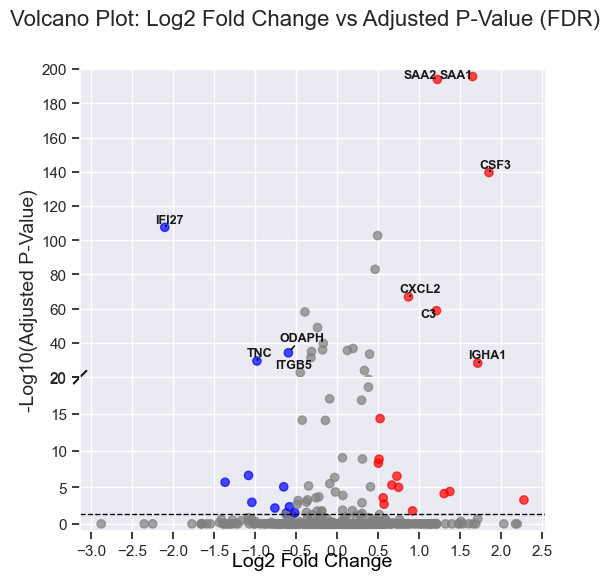

In [88]:
import numpy as np
import pandas as pd
from brokenaxes import brokenaxes
import matplotlib.pyplot as plt
from adjustText import adjust_text

# Configure matplotlib to embed Arial fonts in PDF
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# List of genes to annotate
genes_of_interest = ['SAA1', 'SAA2', "CXCL2",  "ITGB5",  "ODAPH", "IFI27", "C3",  "CSF3", "TNC", "IGHA1"]

# Define your data
log2fc_values = dge_results['Log2 Fold Change (Healthy vs Perio)']
pvalues = dge_results['Adjusted P-Value (FDR)']
gene_names = dge_results['Gene Name']

# Convert p-values to -log10 scale
log10_pvalues = -np.log10(np.maximum(pvalues, 1e-300))

# Optional: check some genes of interest
print(dge_results[dge_results['Gene Name'].isin(genes_of_interest)])

# Create the figure with broken y-axis
fig = plt.figure(figsize=(6, 6))
bax = brokenaxes(ylims=((-1, 20), (20, 200)), hspace=0.001, height_ratios=[2, 1])

# Set strict significance threshold
significance_threshold = 0.05
cutoff_y = -np.log10(significance_threshold)

# Define colors and annotate
colors = []
texts = []
for log2fc, pval, log10_pval, gene_name in zip(log2fc_values, pvalues, log10_pvalues, gene_names):
    # Apply strict significance cutoff
    if pval < significance_threshold:
        if log2fc > 0.5:
            color = 'red'
        elif log2fc < -0.5:
            color = 'blue'
        else:
            color = 'grey'  # significant pval but small fold change
    else:
        color = 'grey'  # non-significant

    colors.append(color)

    # Annotate selected genes
    if gene_name in genes_of_interest:
        for ax in bax.axs:
            ylim = ax.get_ylim()
            if ylim[0] < log10_pval < ylim[1]:
                texts.append(ax.text(log2fc, log10_pval, gene_name, fontsize=9, 
                                     alpha=0.9, color='black', weight='bold', ha='right'))
                break

# Plot scatter
bax.scatter(log2fc_values, log10_pvalues, c=colors, alpha=0.7)

# Add significance threshold line
for ax in bax.axs:
    ax.axhline(y=cutoff_y, color='black', linestyle='--', linewidth=1)
# Set X-axis ticks for all subplots in the broken axis
# You can define custom tick locations for each subplot if needed,
# or set them uniformly for all as shown here.
x_ticks = np.arange(-3, 3, 0.5)
for ax in bax.axs:
    ax.set_xticks(x_ticks)

# Set Y-axis ticks for the first subplot (bottom part of the broken y-axis)
bax.axs[1].set_yticks(np.arange(0, 21, 5))

# Set Y-axis ticks for the second subplot (top part of the broken y-axis)
bax.axs[0].set_yticks(np.arange(20, 201, 20))

# Adjust text
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'},
            arrowprops=dict(arrowstyle="->", color='black'))

# Labels and title
bax.set_xlabel('Log2 Fold Change', fontsize=14, color='black')
bax.set_ylabel('-Log10(Adjusted P-Value)', fontsize=14)
bax.fig.suptitle('Volcano Plot: Log2 Fold Change vs Adjusted P-Value (FDR)', fontsize=16)

# Show
plt.show()

In [89]:
# Define the cluster name you want to subset
cluster_name = "Fibroblast"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Fib = adata_included[adata_included.obs['Lvl1'] == cluster_name].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [90]:
import numpy as np
import pandas as pd
from scipy.stats import ranksums
from statsmodels.stats.multitest import multipletests


# Extract indices for Crevicular and Oral groups
healthy_indices = adata_Fib.obs['status.3'] == 'healthy'
perio_indices = adata_Fib.obs['status.3'] == 'perio'

# Extract expression data for Crevicular and Oral groups
healthy_expr = adata_Fib[healthy_indices, :].X.toarray()
perio_expr = adata_Fib[perio_indices, :].X.toarray()

# Initialize lists to store results
gene_names = []  # List for gene names
log2fc = []      # List for log2 fold changes
p_values = []     # List for p-values

# Assuming the gene names are stored in the column headers of crev_expr and oral_expr
# You can adjust this depending on how your gene names are stored in your data
gene_names = adata_Fib.var_names.tolist()

# Perform Wilcoxon Rank-Sum test for each gene
for gene in range(healthy_expr.shape[1]):  # Iterate over genes (columns)
    healthy_gene_expression = healthy_expr[:, gene]  # Expression data for gene in Crevicular Epi
    perio_gene_expression = perio_expr[:, gene]  # Expression data for gene in Oral Epi

    # Wilcoxon Rank-Sum Test (Mann-Whitney U Test)
    stat, p_val = ranksums(perio_gene_expression, healthy_gene_expression)

    # Log2 Fold Change (mean of Crevicular Epi / Oral Epi)
    mean_healthy = np.mean(healthy_gene_expression)
    mean_perio = np.mean(perio_gene_expression)
    log2_fold_change = np.log2(mean_perio / mean_healthy)  # Crevicular Epi vs Oral Epi fold change
    
    # Store results
    log2fc.append(log2_fold_change)
    p_values.append(p_val)

# Step 3: Adjust p-values for multiple testing using Benjamini-Hochberg correction
_, p_values_adj, _, _ = multipletests(p_values, method='fdr_bh')

# Step 4: Create a DataFrame with the results
dge_results = pd.DataFrame({
    'Gene Name': gene_names,
    'Log2 Fold Change (Healthy vs Perio)': log2fc,
    'P-Value': p_values,
    'Adjusted P-Value (FDR)': p_values_adj
})

# Step 5: Display the top significant genes (optional, based on FDR)
# You can filter based on your preferred significance threshold (e.g., FDR < 0.05)
significant_genes = dge_results[dge_results['Adjusted P-Value (FDR)'] < 0.01]

# Display results
print(dge_results.head())  # Show the first few results
print(f"Number of significant genes (FDR < 0.05): {len(significant_genes)}")

/tmp/ipykernel_1596771/1478256481.py:35: RuntimeWarning:

divide by zero encountered in float_scalars



  Gene Name  Log2 Fold Change (Healthy vs Perio)   P-Value  \
0    ABCC11                             0.613675  0.988900   
1      ACE2                             0.649953  0.870741   
2     ACKR1                            -0.040424  0.921155   
3     ACTA2                             0.158938  0.000425   
4     ACTG2                             0.128885  0.001687   

   Adjusted P-Value (FDR)  
0                0.999826  
1                0.999826  
2                0.999826  
3                0.001842  
4                0.006793  
Number of significant genes (FDR < 0.05): 113


In [91]:
# Set pandas display option to show all rows
pd.set_option('display.max_rows', None)  # Display all rows

# Display full results of significant genes
print(significant_genes)

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
3       ACTA2                             0.158938   4.246827e-04   
4       ACTG2                             0.128885   1.687072e-03   
5      ADAM28                             0.993528   3.166713e-12   
17    ALDH1A3                             0.788114   5.286849e-06   
22     APCDD1                            -0.060495   2.375166e-25   
27       AQP3                             0.294399   1.114098e-03   
35       ASPN                             0.090405   5.934467e-04   
37      BANK1                             1.399046   8.015461e-07   
38      BASP1                            -0.159837   4.419901e-07   
40    BCL2L11                             0.388181   2.206583e-08   
45        C1R                             0.025501   3.915068e-10   
49         C3                             0.652313  5.792515e-123   
56       CAV1                             0.197063   2.349314e-03   
61      CCL19                     

In [92]:
# Filter for rows with fold change > 2 or < -2
filtered_genes = significant_genes[(significant_genes['Log2 Fold Change (Healthy vs Perio)'] > 0.5) | 
                                  (significant_genes['Log2 Fold Change (Healthy vs Perio)'] < -0.5)]

print("\nFiltered Most Significant Genes:")
print(filtered_genes[['Gene Name', 'Log2 Fold Change (Healthy vs Perio)', 'Adjusted P-Value (FDR)']])


Filtered Most Significant Genes:
    Gene Name  Log2 Fold Change (Healthy vs Perio)  Adjusted P-Value (FDR)
5      ADAM28                             0.993528            2.341291e-11
17    ALDH1A3                             0.788114            2.740654e-05
37      BANK1                             1.399046            4.355389e-06
49         C3                             0.652313           2.009557e-121
61      CCL19                             0.580295            1.490797e-15
70       CD14                             0.755832            6.969753e-12
72       CD19                             2.472780            3.922151e-03
79       CD27                             2.945736            2.446945e-34
91      CD79A                             3.463221            0.000000e+00
100       CFB                             0.523785            8.484001e-87
117      COCH                             0.776222            2.900644e-03
129      CTSC                             0.750008            3.04

In [93]:
# Define the cluster name you want to subset
cluster_name = "Vascular"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Vasc = adata_included[adata_included.obs['Lvl1'] == cluster_name].copy()

In [94]:
import numpy as np
import pandas as pd
from scipy.stats import ranksums
from statsmodels.stats.multitest import multipletests


# Extract indices for Crevicular and Oral groups
healthy_indices = adata_Vasc.obs['status.3'] == 'healthy'
perio_indices = adata_Vasc.obs['status.3'] == 'perio'

# Extract expression data for Crevicular and Oral groups
healthy_expr = adata_Vasc[healthy_indices, :].X.toarray()
perio_expr = adata_Vasc[perio_indices, :].X.toarray()

# Initialize lists to store results
gene_names = []  # List for gene names
log2fc = []      # List for log2 fold changes
p_values = []     # List for p-values

# Assuming the gene names are stored in the column headers of crev_expr and oral_expr
# You can adjust this depending on how your gene names are stored in your data
gene_names = adata_Vasc.var_names.tolist()

# Perform Wilcoxon Rank-Sum test for each gene
for gene in range(healthy_expr.shape[1]):  # Iterate over genes (columns)
    healthy_gene_expression = healthy_expr[:, gene]  # Expression data for gene in Crevicular Epi
    perio_gene_expression = perio_expr[:, gene]  # Expression data for gene in Oral Epi

    # Wilcoxon Rank-Sum Test (Mann-Whitney U Test)
    stat, p_val = ranksums(perio_gene_expression, healthy_gene_expression)

    # Log2 Fold Change (mean of Crevicular Epi / Oral Epi)
    mean_healthy = np.mean(healthy_gene_expression)
    mean_perio = np.mean(perio_gene_expression)
    log2_fold_change = np.log2(mean_perio / mean_healthy)  # Crevicular Epi vs Oral Epi fold change
    
    # Store results
    log2fc.append(log2_fold_change)
    p_values.append(p_val)

# Step 3: Adjust p-values for multiple testing using Benjamini-Hochberg correction
_, p_values_adj, _, _ = multipletests(p_values, method='fdr_bh')

# Step 4: Create a DataFrame with the results
dge_results = pd.DataFrame({
    'Gene Name': gene_names,
    'Log2 Fold Change (Healthy vs Perio)': log2fc,
    'P-Value': p_values,
    'Adjusted P-Value (FDR)': p_values_adj
})

# Step 5: Display the top significant genes (optional, based on FDR)
# You can filter based on your preferred significance threshold (e.g., FDR < 0.05)
significant_genes = dge_results[dge_results['Adjusted P-Value (FDR)'] < 0.01]

# Display results
print(dge_results.head())  # Show the first few results
print(f"Number of significant genes (FDR < 0.05): {len(significant_genes)}")

/tmp/ipykernel_1596771/1172342013.py:35: RuntimeWarning:

divide by zero encountered in float_scalars



  Gene Name  Log2 Fold Change (Healthy vs Perio)       P-Value  \
0    ABCC11                             1.572452  9.828142e-01   
1      ACE2                            -0.777002  9.334585e-01   
2     ACKR1                             0.042793  3.488979e-01   
3     ACTA2                            -0.272207  2.527200e-09   
4     ACTG2                            -0.091568  6.866422e-04   

   Adjusted P-Value (FDR)  
0            9.994416e-01  
1            9.994416e-01  
2            9.422333e-01  
3            2.922480e-08  
4            4.301050e-03  
Number of significant genes (FDR < 0.05): 82


In [95]:
# Set pandas display option to show all rows
pd.set_option('display.max_rows', None)  # Display all rows

# Display full results of significant genes
print(significant_genes)

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
3       ACTA2                            -0.272207   2.527200e-09   
4       ACTG2                            -0.091568   6.866422e-04   
6     ADAMTS1                             0.129073   9.465223e-04   
8      ADGRL4                             0.103135   2.601888e-07   
19     ANGPT2                            -0.508339   3.063404e-05   
40    BCL2L11                             0.260455   1.011852e-03   
42        BMX                            -0.319940   7.359490e-05   
56       CAV1                            -0.180599   4.454934e-15   
57     CAVIN1                            -0.022327   1.091704e-13   
58     CAVIN2                            -0.428192   2.931655e-28   
65       CCN1                             0.192402   2.895481e-08   
79       CD27                             2.249379   2.541937e-07   
91      CD79A                             3.055174   2.371257e-77   
118   COL16A1                     

In [96]:
# Filter for rows with fold change > 2 or < -2
filtered_genes = significant_genes[(significant_genes['Log2 Fold Change (Healthy vs Perio)'] > 0.5) | 
                                  (significant_genes['Log2 Fold Change (Healthy vs Perio)'] < -0.5)]

print("\nFiltered Most Significant Genes:")
print(filtered_genes[['Gene Name', 'Log2 Fold Change (Healthy vs Perio)', 'Adjusted P-Value (FDR)']])


Filtered Most Significant Genes:
    Gene Name  Log2 Fold Change (Healthy vs Perio)  Adjusted P-Value (FDR)
19     ANGPT2                            -0.508339            2.423852e-04
79       CD27                             2.249379            2.388362e-06
91      CD79A                             3.055174            9.722155e-76
118   COL16A1                            -0.694403            4.301050e-03
126      CSF3                             2.091992            4.787727e-07
135    CXCL14                            -0.928035            2.300932e-03
141     CXCR4                             0.651357            1.882716e-06
148     CYTIP                             1.676055            2.416433e-13
183    FKBP11                             0.602189            1.111697e-18
220  HLA-DQB2                            -0.893739            1.758733e-05
221  HLA-DRB5                            -0.992578           4.486895e-160
229     IGHA1                             1.928888            0.00

In [2]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,Lvl4_kmeans_Mel,Mel_leiden,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged
cell_id,,,,,,,,,,,,,,,,,,,,,
aaaafkfa-1,aaaafkfa-1,897.109375,1332.185791,21,0,0,0,0,21,44.027345,...,NaN,NaN,2,10,2,3,4,4,Fib CT 2,Fibrous CT
aaabfapb-1,aaabfapb-1,887.724976,1353.138916,4,0,0,0,0,4,20.184844,...,NaN,NaN,2,10,2,3,4,4,Fib CT 2,Fibrous CT
aaagfdhe-1,aaagfdhe-1,896.825684,1353.078003,7,0,0,0,0,7,9.708594,...,NaN,NaN,2,10,2,3,4,4,Fib CT 2,Fibrous CT
aaahdjch-1,aaahdjch-1,884.860718,1348.416504,5,0,0,0,0,5,41.769533,...,NaN,NaN,2,10,2,3,4,4,Fib CT 2,Fibrous CT
aaaikifh-1,aaaikifh-1,894.474365,1345.850586,7,0,0,0,0,7,17.927032,...,NaN,NaN,2,10,2,3,4,4,Fib CT 2,Fibrous CT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,NaN,NaN,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT
oindfjhe-1,oindfjhe-1,1548.593140,1276.395020,27,0,0,0,0,27,16.165938,...,NaN,NaN,1,9,1,8,8,1,Plasma-Fib CT,Plasma-Fib CT
oinegfdb-1,oinegfdb-1,1545.742432,1284.771851,11,0,0,0,0,11,6.050938,...,NaN,NaN,1,9,1,8,8,4,Plasma-Fib CT,Plasma-Fib CT


In [2]:
adata.obs.columns.unique().tolist()

['cell_id',
 'x_centroid',
 'y_centroid',
 'transcript_counts',
 'control_probe_counts',
 'control_codeword_counts',
 'unassigned_codeword_counts',
 'deprecated_codeword_counts',
 'total_counts',
 'cell_area',
 'nucleus_area_x',
 'orig.ident',
 'nucleus_area_y',
 'pt.id',
 'oct.id',
 'status',
 'status.2',
 'status.3',
 'age',
 'sex',
 'race',
 'region',
 'orig_reg',
 'total_area_mm2',
 'Lvl1',
 'Lvl2',
 'Lvl3',
 'epiHL',
 'fibHL',
 'endoHL',
 'immuneHL',
 'Lvl4',
 'Lvl1_IE',
 'Lvl2_IE',
 'lymphoidHL',
 'myeloidHL',
 'sample',
 '_scvi_batch',
 '_scvi_labels',
 'cc8',
 'cc14',
 'cc17',
 'Lvl2.5',
 'niche_cc14',
 'Lvl4_old',
 'T_leiden',
 'T_leiden2',
 'T_leiden3',
 'Lvl4_thesis',
 'F_leiden',
 'V_leiden',
 'V_leiden2',
 'Lvl5',
 'B_leiden',
 'Lvl4_kmeans_Mel',
 'Mel_leiden',
 'KNN100_K10',
 'KNN100_K12',
 'spatial_expression_cluster',
 'KNN50_K10',
 'KNN30_K10',
 'KNN10_K10',
 'niche_knn50k10',
 'niche_knn50k10_merged']

In [ ]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_TAEniche)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_TAEniche, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_TAEniche.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TAEniche.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_TAEniche, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_TAEniche.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_TAEniche[adata_TAEniche.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_TAEniche,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Get the gene expression matrix as a dense numpy array
gene_expression = adata_TAEniche.X.toarray()  # Get expression matrix as a numpy array

# Step 1: Calculate the number of non-zero expressions for each gene
non_zero_expression = np.count_nonzero(gene_expression > 0, axis=0)  # Number of non-zero expressions for each gene

# Step 2: Calculate the threshold for 10% of cells
total_cells = gene_expression.shape[0]
threshold_10_percent_cells = total_cells * 0.1  # 10% of the total cells

# Step 3: Filter genes that are expressed in at least 10% of cells
genes_above_10_percent = non_zero_expression >= threshold_10_percent_cells

# Step 4: Create the filtered AnnData object
adata_filtered = adata_TAEniche[:, genes_above_10_percent].copy()


In [54]:
adata_filtered.var

""
ACTG2
ADAM28
ADAMTS1
ANXA1
APCDD1
AQP3
BASP1
BCL2L11
C1R
C3


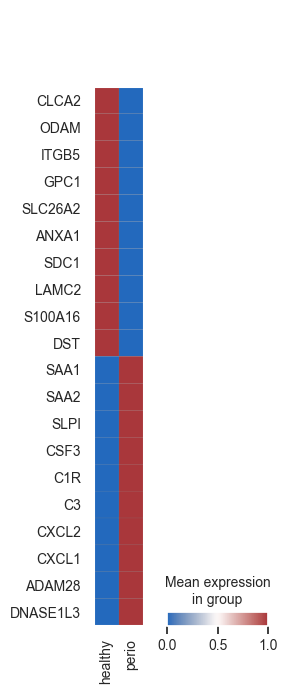

In [55]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_filtered, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_filtered.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_filtered.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_filtered, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_filtered.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_filtered[adata_filtered.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_filtered,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [ ]:
# Assuming dge_results is the dataframe containing statistics results (with 'pvalue' column)
pval_0 = dge_results[dge_results['Adjusted P-Value (FDR)'] == 0]

In [ ]:
# Creating a jittered list of very small p-values around 1e-300
pval_jitter = np.round(np.random.normal(loc=295, scale=5, size=pval_0.shape[0]), 0)
pval_jitter = 1 * 10 ** -pval_jitter

In [ ]:
dge_results.loc[dge_results['Adjusted P-Value (FDR)'] == 0, 'Adjusted P-Value (FDR)'] = pval_jitter

    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
137     CXCL2                            -0.775397   8.380596e-45   
252     ITGB5                             0.533251   1.632046e-71   
370      SAA1                            -1.988107  6.548147e-158   
371      SAA2                            -1.486746  4.539801e-144   

     Adjusted P-Value (FDR)  
137            2.519766e-43  
252            1.051504e-69  
370           2.953214e-155  
371           1.023725e-141  


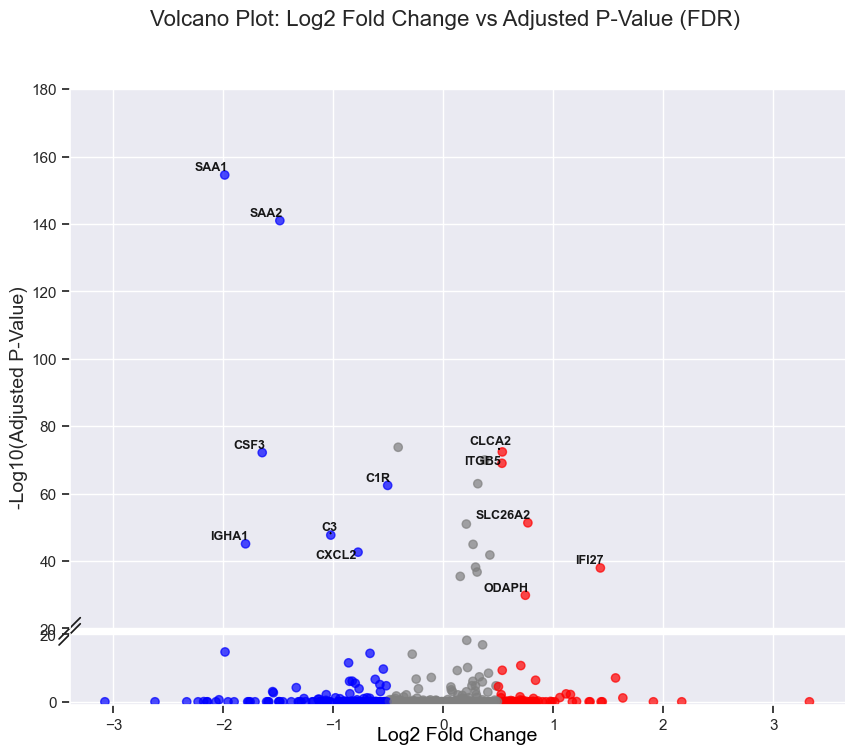

In [34]:
import numpy as np
import pandas as pd
from brokenaxes import brokenaxes
import matplotlib.pyplot as plt
from adjustText import adjust_text

# List of genes you want to annotate
genes_of_interest = ['SAA1', 'SAA2', "CXCL2",  "ITGB5",  "ODAPH", "IFI27", "C3", 'C1R', "CSF3", "CLCA2", "IGHA1", "SLC26A2"]

# Define your data (replace these with your actual data)
log2fc_values = dge_results['Log2 Fold Change (Healthy vs Perio)']
pvalues = dge_results['Adjusted P-Value (FDR)']
gene_names = dge_results['Gene Name']

# Transform p-values to -log10 scale and handle 0-values
log10_pvalues = -np.log10(np.maximum(pvalues, 1e-300))

# Check if 'SAA1' and 'SAA2' are present and their values
print(dge_results[dge_results['Gene Name'].isin(['SAA1', 'SAA2', "CXCL2", "ITGB5"])])

# Create a figure with broken y-axis, starting at ymin=50
fig = plt.figure(figsize=(10, 8))
bax = brokenaxes(ylims=((-1, 20), (20, 180)), hspace=0.02)

from matplotlib.ticker import MultipleLocator
for ax in bax.axs:
    ax.xaxis.set_major_locator(MultipleLocator(0.5))   # x-axis ticks every 0.5
    
# Define colors and annotations
colors = []
texts = []
for i, (log2fc, log10_pval, gene_name) in enumerate(zip(log2fc_values, log10_pvalues, gene_names)):
    # Determine color
    if log2fc < -0.5:
        colors.append('blue')
    elif log2fc > 0.5:
        colors.append('red')
    else:
        colors.append('grey')

    # Add text annotations only for genes of interest
    if gene_name in genes_of_interest:
        # Determine which axes segment the point belongs to
        for ax in bax.axs:
            xlim, ylim = ax.get_xlim(), ax.get_ylim()
            if ylim[0] < log10_pval < ylim[1]:
                # Add annotation to the correct sub-plot
                texts.append(ax.text(log2fc, log10_pval, gene_name, fontsize=9, 
                                     alpha=0.9, color='black', weight='bold', ha='right'))
                break

# Scatter plot
bax.scatter(log2fc_values, log10_pvalues, c=colors, alpha=0.7)

# Adjust text to avoid overlaps
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'}, 
            arrowprops=dict(arrowstyle="->", color='black'))

# Labels and Title
bax.set_xlabel('Log2 Fold Change', fontsize=14, color='black')
bax.set_ylabel('-Log10(Adjusted P-Value)', fontsize=14)
bax.fig.suptitle('Volcano Plot: Log2 Fold Change vs Adjusted P-Value (FDR)', fontsize=16)

# Show the plot
plt.show()


    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
137     CXCL2                            -0.775397   8.380596e-45   
252     ITGB5                             0.533251   1.632046e-71   
370      SAA1                            -1.988107  6.548147e-158   
371      SAA2                            -1.486746  4.539801e-144   

     Adjusted P-Value (FDR)  
137            2.519766e-43  
252            1.051504e-69  
370           2.953214e-155  
371           1.023725e-141  


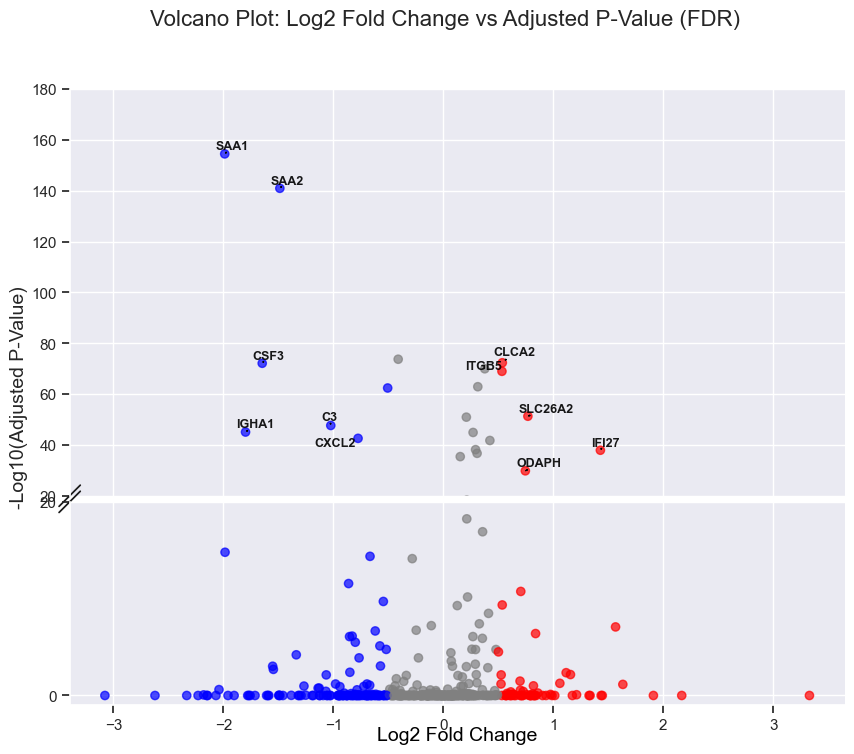

In [35]:
import numpy as np
import pandas as pd
from brokenaxes import brokenaxes
import matplotlib.pyplot as plt
from adjustText import adjust_text

# List of genes you want to annotate
genes_of_interest = ['SAA1', 'SAA2', "CXCL2",  "ITGB5",  "ODAPH", "IFI27", "C3", "CSF3", "CLCA2", "IGHA1", "SLC26A2"]

# Define your data (replace these with your actual data)
log2fc_values = dge_results['Log2 Fold Change (Healthy vs Perio)']
pvalues = dge_results['Adjusted P-Value (FDR)']
gene_names = dge_results['Gene Name']

# Transform p-values to -log10 scale and handle 0-values
log10_pvalues = -np.log10(np.maximum(pvalues, 1e-300))

# Check if 'SAA1' and 'SAA2' are present and their values
print(dge_results[dge_results['Gene Name'].isin(['SAA1', 'SAA2', "CXCL2", "ITGB5"])])

# Create a figure with broken y-axis, starting at ymin=50
fig = plt.figure(figsize=(10, 8))
bax = brokenaxes(ylims=((-1, 20), (20, 180)), hspace=0.02, height_ratios=[2,1])
from matplotlib.ticker import MultipleLocator
for ax in bax.axs:
    ax.xaxis.set_major_locator(MultipleLocator(0.5))   # x-axis ticks every 0.5
# Define colors and annotations
colors = []
texts = []
for i, (log2fc, log10_pval, gene_name) in enumerate(zip(log2fc_values, log10_pvalues, gene_names)):
    # Determine color
    if log2fc < -0.5:
        colors.append('blue')
    elif log2fc > 0.5:
        colors.append('red')
    else:
        colors.append('grey')

    # Add text annotations only for genes of interest
    if gene_name in genes_of_interest:
        # Determine which axes segment the point belongs to
        for ax in bax.axs:
            xlim, ylim = ax.get_xlim(), ax.get_ylim()
            if ylim[0] < log10_pval < ylim[1]:
                # Add annotation to the correct sub-plot
                texts.append(ax.text(log2fc, log10_pval, gene_name, fontsize=9, 
                                     alpha=0.9, color='black', weight='bold', ha='right'))
                break

# Scatter plot
bax.scatter(log2fc_values, log10_pvalues, c=colors, alpha=0.7)

# Adjust text to avoid overlaps
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'}, 
            arrowprops=dict(arrowstyle="->", color='black'))

# Labels and Title
bax.set_xlabel('Log2 Fold Change', fontsize=14, color='black')
bax.set_ylabel('-Log10(Adjusted P-Value)', fontsize=14)
bax.fig.suptitle('Volcano Plot: Log2 Fold Change vs Adjusted P-Value (FDR)', fontsize=16)

# Show the plot
plt.show()


    Gene Name  Log2 Fold Change (Healthy vs Perio)        P-Value  \
45        C1R                            -0.506075   7.754125e-65   
49         C3                            -1.023528   5.796715e-50   
107     CLCA2                             0.536571   4.008165e-75   
126      CSF3                            -1.647095   8.045637e-75   
137     CXCL2                            -0.775397   8.380596e-45   
226     IFI27                             1.428471   4.853445e-40   
229     IGHA1                            -1.798789   2.448552e-47   
252     ITGB5                             0.533251   1.632046e-71   
319     ODAPH                             0.746019   7.248547e-32   
370      SAA1                            -1.988107  6.548147e-158   
371      SAA2                            -1.486746  4.539801e-144   
390   SLC26A2                             0.769099   1.108406e-53   

     Adjusted P-Value (FDR)  
45             3.885678e-63  
49             2.178599e-48  
107         

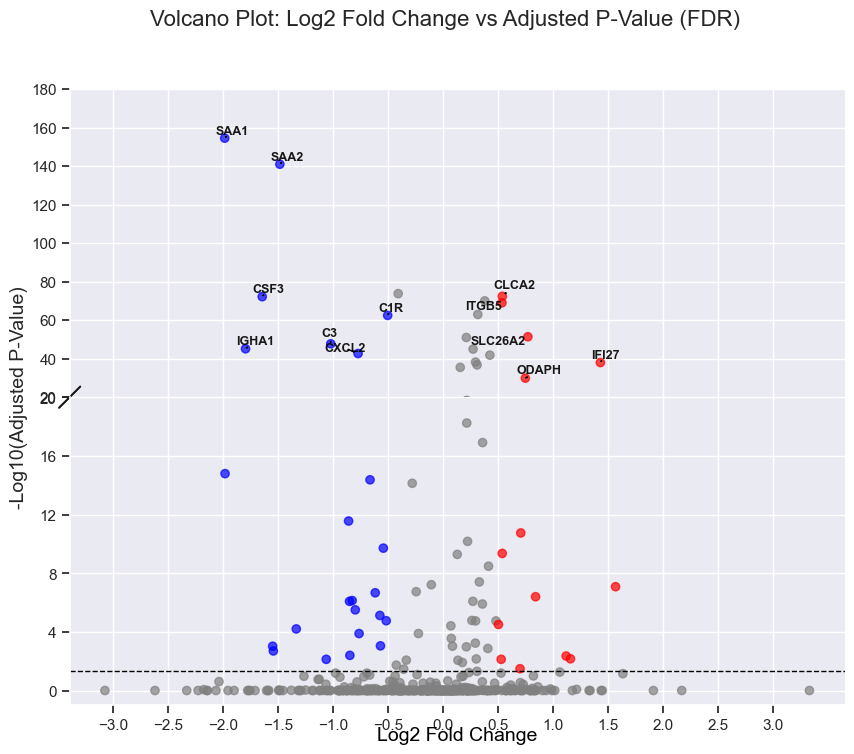

In [49]:
import numpy as np
import pandas as pd
from brokenaxes import brokenaxes
import matplotlib.pyplot as plt
from adjustText import adjust_text

# List of genes to annotate
genes_of_interest = ['SAA1', 'SAA2', "CXCL2",  "ITGB5",  "ODAPH", "IFI27", "C3", "C1R", "CSF3", "CLCA2", "IGHA1", "SLC26A2"]

# Define your data
log2fc_values = dge_results['Log2 Fold Change (Healthy vs Perio)']
pvalues = dge_results['Adjusted P-Value (FDR)']
gene_names = dge_results['Gene Name']

# Convert p-values to -log10 scale
log10_pvalues = -np.log10(np.maximum(pvalues, 1e-300))

# Optional: check some genes of interest
print(dge_results[dge_results['Gene Name'].isin(genes_of_interest)])

# Create the figure with broken y-axis
fig = plt.figure(figsize=(10, 8))
bax = brokenaxes(ylims=((-1, 20), (20, 180)), hspace=0.001, height_ratios=[1, 1])

# Set strict significance threshold
significance_threshold = 0.05
cutoff_y = -np.log10(significance_threshold)

# Define colors and annotate
colors = []
texts = []
for log2fc, pval, log10_pval, gene_name in zip(log2fc_values, pvalues, log10_pvalues, gene_names):
    # Apply strict significance cutoff
    if pval < significance_threshold:
        if log2fc > 0.5:
            color = 'red'
        elif log2fc < -0.5:
            color = 'blue'
        else:
            color = 'grey'  # significant pval but small fold change
    else:
        color = 'grey'  # non-significant

    colors.append(color)

    # Annotate selected genes
    if gene_name in genes_of_interest:
        for ax in bax.axs:
            ylim = ax.get_ylim()
            if ylim[0] < log10_pval < ylim[1]:
                texts.append(ax.text(log2fc, log10_pval, gene_name, fontsize=9, 
                                     alpha=0.9, color='black', weight='bold', ha='right'))
                break

# Plot scatter
bax.scatter(log2fc_values, log10_pvalues, c=colors, alpha=0.7)

# Add significance threshold line
for ax in bax.axs:
    ax.axhline(y=cutoff_y, color='black', linestyle='--', linewidth=1)

x_ticks = np.arange(-3, 3.5, 0.5)
for ax in bax.axs:
    ax.set_xticks(x_ticks)

# Set Y-axis ticks for the first subplot (bottom part of the broken y-axis)
bax.axs[1].set_yticks(np.arange(0, 21, 4))

# Set Y-axis ticks for the second subplot (top part of the broken y-axis)
bax.axs[0].set_yticks(np.arange(20, 181, 20))

# Adjust text
adjust_text(texts, only_move={'points': 'xy', 'text': 'xy'},
            arrowprops=dict(arrowstyle="->", color='black'))

# Labels and title
bax.set_xlabel('Log2 Fold Change', fontsize=14, color='black')
bax.set_ylabel('-Log10(Adjusted P-Value)', fontsize=14)
bax.fig.suptitle('Volcano Plot: Log2 Fold Change vs Adjusted P-Value (FDR)', fontsize=16)

# Show
plt.show()


In [124]:
genes_for_plot

['ODAM',
 'CLCA2',
 'ITGB5',
 'GPC1',
 'SLC26A2',
 'ANXA1',
 'LAMC2',
 'SDC1',
 'DST',
 'S100A16',
 'SAA1',
 'SAA2',
 'SLPI',
 'CSF3',
 'C1R',
 'C3',
 'CXCL2',
 'CXCL1',
 'DNASE1L3',
 'ADAM28']

In [6]:
adata.obs['niche_knn50k10'].unique().tolist()

['Fib CT 2',
 'Epi-CT 2',
 'Plasma-Fib CT',
 'Plasma',
 'Fib CT 1',
 'Spinous',
 'Epi-CT 1',
 'Keratin',
 'Crevicular',
 'Lymphoid']

In [131]:
# Define the cluster name you want to subset
cluster_name = "Lymphoid"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_TBAPC = adata_included[adata_included.obs['niche_knn50k10'] == cluster_name].copy()

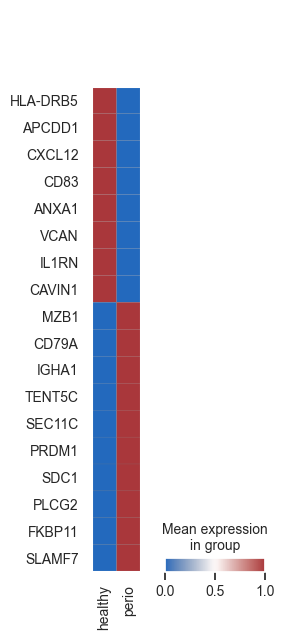

In [132]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_TBAPC)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_TBAPC, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_TBAPC.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TBAPC.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_TBAPC, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_TBAPC.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_TBAPC[adata_TBAPC.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_TBAPC,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [9]:
# Define the cluster name you want to subset
cluster_name = "B"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_B = adata_included[adata_included.obs['Lvl3'] == cluster_name].copy()

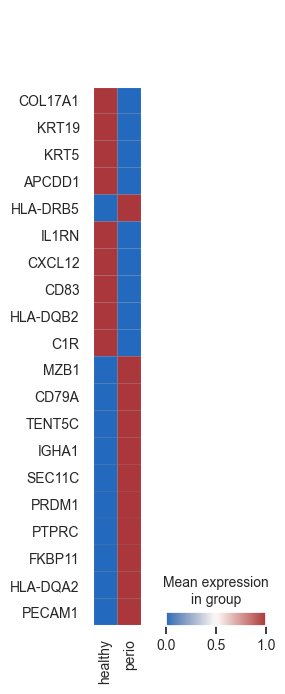

In [23]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_B)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_B, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_B.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_B.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_B, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_B.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_B[adata_B.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_B,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [24]:
genes_for_plot

['COL17A1',
 'KRT19',
 'KRT5',
 'APCDD1',
 'HLA-DRB5',
 'IL1RN',
 'CXCL12',
 'CD83',
 'HLA-DQB2',
 'C1R',
 'MZB1',
 'CD79A',
 'TENT5C',
 'IGHA1',
 'SEC11C',
 'PRDM1',
 'PTPRC',
 'FKBP11',
 'HLA-DQA2',
 'PECAM1']

In [16]:
# Define the cluster name you want to subset
cluster_name = "Crev"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_TAE = adata_included[adata_included.obs['Lvl3'] == cluster_name].copy()

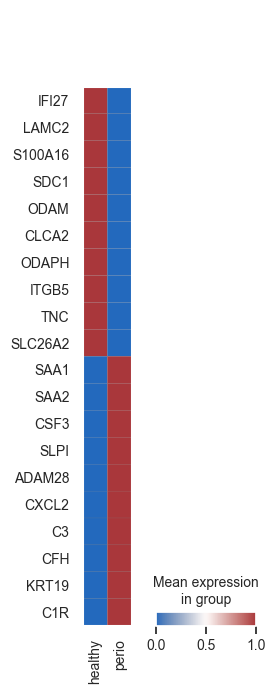

In [158]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_TAE)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_TAE, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_TAE.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TAE.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_TAE, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_TAE.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_TAE[adata_TAE.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_TAE,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

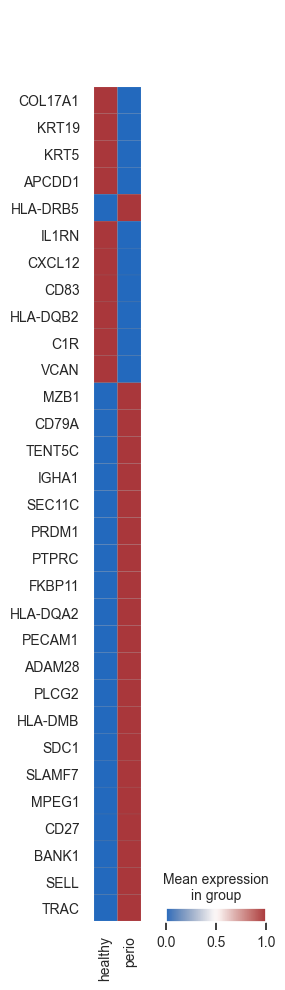

In [31]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_B)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_B, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_B.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_B.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_B, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_B.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_B[adata_B.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_B,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [25]:
genes_for_plot

['COL17A1',
 'KRT19',
 'KRT5',
 'APCDD1',
 'HLA-DRB5',
 'IL1RN',
 'CXCL12',
 'CD83',
 'HLA-DQB2',
 'C1R',
 'MZB1',
 'CD79A',
 'TENT5C',
 'IGHA1',
 'SEC11C',
 'PRDM1',
 'PTPRC',
 'FKBP11',
 'HLA-DQA2',
 'PECAM1']

In [34]:
genes = adata.var_names.tolist()

In [35]:
genes

['ABCC11',
 'ACE2',
 'ACKR1',
 'ACTA2',
 'ACTG2',
 'ADAM28',
 'ADAMTS1',
 'ADGRE1',
 'ADGRL4',
 'ADH1C',
 'ADH4',
 'ADIPOQ',
 'AGER',
 'AGR3',
 'AHSP',
 'AIF1',
 'ALAS2',
 'ALDH1A3',
 'AMY2A',
 'ANGPT2',
 'ANPEP',
 'ANXA1',
 'APCDD1',
 'APOA5',
 'APOBEC3A',
 'APOLD1',
 'AQP2',
 'AQP3',
 'AQP8',
 'AQP9',
 'AR',
 'ARFGEF3',
 'ARG1',
 'ASCL1',
 'ASCL3',
 'ASPN',
 'BAMBI',
 'BANK1',
 'BASP1',
 'BBOX1',
 'BCL2L11',
 'BMP4',
 'BMX',
 'BTNL9',
 'C15orf48',
 'C1R',
 'C1orf162',
 'C1orf194',
 'C20orf85',
 'C3',
 'C5orf46',
 'C6orf118',
 'C7',
 'CA4',
 'CAMP',
 'CAPN8',
 'CAV1',
 'CAVIN1',
 'CAVIN2',
 'CCDC39',
 'CCDC78',
 'CCL19',
 'CCL27',
 'CCL3L1',
 'CCL5',
 'CCN1',
 'CCNB2',
 'CCR2',
 'CCR6',
 'CCR7',
 'CD14',
 'CD163',
 'CD19',
 'CD1A',
 'CD1C',
 'CD1E',
 'CD2',
 'CD207',
 'CD247',
 'CD27',
 'CD274',
 'CD28',
 'CD300E',
 'CD34',
 'CD3D',
 'CD3E',
 'CD4',
 'CD5L',
 'CD68',
 'CD69',
 'CD70',
 'CD79A',
 'CD83',
 'CD86',
 'CD8A',
 'CD93',
 'CDH16',
 'CDK1',
 'CENPF',
 'CFAP53',
 'CFB',
 'CFH',

In [6]:
import pandas as pd

import pandas as pd

# Load your GO annotation file
df = pd.read_csv("/data/vasileiosionat2/Xenium/Xenium_gene_ontologies_ensemble_biomart.txt", sep="\t")

# Define the GO term accessions you want to keep
go_ids_of_interest = {
    # Antigen presentation
    'GO:0019882', 'GO:0048002', 'GO:0002504', 'GO:0002474',
    # B cell activation
    'GO:0042113', 'GO:0002322', 'GO:0050864',
    # Chemotaxis / adhesion
    'GO:0006935', 'GO:0007155', 'GO:0002685', 'GO:0030155',
    # IFN signaling
    'GO:0060337', 'GO:0034340', 'GO:0045071', 'GO:0051607',
    # Proliferation
    'GO:0008283', 'GO:0042127', 'GO:0051726', 'GO:0000086',
    # Class-switching / Ig production
    'GO:0045190', 'GO:0016064', 'GO:0002377', 'GO:0002313'
}

# Filter rows based on GO accession column
filtered_df = df[df['GO term accession'].isin(go_ids_of_interest)]

# Get unique genes associated with these terms
functional_genes = filtered_df['Gene name'].unique().tolist()

print(f"✅ Found {len(functional_genes)} unique functional genes.")
print(functional_genes[:50])  # Preview first 10

# Optional: Save the filtered table or just the gene list
#filtered_df.to_csv("filtered_functional_GO_terms.txt", sep="\t", index=False)

# Save gene list only (one gene per line, for Enrichr etc.)
#with open("functional_gene_list.txt", "w") as f:
#    for gene in functional_genes:
#        f.write(f"{gene}\n")


✅ Found 114 unique functional genes.
['ECSCR', 'POSTN', 'LIF', 'GPR183', 'SRPX', 'BMP4', 'ITGA1', 'VCAN', 'BANK1', 'PRDM1', 'ITGB2', 'CXCL6', 'SLPI', 'MYBPC1', 'CD19', 'LY6D', 'PROK2', 'FCER1A', 'BMX', 'EGFL7', 'LGR5', 'CD2', 'PDGFRB', 'ASCL1', 'IFIT1', 'IFI27', 'ICAM1', 'MZB1', 'TBX3', 'LAMC2', 'CCL27', 'CCL19', 'IRF7', 'SELE', 'SELL', 'GHRL', 'CTSG', 'HLA-DMB', 'MMRN2', 'CCL5', 'PRF1', 'CXCL17', 'CAV1', 'HLA-DQA2', 'PECAM1', 'APOBEC3A', 'CD4', 'CD34', 'LYVE1', 'PTPRC']


In [7]:
print(functional_genes)

['ECSCR', 'POSTN', 'LIF', 'GPR183', 'SRPX', 'BMP4', 'ITGA1', 'VCAN', 'BANK1', 'PRDM1', 'ITGB2', 'CXCL6', 'SLPI', 'MYBPC1', 'CD19', 'LY6D', 'PROK2', 'FCER1A', 'BMX', 'EGFL7', 'LGR5', 'CD2', 'PDGFRB', 'ASCL1', 'IFIT1', 'IFI27', 'ICAM1', 'MZB1', 'TBX3', 'LAMC2', 'CCL27', 'CCL19', 'IRF7', 'SELE', 'SELL', 'GHRL', 'CTSG', 'HLA-DMB', 'MMRN2', 'CCL5', 'PRF1', 'CXCL17', 'CAV1', 'HLA-DQA2', 'PECAM1', 'APOBEC3A', 'CD4', 'CD34', 'LYVE1', 'PTPRC', 'VWF', 'THBS2', 'CXCL2', 'CXCL9', 'CXCL10', 'ACE2', 'CCN1', 'KIT', 'CD93', 'CDK1', 'CXCL1', 'CXCL5', 'CDH16', 'AGER', 'TLR4', 'MMRN1', 'CD27', 'CCR6', 'TNC', 'NLRC5', 'FOXA1', 'CCR2', 'CXCL14', 'IL23A', 'MKI67', 'GKN2', 'ITGB5', 'EGFR', 'C3', 'CXCL12', 'IL33', 'DMBT1', 'ANXA1', 'CD79A', 'FPR1', 'PDPN', 'MDM2', 'PDGFRA', 'THY1', 'MS4A1', 'CD86', 'HLA-DRB5', 'IGF1', 'ITGB4', 'PLCG2', 'COL16A1', 'TLR2', 'SFRP2', 'STAT3', 'CXCR4', 'ERBB2', 'CLCA2', 'CD8A', 'CD207', 'LYST', 'CCR7', 'TNFRSF9', 'CYTIP', 'COL8A1', 'CSF3R', 'DPT', 'PROX1', 'SLAMF1', 'SLAMF7']


In [16]:
# Subset the AnnData object to only those genes
genes_to_keep = [gene for gene in functional_genes if gene in adata_B.var_names]
adata_B_functional = adata_B[:, genes_to_keep].copy()

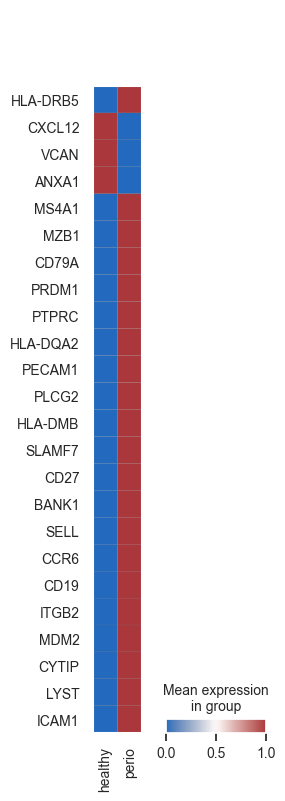

In [42]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_B_functional)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_B_functional, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_B.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_B_functional.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_B_functional, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_B_functional.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_B_functional[adata_B_functional.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_B_functional,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [43]:
genes_for_plot

['HLA-DRB5',
 'CXCL12',
 'VCAN',
 'ANXA1',
 'MS4A1',
 'MZB1',
 'CD79A',
 'PRDM1',
 'PTPRC',
 'HLA-DQA2',
 'PECAM1',
 'PLCG2',
 'HLA-DMB',
 'SLAMF7',
 'CD27',
 'BANK1',
 'SELL',
 'CCR6',
 'CD19',
 'ITGB2',
 'MDM2',
 'CYTIP',
 'LYST',
 'ICAM1']

In [19]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata, 'Lvl2.5', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata.obs['Lvl2.5'].cat.categories:
    top_genes_per_cluster[cluster] = adata.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

In [20]:
print(top_genes_per_cluster)

{'B': array(['MS4A1', 'BANK1', 'HLA-DMB', 'CD19', 'PTPRC', 'CD79A', 'CXCR4',
       'PLCG2', 'IRF8', 'HLA-DRB5', 'MPEG1', 'ADAM28', 'SELL', 'HLA-DQA2',
       'CD83', 'NLRC5', 'ITGB2', 'TNFRSF13B', 'CYTIP', 'TRAC'],
      dtype=object), 'Basal': array(['COL17A1', 'KRT5', 'DST', 'ITGB4', 'GPC1', 'EHF', 'S100A16',
       'CXCL14', 'CLCA2', 'KRT19', 'MYC', 'AQP3', 'EGFR', 'CLEC7A',
       'FGFBP1', 'PCNA', 'FBLN1', 'CAVIN1', 'BASP1', 'SDC1'], dtype=object), 'Crev': array(['KRT5', 'CFH', 'ODAM', 'ITGB4', 'KRT19', 'IL1RN', 'GPC1', 'ADAM28',
       'LAMC2', 'CXCL1', 'SAA2', 'ANXA1', 'SLPI', 'EHF', 'SAA1',
       'COL17A1', 'CLEC7A', 'CXCL2', 'DST', 'CSF3'], dtype=object), 'Fib': array(['C1R', 'CXCL12', 'PDGFRB', 'COL5A2', 'PRRX1', 'VCAN', 'PCOLCE',
       'COL16A1', 'CTSK', 'FBN1', 'CRISPLD2', 'PDGFRA', 'THY1', 'THBS2',
       'APCDD1', 'FBLN1', 'POSTN', 'ASPN', 'PTGDS', 'ITGB5'], dtype=object), 'Keratin': array(['IL1RN', 'C15orf48', 'IL36A', 'SLPI', 'EHF', 'GPRC5A', 'CNFN',
       'KRT19', 

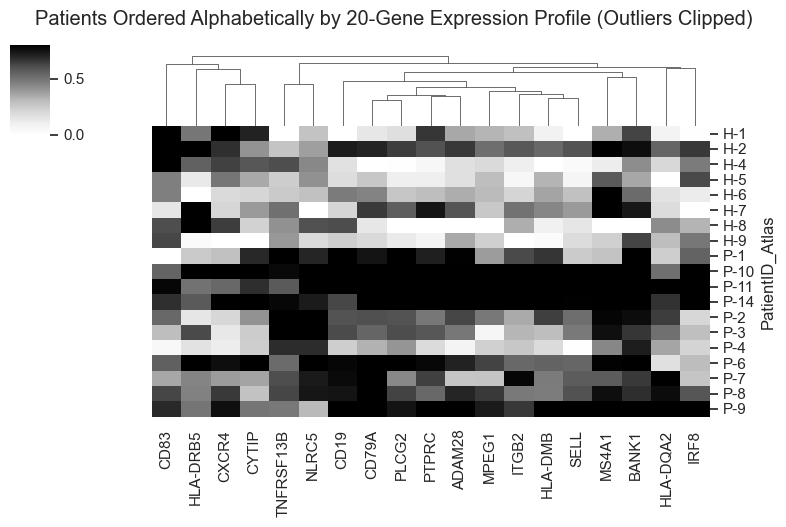

In [44]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Define your genes of interest
genes_of_interest = [
    # B Cell Markers and Differentiation
    'MS4A1', 'CD19', 'CD79A', 'BANK1', 'TNFRSF13B', 'CD83',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    # Immune Cell Signaling & Regulation
    'PLCG2', 'CXCR4', 'IRF8', 'CYTIP', 'NLRC5', 'SELL', 'ITGB2',

    # Phagocytosis & Innate Immunity
    'MPEG1', 'PTPRC',

    # Proteolysis / Adhesion / Other
    'ADAM28'
]

# Step 2: Subset expression matrix for these genes
X = adata_B[:, genes_of_interest].X
if not isinstance(X, np.ndarray):
    X = X.toarray()

# Step 3: Combine expression with patient ID
expr_df = pd.DataFrame(X, columns=genes_of_interest, index=adata_B.obs_names)
expr_df['PatientID_Atlas'] = adata_B.obs['PatientID_Atlas'].values  # assuming pt.id is in adata.obs

# Step 4: Compute mean expression per patient
mean_expr_per_patient = expr_df.groupby('PatientID_Atlas')[genes_of_interest].mean()


sns.clustermap(mean_expr_per_patient, cmap="Greys", standard_scale=1, vmax=0.8,
               figsize=(8, 5), xticklabels=True, yticklabels=True,
               row_cluster=False)

plt.suptitle("Patients Ordered Alphabetically by 20-Gene Expression Profile (Outliers Clipped)", y=1.05)
plt.show() 

In [53]:
adata_B.obs['PatientID_Atlas'].unique().tolist() 

['P-7',
 'H-8',
 'P-8',
 'P-3',
 'H-4',
 'H-5',
 'H-6',
 'P-1',
 nan,
 'P-6',
 'P-2',
 'P-4',
 'H-1',
 'H-9',
 'H-7']

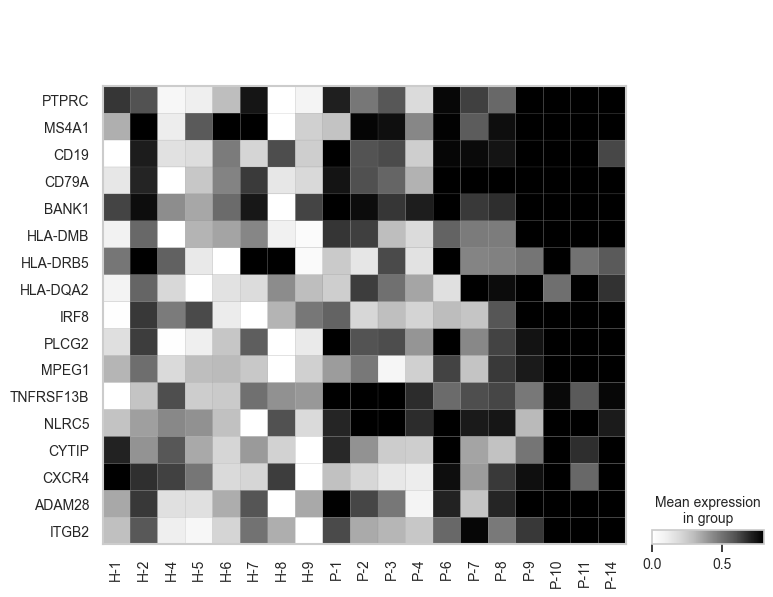

In [39]:
# Step 2: Manually set niche order
niche_order = [  'H-1', 'H-2', 'H-4', 'H-5', 'H-6',  'H-7', 'H-8',  'H-9',
               'P-1',   'P-2', 'P-3',  'P-4',  'P-6', 'P-7',  'P-8',  'P-9', 'P-10',  'P-11',  'P-14'
    ] 
adata_B.obs['PatientID_Atlas'] = adata_B.obs['PatientID_Atlas'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
 'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    #Development /Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    #Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    #Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',

]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_B,
    vmax=0.8,
    var_names=genes_to_plot,
    groupby='PatientID_Atlas',
    use_raw=False,
    cmap="Greys",
    standard_scale='var',
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig.pdf', bbox_inches='tight')

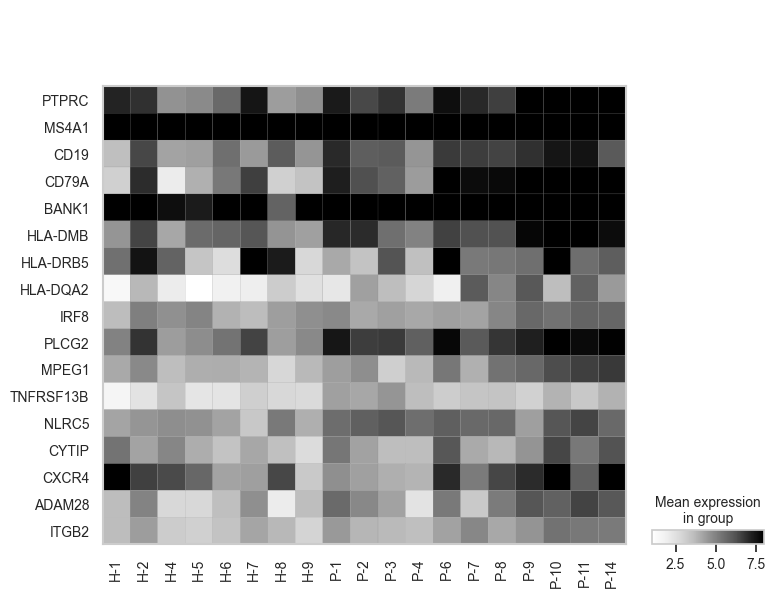

In [40]:
# Step 2: Manually set niche order
niche_order = [  'H-1', 'H-2', 'H-4', 'H-5', 'H-6',  'H-7', 'H-8',  'H-9',
               'P-1',   'P-2', 'P-3',  'P-4',  'P-6', 'P-7',  'P-8',  'P-9', 'P-10',  'P-11',  'P-14'
    ] 
adata_B.obs['PatientID_Atlas'] = adata_B.obs['PatientID_Atlas'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
 'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    #Development /Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    #Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    #Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',

]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_B,
    vmax=8,
    var_names=genes_to_plot,
    groupby='PatientID_Atlas',
    use_raw=False,
    cmap="Greys",
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_unscaled.pdf', bbox_inches='tight')

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



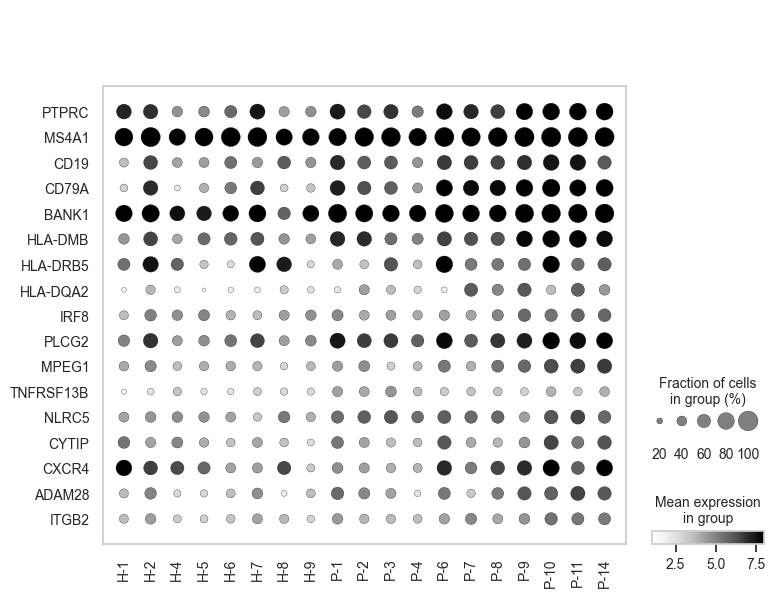

In [41]:
# Step 2: Manually set niche order
niche_order = [  'H-1', 'H-2', 'H-4', 'H-5', 'H-6',  'H-7', 'H-8',  'H-9',
               'P-1',   'P-2', 'P-3',  'P-4',  'P-6', 'P-7',  'P-8',  'P-9', 'P-10',  'P-11',  'P-14'
    ] 
adata_B.obs['PatientID_Atlas'] = adata_B.obs['PatientID_Atlas'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
 'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    #Development /Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    #Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    #Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',

]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.dotplot(
    adata_B,
    vmax=8,
    var_names=genes_to_plot,
    groupby='PatientID_Atlas',
    use_raw=False,
    cmap="Greys",
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_dotplot.pdf', bbox_inches='tight')

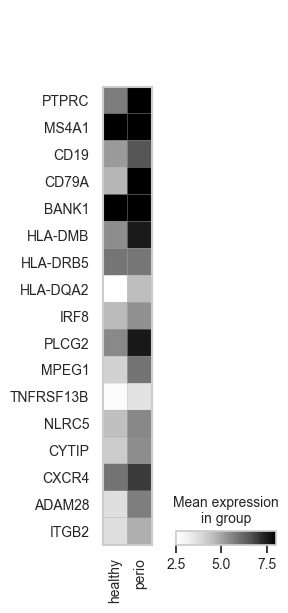

In [44]:
# Step 2: Manually set niche order
niche_order = [  'healthy', 'perio'] 
adata_B.obs['status.3'] = adata_B.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
 'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    #Development /Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    #Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    #Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',

]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.matrixplot(
    adata_B,
    vmax=8,
    var_names=genes_to_plot,
    groupby='status.3',
    use_raw=False,
    cmap="Greys",
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_condition.pdf', bbox_inches='tight')

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



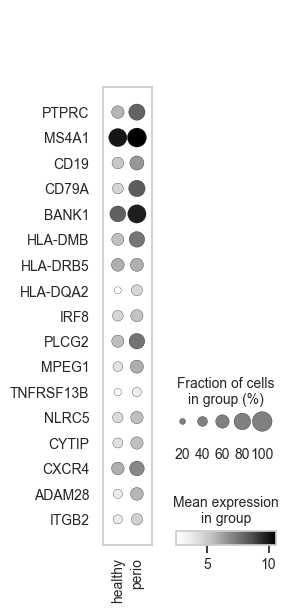

In [42]:
# Step 2: Manually set niche order
niche_order = [  'healthy', 'perio'] 
adata_B.obs['status.3'] = adata_B.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
 'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    #Development /Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    #Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    #Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',

]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

# Step 5: Plot matrixplot without dendrogram
fig = sc.pl.dotplot(
    adata_B,
    var_names=genes_to_plot,
    groupby='status.3',
    use_raw=True,
    cmap="Greys",
    swap_axes=True,
    return_fig=True
)
# Step 7: Save to desired location
fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_condition_dotplot.pdf', bbox_inches='tight')

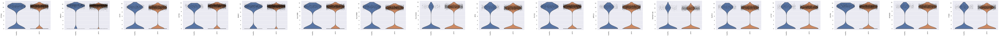

In [18]:
# Step 2: Manually set niche order
niche_order = ['healthy', 'perio']
adata_B.obs['status.3'] = adata_B.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    # Lineage defining
    'PTPRC', 'MS4A1', 'CD19', 'CD79A', 'BANK1',

    # Antigen Presentation (MHC Class II Pathway)
    'HLA-DMB', 'HLA-DRB5', 'HLA-DQA2',

    # Development / Maturation
    'IRF8', 'PLCG2', 

    # Marginal zone
    'MPEG1',

    # Immune Signaling 
    'TNFRSF13B', 'NLRC5',
    
    # Adhesion/retention
    'CYTIP', 'CXCR4', 'ADAM28', 'ITGB2',
]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_B.var_names]

sc.pl.violin(
    adata_B,
    keys=genes_to_plot,   # list of genes
    groupby="status.3",   # grouping
    rotation=90,          # rotate labels
    stripplot=True,       # show individual points
    jitter=0.4,
    multi_panel=True,     # one gene per subplot
    nrows=4               # arrange in 4 rows
)

# Step 7: Save to desired location
#fig.savefig('/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_condition.pdf', bbox_inches='tight')

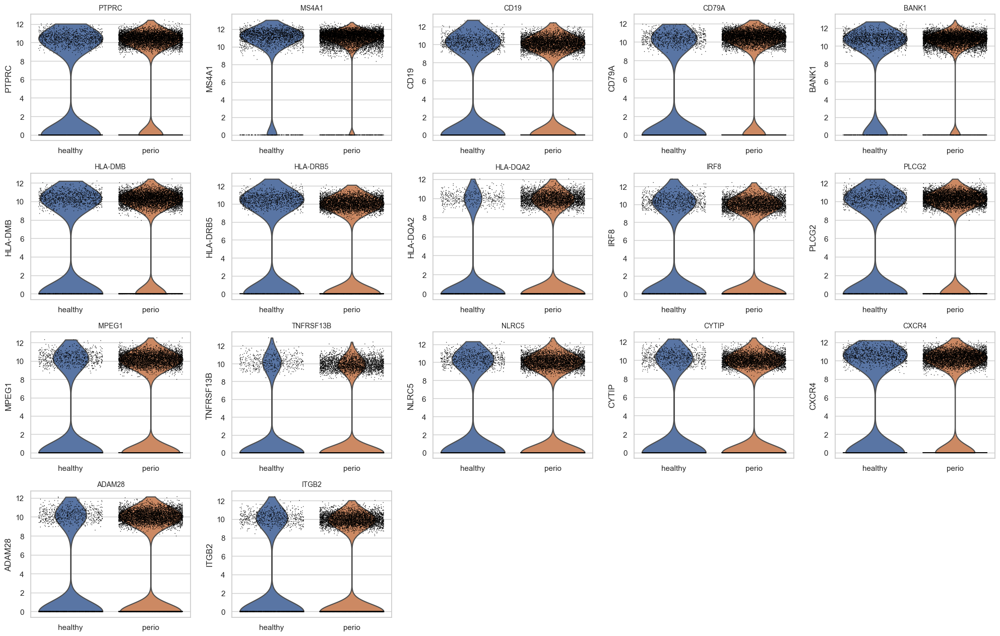

In [47]:
import numpy as np
import math
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd

# Step 2: Manually set niche order
niche_order = ['healthy', 'perio']
adata_B.obs['status.3'] = adata_B.obs['status.3'].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)

genes_of_interest = [
    'PTPRC','MS4A1','CD19','CD79A','BANK1',
    'HLA-DMB','HLA-DRB5','HLA-DQA2',
    'IRF8','PLCG2','MPEG1',
    'TNFRSF13B','NLRC5',
    'CYTIP','CXCR4','ADAM28','ITGB2',
]

# Step 4: keep only genes present
genes_to_plot = [g for g in genes_of_interest if g in adata_B.var_names]
if not genes_to_plot:
    raise ValueError("None of the requested genes are present in adata_B.var_names.")

# --- grid with 4 rows ---
n_genes = len(genes_to_plot)
nrows = 4
ncols = math.ceil(n_genes / nrows)

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3.2*nrows))
axes = np.atleast_1d(axes).ravel()

# Draw each gene on its own axis (no return_fig here)
for i, gene in enumerate(genes_to_plot):
    sc.pl.violin(
        adata_B,
        keys=gene,
        groupby="status.3",
        stripplot=True,
        jitter=0.4,
        rotation=0,
        show=False,
        ax=axes[i],
        # use_raw=False,  # uncomment/adjust depending on where your normalized values live
    )
    axes[i].set_title(gene, fontsize=10)

# Hide any unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()

# Save the WHOLE grid figure (the one from plt.subplots)
outpath = "/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/B_cell_reviewer_Fig_Violin.pdf"
fig.savefig(outpath, bbox_inches="tight", dpi=300)
plt.show()


In [25]:
# replace with your patient/sample column name
patient_col = 'PatientID_Atlas'   # <- change if needed

X = adata_B[:, genes_to_plot].X
if sp.issparse(X): X = X.toarray()

df = pd.DataFrame(X, columns=genes_to_plot)
df['status'] = adata_B.obs['status.3'].astype(str).values
df['patient'] = adata_B.obs[patient_col].astype(str).values

# average per patient within status
per_patient = df.groupby(['patient','status'], as_index=False).mean()

from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

res = []
for g in genes_to_plot:
    h = per_patient.loc[per_patient['status']=='healthy', g].values
    p = per_patient.loc[per_patient['status']=='perio', g].values
    stat, pval = mannwhitneyu(h, p, alternative='two-sided')
    res.append({'gene': g, 'U': stat, 'p': pval,
                'median_healthy': np.median(h), 'median_perio': np.median(p),
                'n_patients_healthy': h.size, 'n_patients_perio': p.size})

stats_patient = pd.DataFrame(res)
stats_patient['p_adj'] = multipletests(stats_patient['p'], method='fdr_bh')[1]
stats_patient.sort_values('p_adj', inplace=True)
stats_patient


,gene,U,p,median_healthy,median_perio,n_patients_healthy,n_patients_perio,p_adj
12,NLRC5,4.0,0.000318,4.372043,5.673460,8,11,0.004049
2,CD19,7.0,0.001191,4.477640,6.643474,8,11,0.004049
3,CD79A,7.0,0.001191,3.703310,7.781514,8,11,0.004049
11,TNFRSF13B,5.0,0.000503,2.586038,3.608780,8,11,0.004049
9,PLCG2,7.0,0.001191,4.913373,7.257894,8,11,0.004049
4,BANK1,8.0,0.001773,8.296000,9.482910,8,11,0.005023
5,HLA-DMB,10.0,0.003599,5.068282,6.997068,8,11,0.008740
16,ITGB2,12.0,0.006801,3.552242,4.456634,8,11,0.012846
7,HLA-DQA2,12.0,0.006801,2.017551,4.286365,8,11,0.012846
15,ADAM28,15.0,0.015744,3.607540,5.227198,8,11,0.026766


In [51]:
import numpy as np
import pandas as pd
import scipy.sparse as sp
import statsmodels.formula.api as smf
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.stats.multitest import multipletests
import warnings

# --- config ---
status_col  = 'status.3'          # grouping
patient_col = 'PatientID_Atlas'   # random-effects group
use_raw     = False               # set True if your normalized values are in .raw
contrast_param = "status[T.perio]"  # name of the periostatus coefficient

# Ensure categorical with correct reference order
niche_order = ['healthy', 'perio']
adata_B.obs[status_col] = adata_B.obs[status_col].astype(
    pd.CategoricalDtype(categories=niche_order, ordered=True)
)
adata_B.obs[patient_col] = adata_B.obs[patient_col].astype('category')

# Filter to genes present
genes_to_run = [g for g in genes_to_plot if g in adata_B.var_names]
if not genes_to_run:
    raise ValueError("No genes to run: none found in adata_B.var_names")

def extract_vector(adata, gene, use_raw=False):
    Xg = (adata.raw[:, gene].X if use_raw else adata[:, gene].X)
    if sp.issparse(Xg):
        return Xg.toarray().ravel()
    return np.asarray(Xg).ravel()

# Base table (status/patient)
base_tbl = pd.DataFrame({
    'status': adata_B.obs[status_col].cat.remove_unused_categories(),
    'patient': adata_B.obs[patient_col].cat.remove_unused_categories(),
})

results = []
warnings.filterwarnings("ignore", category=ConvergenceWarning)

for g in genes_to_run:
    try:
        expr = extract_vector(adata_B, g, use_raw=use_raw)

        # Build per-gene table and drop any NaNs
        tbl = base_tbl.copy()
        tbl['expr'] = expr
        tbl = tbl.dropna(subset=['expr', 'status', 'patient'])

        # If all expr are constant, skip (model ill-posed)
        if np.nanstd(tbl['expr'].values) == 0:
            results.append({
                'gene': g, 'coef': np.nan, 'se': np.nan, 'z': np.nan, 'p': np.nan,
                'ci_low': np.nan, 'ci_high': np.nan, 'n_cells': len(tbl),
                'n_patients': tbl['patient'].nunique(), 'converged': False, 'note': 'constant expr'
            })
            continue

        # Fit: expr ~ status + (1|patient)
        # status is categorical; healthy is reference due to order above
        model = smf.mixedlm("expr ~ status", data=tbl, groups=tbl["patient"])
        fit = model.fit(method='lbfgs', reml=True, maxiter=100, disp=False)

        # Pull the periostatus coefficient safely
        params = fit.params.to_dict()
        b = params.get(contrast_param, np.nan)

        # Standard errors & z/p
        bse = fit.bse.to_dict().get(contrast_param, np.nan)
        zval = (b / bse) if (np.isfinite(b) and np.isfinite(bse) and bse != 0) else np.nan
        pval = fit.pvalues.to_dict().get(contrast_param, np.nan)

        # 95% CI from conf_int if available
        ci = fit.conf_int()
        if contrast_param in ci.index:
            ci_low, ci_high = ci.loc[contrast_param, 0], ci.loc[contrast_param, 1]
        else:
            ci_low = ci_high = np.nan

        results.append({
            'gene': g,
            'coef': b,
            'se': bse,
            'z': zval,
            'p': pval,
            'ci_low': ci_low,
            'ci_high': ci_high,
            'n_cells': len(tbl),
            'n_patients': tbl['patient'].nunique(),
            'converged': bool(getattr(fit, "converged", False)),
            'note': ''
        })

    except Exception as e:
        results.append({
            'gene': g, 'coef': np.nan, 'se': np.nan, 'z': np.nan, 'p': np.nan,
            'ci_low': np.nan, 'ci_high': np.nan,
            'n_cells': np.nan, 'n_patients': np.nan,
            'converged': False,
            'note': f'error: {type(e).__name__}: {e}'
        })

stats_mixed = pd.DataFrame(results)

# FDR across genes (only on available p-values)
if stats_mixed['p'].notna().any():
    stats_mixed['p_adj'] = multipletests(
        stats_mixed['p'].fillna(1.0), method='fdr_bh'
    )[1]
else:
    stats_mixed['p_adj'] = np.nan

# A few helpful summaries
stats_mixed = stats_mixed.sort_values('p_adj', na_position='last').reset_index(drop=True)

# Show top lines
stats_mixed.head(20)


/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning:

Random effects covariance is singular

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2055: UserWarning:

The random effects covariance matrix is singular.

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2246: UserWarning:

The random effects covariance matrix is singular.

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning:

Random effects covariance is singular

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning:

Random effects covariance is singular

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scima

,gene,coef,se,z,p,ci_low,ci_high,n_cells,n_patients,converged,note,p_adj
0,HLA-DMB,1.735636,0.498007,3.485166,0.000492,0.759561,2.711711,10302,19,True,,0.008361
1,MPEG1,1.254416,0.477991,2.624349,0.008681,0.317570,2.191261,10302,19,True,,0.073793
2,CYTIP,0.823575,0.461916,1.782956,0.074594,-0.081763,1.728914,10302,19,True,,0.422697
3,MS4A1,0.533931,0.332078,1.607847,0.107869,-0.116931,1.184792,10302,19,True,,0.458442
4,PTPRC,-0.064834,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000
5,CXCR4,0.646085,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000
6,NLRC5,0.258111,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000
7,TNFRSF13B,-0.042006,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000
8,PLCG2,-0.357597,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000
9,IRF8,-0.216220,NaN,NaN,NaN,NaN,NaN,10302,19,True,,1.000000


In [148]:
adata_TAE.obs['status_Lvl4'] = adata_TAE.obs['status.3'].astype(str) + '_' + adata_TAE.obs['Lvl4'].astype(str)

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



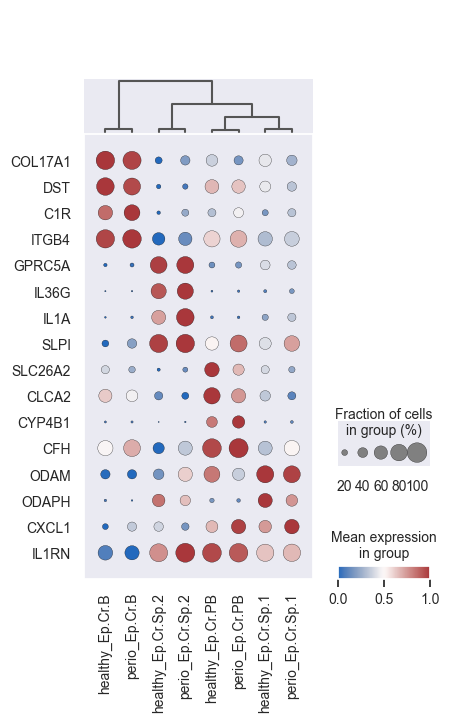

In [157]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_TAE)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_TAE, 'status_Lvl4', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_TAE.obs['status_Lvl4'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TAE.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_TAE, groupby='status_Lvl4')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_TAE.uns['dendrogram_status_Lvl4']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_TAE[adata_TAE.obs['status_Lvl4'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 2:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.dotplot(
    adata_TAE,
    var_names=genes_for_plot,
    groupby='status_Lvl4',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [112]:
print(genes_for_plot)

['COL17A1', 'DST', 'SNCA', 'C1R', 'ITGB4', 'COL16A1', 'GPRC5A', 'IL36G', 'SLPI', 'IL1A', 'ALDH1A3', 'C15orf48', 'SLC26A2', 'CLCA2', 'CYP4B1', 'CFH', 'KRT19', 'EHF', 'ODAM', 'ODAPH', 'LAMC2', 'IL1RN', 'CXCL1', 'CXCL2']


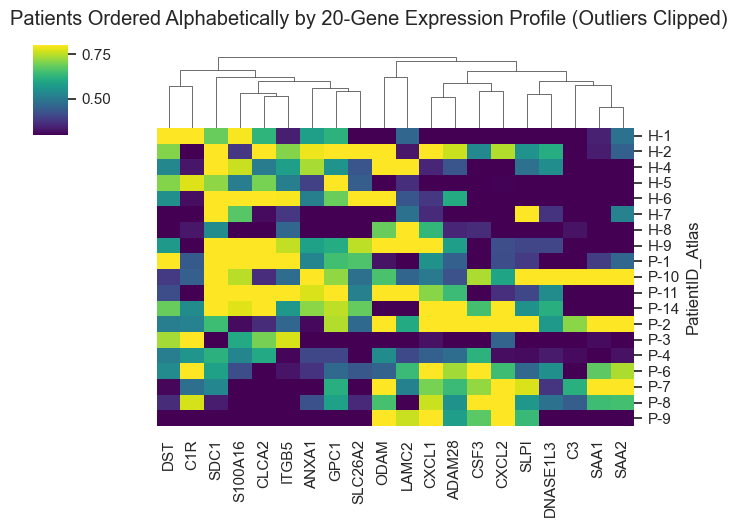

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Define your genes of interest
genes_of_interest = [
'ODAM',
 'CLCA2',
 'ITGB5',
 'GPC1',
 'SLC26A2',
 'ANXA1',
 'LAMC2',
 'SDC1',
 'DST',
 'S100A16',
 'SAA1',
 'SAA2',
 'SLPI',
 'CSF3',
 'C1R',
 'C3',
 'CXCL2',
 'CXCL1',
 'DNASE1L3',
 'ADAM28'
]

# Step 2: Subset expression matrix for these genes
X = adata_TAE[:, genes_of_interest].X
if not isinstance(X, np.ndarray):
    X = X.toarray()

# Step 3: Combine expression with patient ID
expr_df = pd.DataFrame(X, columns=genes_of_interest, index=adata_TAE.obs_names)
expr_df['PatientID_Atlas'] = adata_TAE.obs['PatientID_Atlas'].values  # assuming pt.id is in adata.obs

# Step 4: Compute mean expression per patient
mean_expr_per_patient = expr_df.groupby('PatientID_Atlas')[genes_of_interest].mean()


sns.clustermap(mean_expr_per_patient, cmap="viridis", standard_scale=1, vmin=0.3, vmax=0.8,
               figsize=(7, 5), xticklabels=True, yticklabels=True,
               row_cluster=False)  # Disable clustering to preserve order

plt.suptitle("Patients Ordered Alphabetically by 20-Gene Expression Profile (Outliers Clipped)", y=1.05)
plt.show() 

In [69]:
# Define the cluster name you want to subset
cluster_name = "Fib"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Fib= adata[adata.obs['Lvl2.5'] == cluster_name].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



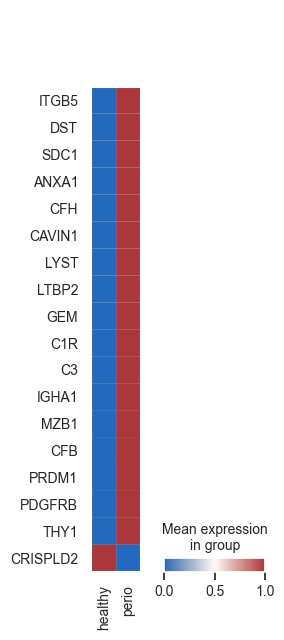

In [24]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_Fib)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_Fib, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_Fib.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_TAE.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Fib, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_Fib.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_Fib[adata_Fib.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 30:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_Fib,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [20]:
# Define the cluster name you want to subset
cluster_name = "Vascular"  # or could be an integer if it's like 0, 1, etc.

# Subset the adata to include only cells of that cluster
adata_Vasc= adata[adata.obs['Lvl1'] == cluster_name].copy()

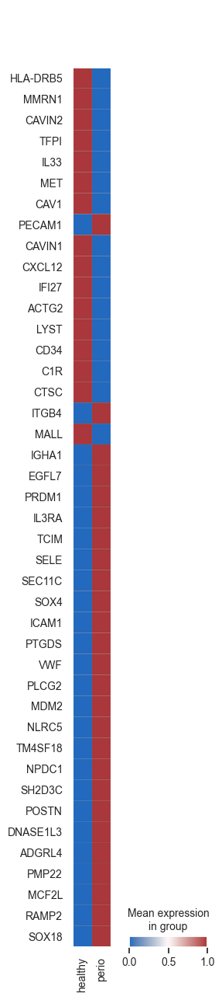

In [25]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_Vasc)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_Vasc, 'status.3', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_Vasc.obs['status.3'].cat.categories:
    top_genes_per_cluster[cluster] = adata_Vasc.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Vasc, groupby='status.3')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_Vasc.uns['dendrogram_status.3']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_Vasc[adata_Vasc.obs['status.3'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 30:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_Vasc,
    var_names=genes_for_plot,
    groupby='status.3',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [70]:
adata_Fib.obs['status_niche'] = adata_Fib.obs['status.3'].astype(str) + '_' + adata_Fib.obs['niche_knn50k10_merged'].astype(str)

In [72]:
adata_Fib.obs['status_niche'].unique().tolist()

['perio_Fibrous CT',
 'perio_Plasma-Fib CT',
 'perio_Plasma',
 'perio_Epi-CT',
 'perio_Crevicular',
 'perio_Keratin',
 'perio_Lymphoid',
 'perio_Spinous',
 'healthy_Fibrous CT',
 'healthy_Plasma-Fib CT',
 'healthy_Crevicular',
 'healthy_Lymphoid',
 'healthy_Plasma',
 'healthy_Epi-CT',
 'healthy_Keratin',
 'healthy_Spinous']

In [73]:
target_status_niches = [
    'perio_Fibrous CT', 
    'perio_Plasma-Fib CT',
    'perio_Plasma',
    'perio_Epi-CT',
    'perio_Lymphoid',
    'healthy_Fibrous CT',
    'healthy_Plasma-Fib CT',
    'healthy_Lymphoid',
    'healthy_Epi-CT',
]
adata_Fib_filtered = adata_Fib[adata_Fib.obs['status_niche'].isin(target_status_niches)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [74]:
adata_Fib_filtered.obs['status_niche'].unique().tolist()

['perio_Fibrous CT',
 'perio_Plasma-Fib CT',
 'perio_Plasma',
 'perio_Epi-CT',
 'perio_Lymphoid',
 'healthy_Fibrous CT',
 'healthy_Plasma-Fib CT',
 'healthy_Lymphoid',
 'healthy_Epi-CT']

In [46]:
cell_counts = adata_Fib_filtered.obs['status_niche'].value_counts()
print(cell_counts)

perio_Fibrous CT         33592
healthy_Fibrous CT       30373
perio_Plasma-Fib CT      15070
perio_Plasma              8516
perio_Epi-CT              6618
healthy_Epi-CT            4387
perio_Lymphoid            2982
healthy_Plasma-Fib CT      741
healthy_Lymphoid           485
Name: status_niche, dtype: int64


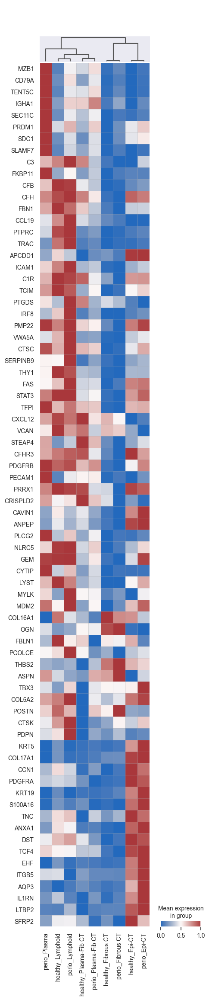

In [77]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_Fib_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_Fib_filtered, 'status_niche', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_Fib_filtered.obs['status_niche'].cat.categories:
    top_genes_per_cluster[cluster] = adata_Fib_filtered.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Fib_filtered, groupby='status_niche')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_Fib_filtered.uns['dendrogram_status_niche']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_Fib_filtered[adata_Fib_filtered.obs['status_niche'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_Fib_filtered,
    var_names=genes_for_plot,
    groupby='status_niche',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [38]:
print(genes_for_plot)

['C3', 'CXCL12', 'MZB1', 'CD79A', 'IGHA1', 'TENT5C', 'C1R', 'CFH', 'EGFR', 'PRRX1', 'SEC11C', 'PRDM1', 'SDC1', 'SLAMF7', 'FKBP11', 'PECAM1', 'CYTIP', 'PLCG2', 'TFPI', 'CFB', 'FBN1', 'CCL19', 'PTPRC', 'TRAC', 'APCDD1', 'ICAM1', 'TCIM', 'LYST', 'THY1', 'STAT3', 'PTGDS', 'IRF8', 'PMP22', 'VWA5A', 'CTSC', 'SERPINB9', 'FAS', 'GEM', 'PDPN', 'NLRC5', 'VCAN', 'STEAP4', 'CFHR3', 'PDGFRB', 'TIMP4', 'CRISPLD2', 'SH2D3C', 'CAVIN1', 'ANPEP', 'MYLK', 'MDM2', 'COL16A1', 'OGN', 'FBLN1', 'PCOLCE', 'THBS2', 'ASPN', 'TBX3', 'COL5A2', 'POSTN', 'CTSK', 'SFRP4', 'KRT5', 'COL17A1', 'CCN1', 'PDGFRA', 'KRT19', 'S100A16', 'TNC', 'ANXA1', 'DST', 'TCF4', 'EHF', 'ITGB5', 'AQP3', 'IL1RN', 'LTBP2', 'SFRP2']


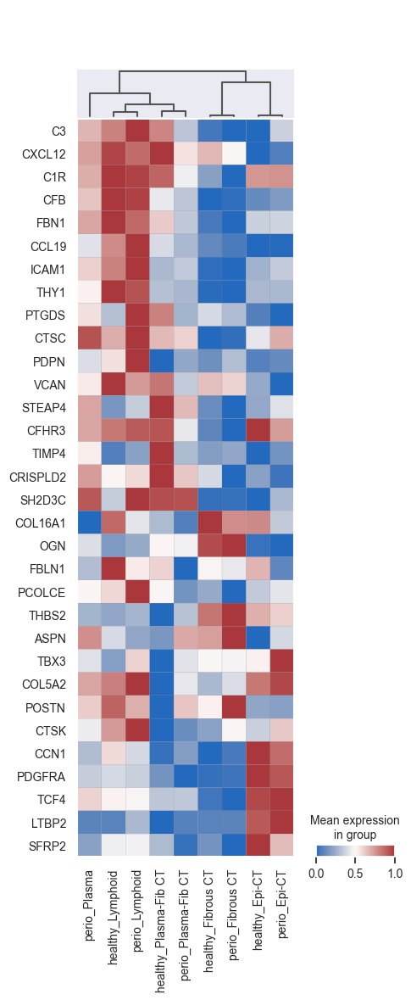

In [84]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Fib_filtered)

# Step 2: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Fib_filtered, groupby='status_niche')
cluster_order = adata_Fib_filtered.uns['dendrogram_status_niche']['categories_ordered']

# Step 3: Define your curated gene list
genes_of_interest = [
    'C3', 'CXCL12', 'C1R', 'CFB', 'FBN1',
    'CCL19', 'ICAM1', 'THY1', 'PTGDS', 'CTSC',  'PDPN', 'VCAN',
    'STEAP4', 'CFHR3',  'TIMP4', 'CRISPLD2', 'SH2D3C',
     'COL16A1', 'OGN', 'FBLN1', 'PCOLCE', 'THBS2', 'ASPN', 'TBX3', 'COL5A2',
    'POSTN', 'CTSK', 'CCN1', 'PDGFRA', 'TCF4', 
    'LTBP2', 'SFRP2'
]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Fib_filtered.var_names]

# Step 5: Plot matrixplot
sc.pl.matrixplot(
    adata_Fib_filtered,
    var_names=genes_to_plot,
    groupby='status_niche',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [53]:
adata_Vasc.obs['status_niche'] = adata_Vasc.obs['status.3'].astype(str) + '_' + adata_Vasc.obs['niche_knn50k10_merged'].astype(str)

In [54]:
adata_Vasc.obs['status_niche'].unique().tolist()

['perio_Plasma-Fib CT',
 'perio_Plasma',
 'perio_Fibrous CT',
 'perio_Epi-CT',
 'perio_Crevicular',
 'perio_Keratin',
 'perio_Spinous',
 'perio_Lymphoid',
 'healthy_Fibrous CT',
 'healthy_Crevicular',
 'healthy_Plasma-Fib CT',
 'healthy_Epi-CT',
 'healthy_Spinous',
 'healthy_Lymphoid',
 'healthy_Keratin',
 'healthy_Plasma']

In [55]:
target_status_niches = [
    'perio_Fibrous CT', 
    'perio_Plasma-Fib CT',
    'perio_Plasma',
    'perio_Epi-CT',
    'perio_Lymphoid',
    'healthy_Fibrous CT',
    'healthy_Plasma-Fib CT',
    'healthy_Lymphoid',
    'healthy_Epi-CT',
]
adata_Vasc_filtered = adata_Vasc[adata_Vasc.obs['status_niche'].isin(target_status_niches)].copy()

In [56]:
cell_counts = adata_Vasc_filtered.obs['status_niche'].value_counts()
print(cell_counts)

perio_Fibrous CT         16324
healthy_Fibrous CT       14735
perio_Plasma-Fib CT      13698
perio_Plasma              5212
perio_Epi-CT              4077
healthy_Epi-CT            2301
perio_Lymphoid            1783
healthy_Plasma-Fib CT      574
healthy_Lymphoid           313
Name: status_niche, dtype: int64


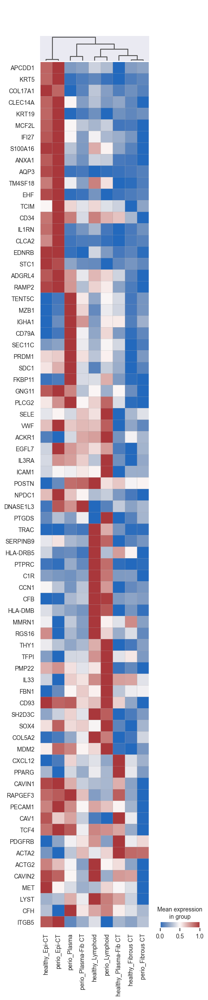

In [57]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_Vasc_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_Vasc_filtered, 'status_niche', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_Vasc_filtered.obs['status_niche'].cat.categories:
    top_genes_per_cluster[cluster] = adata_Vasc_filtered.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Vasc_filtered, groupby='status_niche')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_Vasc_filtered.uns['dendrogram_status_niche']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_Vasc_filtered[adata_Vasc_filtered.obs['status_niche'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 10:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_Vasc_filtered,
    var_names=genes_for_plot,
    groupby='status_niche',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [38]:
print(genes_for_plot)

['C3', 'CXCL12', 'MZB1', 'CD79A', 'IGHA1', 'TENT5C', 'C1R', 'CFH', 'EGFR', 'PRRX1', 'SEC11C', 'PRDM1', 'SDC1', 'SLAMF7', 'FKBP11', 'PECAM1', 'CYTIP', 'PLCG2', 'TFPI', 'CFB', 'FBN1', 'CCL19', 'PTPRC', 'TRAC', 'APCDD1', 'ICAM1', 'TCIM', 'LYST', 'THY1', 'STAT3', 'PTGDS', 'IRF8', 'PMP22', 'VWA5A', 'CTSC', 'SERPINB9', 'FAS', 'GEM', 'PDPN', 'NLRC5', 'VCAN', 'STEAP4', 'CFHR3', 'PDGFRB', 'TIMP4', 'CRISPLD2', 'SH2D3C', 'CAVIN1', 'ANPEP', 'MYLK', 'MDM2', 'COL16A1', 'OGN', 'FBLN1', 'PCOLCE', 'THBS2', 'ASPN', 'TBX3', 'COL5A2', 'POSTN', 'CTSK', 'SFRP4', 'KRT5', 'COL17A1', 'CCN1', 'PDGFRA', 'KRT19', 'S100A16', 'TNC', 'ANXA1', 'DST', 'TCF4', 'EHF', 'ITGB5', 'AQP3', 'IL1RN', 'LTBP2', 'SFRP2']


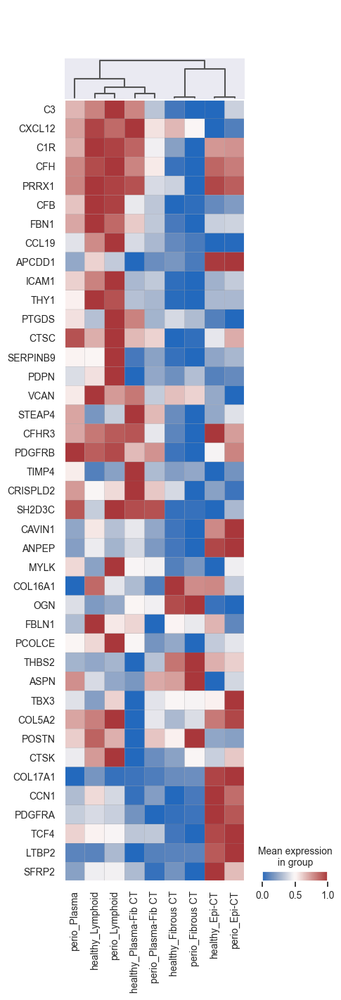

In [50]:
# Step 1: Log-transform if not already done
sc.pp.log1p(adata_Fib_filtered)

# Step 2: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_Fib_filtered, groupby='status_niche')
cluster_order = adata_Fib_filtered.uns['dendrogram_status_niche']['categories_ordered']

# Step 3: Define your curated gene list
genes_of_interest = [
    'C3', 'CXCL12', 'C1R', 'CFH', 'PRRX1', 'CFB', 'FBN1',
    'CCL19', 'APCDD1', 'ICAM1', 'THY1', 'PTGDS', 'CTSC', 'SERPINB9', 'PDPN', 'VCAN',
    'STEAP4', 'CFHR3', 'PDGFRB', 'TIMP4', 'CRISPLD2', 'SH2D3C', 'CAVIN1', 'ANPEP',
    'MYLK', 'COL16A1', 'OGN', 'FBLN1', 'PCOLCE', 'THBS2', 'ASPN', 'TBX3', 'COL5A2',
    'POSTN', 'CTSK', 'COL17A1', 'CCN1', 'PDGFRA', 'TCF4', 
    'LTBP2', 'SFRP2'
]

# Step 4: Filter only genes that exist in the dataset
genes_to_plot = [gene for gene in genes_of_interest if gene in adata_Fib_filtered.var_names]

# Step 5: Plot matrixplot
sc.pl.matrixplot(
    adata_Fib_filtered,
    var_names=genes_to_plot,
    groupby='status_niche',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [70]:
adata_nonimmune.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_to_Crevicular,distance_cluster
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,354.020614,1
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,352.475693,1
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,357.475479,1
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,386.596337,2
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,379.573441,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,11,6,0,0,0,Fib CT 1,Fibrous CT,NaN,609.640863,2
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,NaN,693.317526,2
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,NaN,692.303945,2


In [95]:
cluster_names = ["perio"]

adata_perio = adata_nonimmune_filtered[adata_nonimmune_filtered.obs['status.3'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



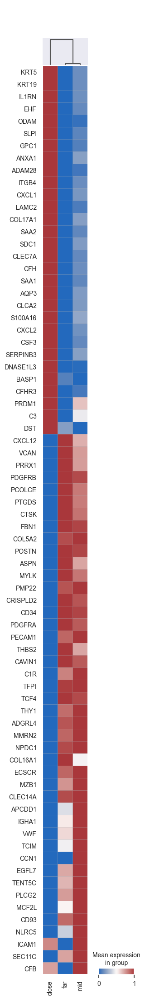

In [97]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_perio)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_perio, 'distance_zone', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_perio.obs['distance_zone'].cat.categories:
    top_genes_per_cluster[cluster] = adata_perio.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_perio, groupby='distance_zone')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_perio.uns['dendrogram_distance_zone']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_perio[adata_perio.obs['distance_zone'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 30:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_perio,
    var_names=genes_for_plot,
    groupby='distance_zone',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [98]:
adata.obs['pt.id'].unique().tolist()

['HV204',
 'HV187',
 'HV214',
 'HV154',
 'HV191',
 'HV203',
 'HV207',
 'HV137',
 'HV184',
 'HV196',
 'HV181',
 'HV180',
 'HV185',
 'HV188',
 'HV211',
 'HV189',
 'HV140',
 'HV160',
 'HV171',
 'HV192',
 'HV198',
 'HV205',
 'HV219',
 'HV220']

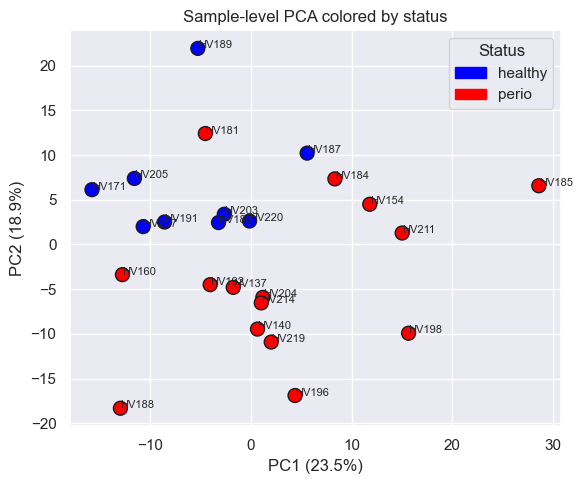

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches

# Step 1: Get unique sample IDs
sample_ids = adata.obs['pt.id'].unique()

# Step 2: Aggregate mean expression per sample
sample_expr = []
for sample in sample_ids:
    sample_mask = adata.obs['pt.id'] == sample
    X_sample = adata[sample_mask].X

    # Convert to dense and average if sparse
    mean_expr = X_sample.mean(axis=0)
    if hasattr(mean_expr, 'A1'):
        mean_expr = mean_expr.A1
    sample_expr.append(mean_expr)

# Step 3: Create DataFrame of samples × genes
df_sample_expr = pd.DataFrame(sample_expr, index=sample_ids, columns=adata.var_names)

# Optional: use only highly variable genes
if 'highly_variable' in adata.var.columns:
    hvg_genes = adata.var_names[adata.var['highly_variable']]
    df_sample_expr = df_sample_expr[hvg_genes]

# Step 4: Normalize across genes (z-score per gene)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_sample_expr)

# Step 5: PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Step 6: Extract status per sample
sample_status = adata.obs[['pt.id', 'status.3']].drop_duplicates().set_index('pt.id')
status_aligned = sample_status.loc[sample_ids, 'status.3']

# Step 7: Assign colors to statuses
color_map = {'healthy': 'blue', 'perio': 'red'}
colors = status_aligned.map(color_map)

# Step 8: Plot PCA
plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=colors, s=100, edgecolor='k')

# Annotate sample names
for i, name in enumerate(sample_ids):
    plt.text(X_pca[i, 0], X_pca[i, 1], name, fontsize=8)

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")
plt.title("Sample-level PCA colored by status")
plt.grid(True)

# Add legend
legend_handles = [mpatches.Patch(color=c, label=l) for l, c in color_map.items()]
plt.legend(handles=legend_handles, title="Status", loc='best')

plt.tight_layout()
plt.show()


In [23]:
import numpy as np

def perm_hotelling_pval(X, y, n_perm=9999, seed=0):
    """
    X: (n_samples, 2) matrix of PC scores (PC1, PC2)
    y: array-like of group labels (exactly 2 unique groups)
    """
    rng = np.random.default_rng(seed)
    y = np.asarray(y)
    groups = np.unique(y)
    assert len(groups) == 2, "This function handles exactly two groups."

    def T2_stat(X, y):
        g0, g1 = groups
        X0 = X[y == g0]
        X1 = X[y == g1]
        n0, n1 = len(X0), len(X1)
        m0, m1 = X0.mean(axis=0), X1.mean(axis=0)
        S0 = np.cov(X0, rowvar=False)
        S1 = np.cov(X1, rowvar=False)
        Sp = ((n0-1)*S0 + (n1-1)*S1) / (n0 + n1 - 2)

        # robust inverse in case Sp is near-singular
        Sp_inv = np.linalg.pinv(Sp)
        d = (m0 - m1)
        return (n0*n1/(n0+n1)) * d @ Sp_inv @ d

    T2_obs = T2_stat(X, y)

    # permutation null
    ge = 1  # count obs as one exceedance (uniformly most powerful unbiased)
    for _ in range(n_perm):
        y_perm = rng.permutation(y)
        if T2_stat(X, y_perm) >= T2_obs - 1e-12:
            ge += 1

    p = ge / (n_perm + 1)
    return T2_obs, p

# --- Use it on your PCA plane ---
X = X_pca[:, :2]
y = status_aligned.values
T2, pval = perm_hotelling_pval(X, y, n_perm=9999, seed=42)
print({"T2": float(T2), "p_perm": float(pval)})


IndexError: boolean index did not match indexed array along dimension 0; dimension is 19 but corresponding boolean dimension is 24

In [22]:
from statsmodels.multivariate.manova import MANOVA

# Create a DataFrame for MANOVA
df_pca = pd.DataFrame(X_pca, index=sample_ids, columns=['PC1', 'PC2'])
df_pca['status'] = status_aligned.values

# Run MANOVA
maov = MANOVA.from_formula('PC1 + PC2 ~ status', data=df_pca)
print(maov.mv_test())


ValueError: Shape of passed values is (19, 2), indices imply (24, 2)

In [5]:
adata_nonimmune.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_to_Crevicular
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,354.020614
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,352.475693
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,357.475479
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,386.596337,386.596337
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,1,10,1,3,4,4,Fib CT 2,Fibrous CT,379.573441,379.573441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,6,11,6,0,0,0,Fib CT 1,Fibrous CT,NaN,609.640863
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,1,9,1,8,4,4,Plasma-Fib CT,Plasma-Fib CT,NaN,693.317526
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,1,9,1,8,8,3,Plasma-Fib CT,Plasma-Fib CT,NaN,692.303945


In [80]:
def assign_zone(d):
    if pd.isna(d):
        return 'unknown'
    elif d <= 100:
        return 'close'
    elif d <= 500:
        return 'mid'
    else:
        return 'far'

# Apply to your existing distance column
adata_nonimmune_filtered.obs['distance_zone'] = adata_nonimmune_filtered.obs['distance_to_Crevicular'].apply(assign_zone)

In [6]:
cluster_names = ["mid", "close", "far"]

adata_nonimmune_filtered = adata_nonimmune_filtered[adata_nonimmune_filtered.obs['distance_zone'].isin(cluster_names)].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



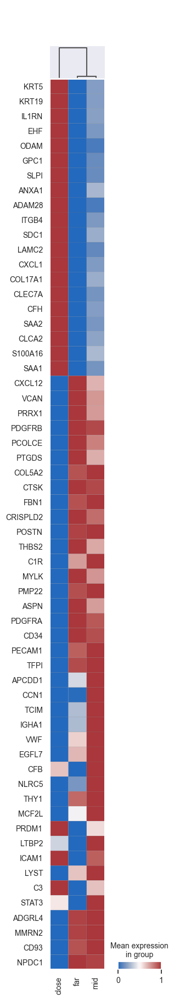

In [7]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_nonimmune_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_nonimmune_filtered, 'distance_zone', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_nonimmune_filtered.obs['distance_zone'].cat.categories:
    top_genes_per_cluster[cluster] = adata_nonimmune_filtered.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_nonimmune_filtered, groupby='distance_zone')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_nonimmune_filtered.uns['dendrogram_distance_zone']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_nonimmune_filtered[adata_nonimmune_filtered.obs['distance_zone'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_nonimmune_filtered,
    var_names=genes_for_plot,
    groupby='distance_zone',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

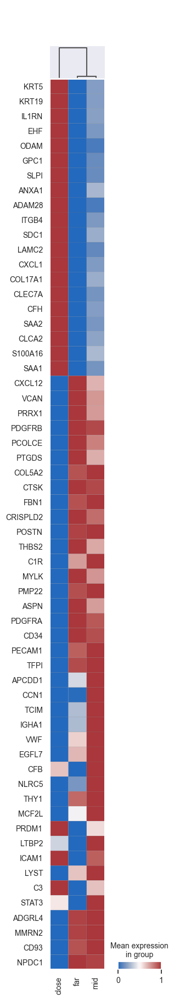

In [7]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_nonimmune_filtered)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_nonimmune_filtered, 'distance_zone', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_nonimmune_filtered.obs['distance_zone'].cat.categories:
    top_genes_per_cluster[cluster] = adata_nonimmune_filtered.uns['rank_genes_groups']['names'][cluster][:50]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_nonimmune_filtered, groupby='distance_zone')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_nonimmune_filtered.uns['dendrogram_distance_zone']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_nonimmune_filtered[adata_nonimmune_filtered.obs['distance_zone'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).A1  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.2]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_nonimmune_filtered,
    var_names=genes_for_plot,
    groupby='distance_zone',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [8]:
all_genes = adata.var_names.tolist()

In [9]:
for gene in all_genes:
    print(gene)

ABCC11
ACE2
ACKR1
ACTA2
ACTG2
ADAM28
ADAMTS1
ADGRE1
ADGRL4
ADH1C
ADH4
ADIPOQ
AGER
AGR3
AHSP
AIF1
ALAS2
ALDH1A3
AMY2A
ANGPT2
ANPEP
ANXA1
APCDD1
APOA5
APOBEC3A
APOLD1
AQP2
AQP3
AQP8
AQP9
AR
ARFGEF3
ARG1
ASCL1
ASCL3
ASPN
BAMBI
BANK1
BASP1
BBOX1
BCL2L11
BMP4
BMX
BTNL9
C15orf48
C1R
C1orf162
C1orf194
C20orf85
C3
C5orf46
C6orf118
C7
CA4
CAMP
CAPN8
CAV1
CAVIN1
CAVIN2
CCDC39
CCDC78
CCL19
CCL27
CCL3L1
CCL5
CCN1
CCNB2
CCR2
CCR6
CCR7
CD14
CD163
CD19
CD1A
CD1C
CD1E
CD2
CD207
CD247
CD27
CD274
CD28
CD300E
CD34
CD3D
CD3E
CD4
CD5L
CD68
CD69
CD70
CD79A
CD83
CD86
CD8A
CD93
CDH16
CDK1
CENPF
CFAP53
CFB
CFH
CFHR1
CFHR3
CFTR
CHGA
CLCA1
CLCA2
CLEC10A
CLEC14A
CLEC4D
CLEC4E
CLEC7A
CLECL1
CLIC6
CNFN
CNN1
COCH
COL16A1
COL17A1
COL5A2
COL8A1
CPA3
CRHBP
CRISPLD2
CSF2RA
CSF3
CSF3R
CTLA4
CTSC
CTSG
CTSK
CXCL1
CXCL10
CXCL12
CXCL14
CXCL17
CXCL2
CXCL5
CXCL6
CXCL9
CXCR4
CYP1A1
CYP2A7
CYP2B6
CYP2F1
CYP3A4
CYP4B1
CYTIP
DERL3
DES
DIRAS3
DMBT1
DNAAF1
DNASE1L3
DPEP1
DPT
DST
DUSP2
ECSCR
EDN1
EDNRB
EGFL7
EGFR
EHF
ELF5
EPCAM
ERBB2

In [7]:
# Step 1: Define your genes of interest
genes_of_interest = [
    'ADIPOQ', 'ANGPT2', 'BMP4', 'C3', 'CCL19', 'CCL27', 'CCL3L1', 'CCL5', 
    'CD70', 'CD274', 'CD86', 'CHGA', 'CSF3',
    'CTSG', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL5', 'CXCL6', 'CXCL9', 'EDN1',
    'FBN1', 'GCG', 'GDF15', 'GHRL', 'HAMP', 'IGF1', 'IL1A',
    'IL33', 'IL36A', 'IL36G', 'IL17F',
    'INS', 'KNG1', 'LIF', 'MMRN2', 'NLRP3', 'PENK', 'PPY', 'PTN', 'SEMA3C',
    'SFRP2', 'SST', 'TAC1', 'TFF2'
]
# Keep only genes present in the dataset
valid_genes = [gene for gene in genes_of_interest if gene in adata_nonimmune_filtered.var_names]
adata_filtered_genes = adata_nonimmune_filtered[:, valid_genes].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [8]:
adata_filtered_genes.var

""
ADIPOQ
ANGPT2
BMP4
C3
CCL19
CCL27
CCL3L1
CCL5
CD70
CD274


In [13]:
import scipy.sparse

cluster_data = adata_filtered_genes[adata_filtered_genes.obs['distance_bin_100um'] == cluster]

if scipy.sparse.issparse(adata_filtered_genes.X):
    adata_filtered_genes.X = adata_filtered_genes.X.toarray()
gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).flatten()


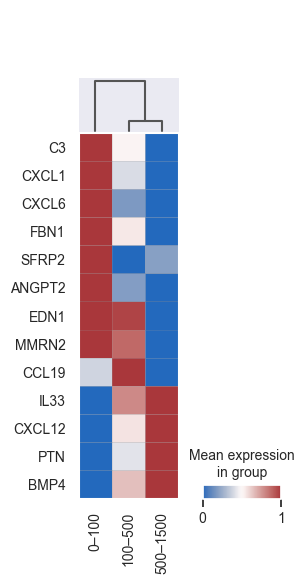

In [14]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_filtered_genes)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_filtered_genes, 'distance_bin_100um', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_filtered_genes.obs['distance_bin_100um'].cat.categories:
    top_genes_per_cluster[cluster] = adata_filtered_genes.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_filtered_genes, groupby='distance_bin_100um')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_filtered_genes.uns['dendrogram_distance_bin_100um']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_filtered_genes[adata_filtered_genes.obs['distance_bin_100um'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).flatten()
  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_filtered_genes,
    var_names=genes_for_plot,
    groupby='distance_bin_100um',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

In [28]:
adata_filtered_genes.obs['status_TAEdistance'] = adata_filtered_genes.obs['status.3'].astype(str) + '_' + adata_filtered_genes.obs['distance_bin_100um'].astype(str)

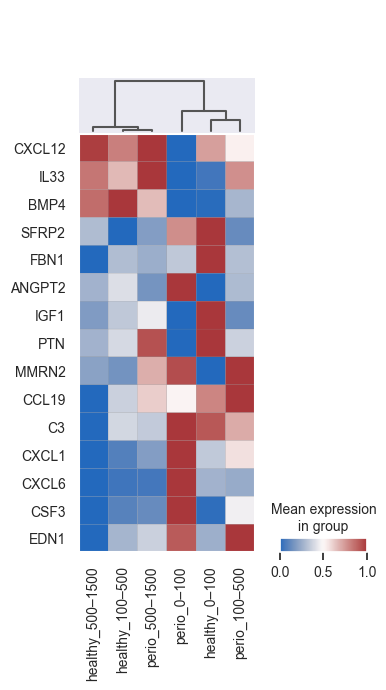

In [31]:
# Step 3: Log-transform the data if not already done
sc.pp.log1p(adata_filtered_genes)

# Step 4: Perform differential expression analysis using the Wilcoxon method
sc.tl.rank_genes_groups(adata_filtered_genes, 'status_TAEdistance', method='wilcoxon', use_raw=False)

# Step 5: Extract top marker genes for each cluster
top_genes_per_cluster = {}
for cluster in adata_filtered_genes.obs['status_TAEdistance'].cat.categories:
    top_genes_per_cluster[cluster] = adata_filtered_genes.uns['rank_genes_groups']['names'][cluster][:20]  # Top 20 genes

# Step 6: Generate dendrogram for cluster ordering
sc.tl.dendrogram(adata_filtered_genes, groupby='status_TAEdistance')

# Step 7: Retrieve the cluster order based on the dendrogram
cluster_order = adata_filtered_genes.uns['dendrogram_status_TAEdistance']['categories_ordered']

# Step 8: Filter genes based on 20% expression threshold
filtered_genes = set()
for cluster in cluster_order:
    cluster_data = adata_filtered_genes[adata_filtered_genes.obs['status_TAEdistance'] == cluster]
    # Calculate the fraction of cells expressing each gene in the cluster
    gene_expression_fraction = (cluster_data.X > 0).mean(axis=0).flatten()
  # Sparse matrix to 1D array
    genes_above_threshold = cluster_data.var_names[gene_expression_fraction > 0.05]
    filtered_genes.update(genes_above_threshold)

# Step 9: Ensure unique genes for plotting
unique_genes = set()
genes_for_plot = []

for cluster in cluster_order:
    if cluster in top_genes_per_cluster:
        cluster_genes = top_genes_per_cluster[cluster]
        genes_for_this_cluster = []
        for gene in cluster_genes:
            if len(genes_for_this_cluster) >= 20:
                break
            if gene in filtered_genes and gene not in unique_genes:
                unique_genes.add(gene)
                genes_for_this_cluster.append(gene)
        genes_for_plot.extend(genes_for_this_cluster)

# Step 10: Plot the dotplot with the filtered genes, swapping axes if necessary
sc.pl.matrixplot(
    adata_filtered_genes,
    var_names=genes_for_plot,
    groupby='status_TAEdistance',
    dendrogram=True,
    use_raw=False,
    cmap="vlag",
    standard_scale='var',
    swap_axes=True
)

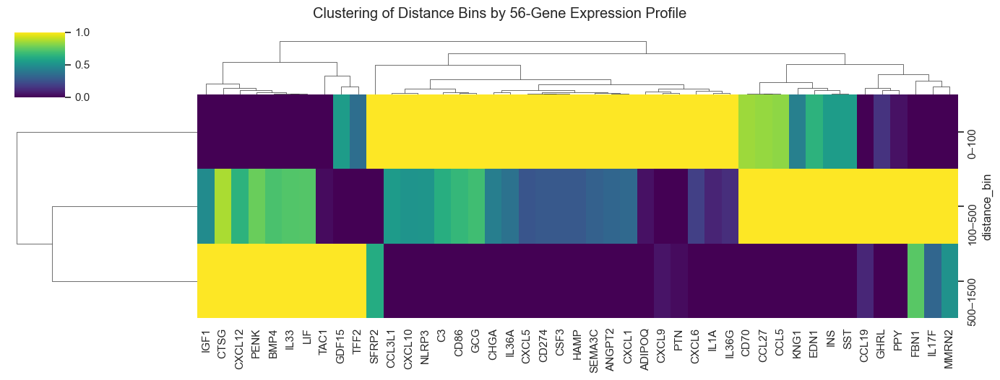

In [115]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Define your genes of interest
genes_of_interest = [
    'ADIPOQ', 'ANGPT2', 'BMP4', 'C3', 'CCL19', 'CCL27', 'CCL3L1', 'CCL5', 
    'CD70', 'CD274', 'CD86', 'CHGA', 'CSF3',
    'CTSG', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL5', 'CXCL6', 'CXCL9', 'EDN1',
    'FBN1', 'GCG', 'GDF15', 'GHRL', 'HAMP', 'IGF1', 'IL1A',
    'IL33', 'IL36A', 'IL36G', 'IL17F',
    'INS', 'KNG1', 'LIF', 'MMRN2', 'NLRP3', 'PENK', 'PPY', 'PTN', 'SEMA3C',
    'SFRP2', 'SST', 'TAC1', 'TFF2'
]

# Step 2: Subset expression matrix for these genes
# Make sure .X is dense or convert if needed
X = adata_nonimmune_filtered[:, genes_of_interest].X
if not isinstance(X, np.ndarray):
    X = X.toarray()

# Step 3: Bin cells by distance
df = adata_nonimmune_filtered.obs[['distance_to_Crevicular']].copy()
df['distance_bin'] = pd.cut(
    df['distance_to_Crevicular'],
    bins=[0, 100, 500, 1500],
    labels = [
    "0–100", "100–500", "500–1500"
]
)

# Step 4: Combine gene expression + bin labels into one DataFrame
expr_df = pd.DataFrame(X, columns=genes_of_interest, index=adata_nonimmune_filtered.obs_names)
expr_df['distance_bin'] = df['distance_bin'].values

# Step 5: Compute mean expression per distance bin
bin_means = expr_df.groupby('distance_bin')[genes_of_interest].mean()

# Step 6: Handle missing data
bin_means_cleaned = bin_means.fillna(0)  # or .dropna() if preferred

# Step 7: Plot heatmap with clustering
sns.clustermap(bin_means_cleaned, cmap="viridis", standard_scale=1,  figsize=(14, 5),)
plt.suptitle("Clustering of Distance Bins by 56-Gene Expression Profile", y=1.05)
plt.show()

In [33]:
adata_nonimmune_filtered.obs.columns.unique().tolist()

['cell_id',
 'x_centroid',
 'y_centroid',
 'transcript_counts',
 'control_probe_counts',
 'control_codeword_counts',
 'unassigned_codeword_counts',
 'deprecated_codeword_counts',
 'total_counts',
 'cell_area',
 'nucleus_area_x',
 'orig.ident',
 'nucleus_area_y',
 'pt.id',
 'oct.id',
 'status',
 'status.2',
 'status.3',
 'age',
 'sex',
 'race',
 'region',
 'orig_reg',
 'total_area_mm2',
 'Lvl1',
 'Lvl2',
 'Lvl3',
 'epiHL',
 'fibHL',
 'endoHL',
 'immuneHL',
 'Lvl4',
 'Lvl1_IE',
 'Lvl2_IE',
 'lymphoidHL',
 'myeloidHL',
 'sample',
 '_scvi_batch',
 '_scvi_labels',
 'cc8',
 'cc14',
 'cc17',
 'Lvl2.5',
 'niche_cc14',
 'Lvl4_old',
 'T_leiden',
 'T_leiden2',
 'T_leiden3',
 'Lvl4_thesis',
 'F_leiden',
 'V_leiden',
 'V_leiden2',
 'Lvl5',
 'B_leiden',
 'Lvl4_kmeans_Mel',
 'Mel_leiden',
 'KNN100_K10',
 'KNN100_K12',
 'spatial_expression_cluster',
 'KNN50_K10',
 'KNN30_K10',
 'KNN10_K10',
 'niche_knn50k10',
 'niche_knn50k10_merged',
 'distance_to_TAE',
 'distance_to_Crevicular',
 'distance_zone']

In [34]:
adata_nonimmune_filtered.obs['distance_to_Crevicular_category'] = adata_nonimmune_filtered.obs['distance_to_Crevicular']

In [36]:
adata_nonimmune_filtered.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_to_TAE,distance_to_Crevicular,distance_zone,distance_to_Crevicular_category,distance_bin_100um
cell_id,,,,,,,,,,,,,,,,,,,,,
aaedmhbh-1,aaedmhbh-1,869.532410,1704.096802,93,0,0,0,0,93,45.156252,...,8,8,3,Plasma-Fib CT,Plasma-Fib CT,354.020614,354.020614,far,354.020614,300–400
aaenabai-1,aaenabai-1,878.547424,1695.683960,114,0,0,0,0,114,59.199846,...,8,8,3,Plasma-Fib CT,Plasma-Fib CT,352.475693,352.475693,far,352.475693,300–400
aaepboic-1,aaepboic-1,861.960388,1708.142212,85,0,0,0,0,85,38.292501,...,8,8,3,Plasma-Fib CT,Plasma-Fib CT,357.475479,357.475479,far,357.475479,300–400
aafhlncj-1,aafhlncj-1,873.180054,1651.446777,4,0,0,0,0,4,6.276719,...,3,4,4,Fib CT 2,Fibrous CT,386.596337,386.596337,far,386.596337,300–400
aafhmgec-1,aafhmgec-1,883.622314,1651.088257,21,0,0,0,0,21,22.939376,...,3,4,4,Fib CT 2,Fibrous CT,379.573441,379.573441,far,379.573441,300–400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimlmalf-1,oimlmalf-1,1543.942139,1414.318237,158,0,0,0,0,158,64.257346,...,0,0,0,Fib CT 1,Fibrous CT,NaN,609.640863,far,609.640863,600–700
oimpedpp-1,oimpedpp-1,1555.247559,1302.461670,81,0,0,0,0,81,24.158595,...,8,4,4,Plasma-Fib CT,Plasma-Fib CT,NaN,693.317526,far,693.317526,600–700
oimpocjl-1,oimpocjl-1,1548.523193,1297.322021,23,0,0,0,0,23,10.205313,...,8,8,3,Plasma-Fib CT,Plasma-Fib CT,NaN,692.303945,far,692.303945,600–700


In [40]:
adata_nonimmune_filtered.obs['sample'].unique().tolist()

['s1r1_a',
 's1r1_b',
 's1r2',
 's1r3',
 's2r1_HV203',
 's2r1_HV207',
 's2r2_HV184',
 's2r3',
 's2r4_a',
 's2r7_b',
 's2r8_HV185',
 's2r8_HV188_a',
 's2r8_HV211',
 's2r9_b',
 'HV137A',
 'HV140A_A',
 'HV140A_B',
 'HV140A_C',
 'HV140A_D',
 'HV160C_A',
 'HV160C_B',
 'HV171A',
 'HV191A_A',
 'HV191A_B',
 'HV192A_B',
 'HV198B_A',
 'HV198B_B',
 'HV205A',
 'HV205B',
 'HV219AS_A',
 'HV219AS_C',
 'HV220A_A',
 'HV220A_B']

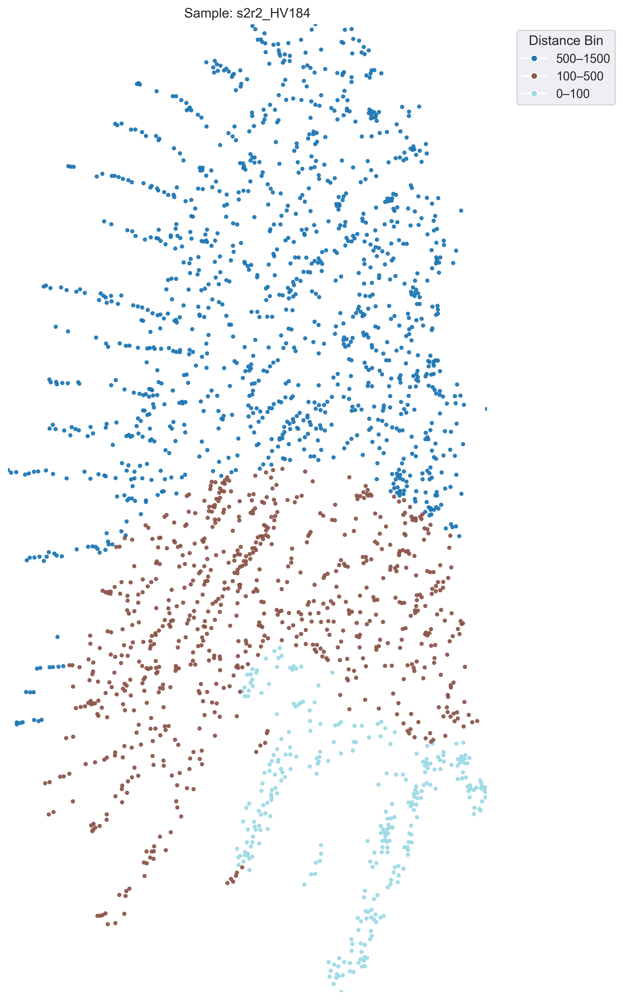

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import os

def generate_spatial_plot_distance_bins(adata, sample_names, distance_key, save_dir):
    # Ensure output directory exists
    os.makedirs(save_dir, exist_ok=True)

    # Define the rotation angle in degrees
    rotation_angle = 0
    rotation_rad = np.deg2rad(rotation_angle)

    # Rotation matrix
    rotation_matrix = np.array([
        [np.cos(rotation_rad), -np.sin(rotation_rad)],
        [np.sin(rotation_rad),  np.cos(rotation_rad)]
    ])

    # Horizontal flip matrix
    horizontal_flip_matrix = np.array([
        [-1, 0],
        [0, -1]
    ])

    # Combined transformation matrix
    combined_matrix = rotation_matrix @ horizontal_flip_matrix

    for sample_name in sample_names:
        # Subset the data
        subset_adata = adata[adata.obs['sample'] == sample_name].copy()

        # Get x/y coordinates
        x_coords = subset_adata.obs['x_centroid'].values
        y_coords = subset_adata.obs['y_centroid'].values

        # Apply transformation
        coords = np.vstack((x_coords, y_coords))
        transformed_coords = combined_matrix @ coords
        new_x_coords = transformed_coords[0, :]
        new_y_coords = transformed_coords[1, :]

        # Aspect ratio
        x_range = new_x_coords.max() - new_x_coords.min()
        y_range = new_y_coords.max() - new_y_coords.min()
        aspect_ratio = x_range / y_range
        figsize = (6 * aspect_ratio, 6) if aspect_ratio > 1 else (6, 6 / aspect_ratio)

        # Generate color map for bins
        unique_bins = subset_adata.obs[distance_key].dropna().unique()
        random_colors = plt.cm.tab20(np.linspace(0, 1, len(unique_bins)))
        bin_color_map = {bin_label: mcolors.to_hex(color) for bin_label, color in zip(unique_bins, random_colors)}

        # Map colors
        subset_adata.obs['plot_color'] = subset_adata.obs[distance_key].map(bin_color_map)

        # Plot
        plt.figure(figsize=figsize)
        ax = plt.gca()
        plt.gcf().patch.set_facecolor('white')
        ax.set_facecolor('white')

        plt.scatter(
            x=new_x_coords,
            y=new_y_coords,
            c=subset_adata.obs['plot_color'],
            s=8,
            alpha=0.9
        )

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlim(new_x_coords.min(), new_x_coords.max())
        ax.set_ylim(new_y_coords.min(), new_y_coords.max())
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        # Optional legend
        handles = [
            plt.Line2D([0], [0], marker='o', color='w',
                       markerfacecolor=bin_color_map[bin_label],
                       label=str(bin_label), markersize=6)
            for bin_label in unique_bins
        ]
        plt.legend(handles=handles, title='Distance Bin', bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.gcf().set_dpi(300)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
        plt.title(f"Sample: {sample_name}")

        # Save to SVG
        save_path = os.path.join(save_dir, f"{sample_name}_distance_bins.svg")
        plt.savefig(save_path, format='svg', bbox_inches='tight')
        plt.show()
        plt.close()

# Example usage:
sample_names = ['s2r2_HV184']
save_directory = '/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/'  # change this to your desired path

generate_spatial_plot_distance_bins(
    adata=adata_filtered_genes,
    sample_names=sample_names,
    distance_key='distance_bin_100um',
    save_dir=save_directory
)


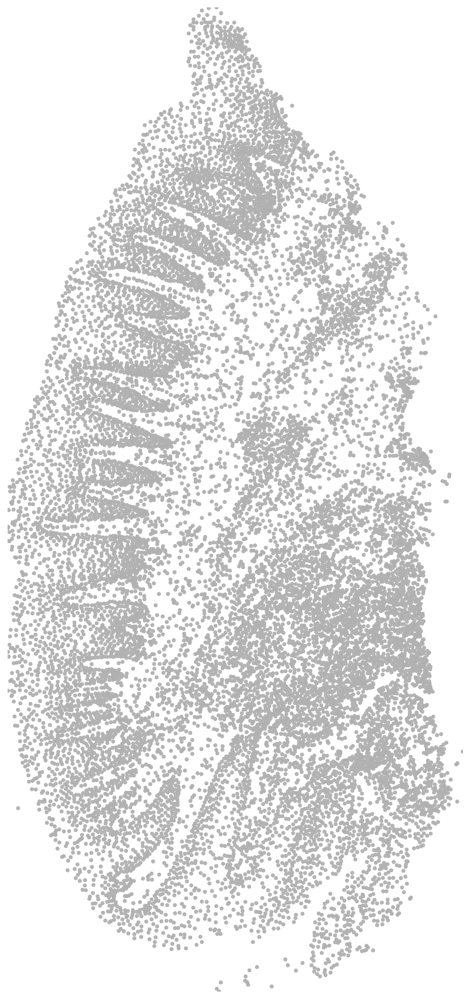

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import os

def generate_spatial_plot_all_grey(adata, sample_names, save_dir):
    # Ensure output directory exists
    os.makedirs(save_dir, exist_ok=True)

    # Define the rotation angle in degrees
    rotation_angle = 0
    rotation_rad = np.deg2rad(rotation_angle)

    # Rotation matrix
    rotation_matrix = np.array([
        [np.cos(rotation_rad), -np.sin(rotation_rad)],
        [np.sin(rotation_rad),  np.cos(rotation_rad)]
    ])

    # Horizontal flip matrix
    horizontal_flip_matrix = np.array([
        [-1, 0],
        [0, -1]
    ])

    # Combined transformation matrix
    combined_matrix = rotation_matrix @ horizontal_flip_matrix

    for sample_name in sample_names:
        # Subset the data
        subset_adata = adata[adata.obs['sample'] == sample_name].copy()

        # Get x/y coordinates
        x_coords = subset_adata.obs['x_centroid'].values
        y_coords = subset_adata.obs['y_centroid'].values

        # Apply transformation
        coords = np.vstack((x_coords, y_coords))
        transformed_coords = combined_matrix @ coords
        new_x_coords = transformed_coords[0, :]
        new_y_coords = transformed_coords[1, :]

        # Aspect ratio
        x_range = new_x_coords.max() - new_x_coords.min()
        y_range = new_y_coords.max() - new_y_coords.min()
        aspect_ratio = x_range / y_range
        figsize = (6 * aspect_ratio, 6) if aspect_ratio > 1 else (6, 6 / aspect_ratio)

        # Plot all cells in grey
        plt.figure(figsize=figsize)
        ax = plt.gca()
        plt.gcf().patch.set_facecolor('white')
        ax.set_facecolor('white')

        plt.scatter(
            x=new_x_coords,
            y=new_y_coords,
            c='#B0B0B0',  # fixed grey color
            s=8,
            alpha=0.9
        )

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlim(new_x_coords.min(), new_x_coords.max())
        ax.set_ylim(new_y_coords.min(), new_y_coords.max())
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)

        plt.gcf().set_dpi(300)
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

        # Save to SVG
        save_path = os.path.join(save_dir, f"{sample_name}_grey_cells.svg")
        plt.savefig(save_path, format='svg')
        plt.show()
        plt.close()

# Example usage:
sample_names = ['s2r2_HV184']
save_directory = '/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Figures_paper/Revisions/'  # change this to your desired path

generate_spatial_plot_all_grey(
    adata=adata,
    sample_names=sample_names,
    save_dir=save_directory
)


In [149]:
adata_HV184.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,Mel_leiden,KNN100_K10,KNN100_K12,spatial_expression_cluster,KNN50_K10,KNN30_K10,KNN10_K10,niche_knn50k10,niche_knn50k10_merged,distance_bin_100um
cell_id,,,,,,,,,,,,,,,,,,,,,
gnhlcfka-1,gnhlcfka-1,4210.009766,2978.239746,3,0,0,0,0,3,13.998438,...,NaN,8,2,8,2,7,4,Lymphoid,Lymphoid,NaN
gnhmhhin-1,gnhmhhin-1,4227.641602,3013.276123,2,0,0,0,0,2,5.734844,...,NaN,6,11,6,3,4,4,Fib CT 2,Fibrous CT,NaN
gnhmjbgi-1,gnhmjbgi-1,4224.211426,3009.619141,16,0,0,0,0,16,37.163595,...,NaN,6,11,6,3,4,4,Fib CT 2,Fibrous CT,NaN
gnhneebi-1,gnhneebi-1,4242.675293,3053.905762,12,0,0,0,0,12,20.410626,...,NaN,6,11,6,3,4,4,Fib CT 2,Fibrous CT,NaN
gnhoimen-1,gnhoimen-1,4225.180664,3113.435303,40,0,0,0,0,40,53.329533,...,NaN,6,11,6,0,0,3,Fib CT 1,Fibrous CT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
njelnkmm-1,njelnkmm-1,4835.378906,1809.011108,19,0,0,0,0,19,21.313751,...,NaN,6,11,6,0,4,4,Fib CT 1,Fibrous CT,NaN
njepmpif-1,njepmpif-1,4892.865234,1780.951782,4,0,0,0,0,4,20.817032,...,NaN,6,11,6,0,0,4,Fib CT 1,Fibrous CT,NaN
njfccgap-1,njfccgap-1,4855.727051,1790.056885,20,0,0,0,0,20,38.292501,...,NaN,6,11,6,0,0,0,Fib CT 1,Fibrous CT,NaN


In [151]:
cell_counts = adata_HV184.obs['distance_bin_100um'].value_counts()
print(cell_counts)

500–1500    1163
0–100        981
100–500      799
Name: distance_bin_100um, dtype: int64


In [125]:
print(adata_nonimmune_filtered.obs.columns)

Index(['cell_id', 'x_centroid', 'y_centroid', 'transcript_counts',
       'control_probe_counts', 'control_codeword_counts',
       'unassigned_codeword_counts', 'deprecated_codeword_counts',
       'total_counts', 'cell_area', 'nucleus_area_x', 'orig.ident',
       'nucleus_area_y', 'pt.id', 'oct.id', 'status', 'status.2', 'status.3',
       'age', 'sex', 'race', 'region', 'orig_reg', 'total_area_mm2', 'Lvl1',
       'Lvl2', 'Lvl3', 'epiHL', 'fibHL', 'endoHL', 'immuneHL', 'Lvl4',
       'Lvl1_IE', 'Lvl2_IE', 'lymphoidHL', 'myeloidHL', 'sample',
       '_scvi_batch', '_scvi_labels', 'cc8', 'cc14', 'cc17', 'Lvl2.5',
       'niche_cc14', 'Lvl4_old', 'T_leiden', 'T_leiden2', 'T_leiden3',
       'Lvl4_thesis', 'F_leiden', 'V_leiden', 'V_leiden2', 'Lvl5', 'B_leiden',
       'Lvl4_kmeans_Mel', 'Mel_leiden', 'KNN100_K10', 'KNN100_K12',
       'spatial_expression_cluster', 'KNN50_K10', 'KNN30_K10', 'KNN10_K10',
       'niche_knn50k10', 'niche_knn50k10_merged', 'distance_to_TAE',
       'distan

In [66]:
df = pd.read_csv("/data/vasileiosionat2/IBEX_FINAL/Scimap/Outputs/Ligand-Receptor/Ligand_Neighbors-per-sample/Ligand-neighbors-per-sample.csv")

In [67]:
df

,L-R,s1r2,s1r6,s2r1_HV203,s2r1_HV207,s2r7_a,s2r7_b,s2r9_a,s2r9_b,HV171A,...,HV192A_A,HV192A_B,HV192A_C,HV198B_A,HV198B_B,HV219AB_A,HV219AB_B,HV219AS_A,HV219AS_B,HV219AS_C
0,ANPEP-SELE,0.000000,0.969112,0.000000,0.165275,0.000000,0.686192,0.000000,0.000000,0.000000,...,0.093168,3.697080,0.000000,0.871483,1.186901,0.292576,0.957680,1.025253,NaN,1.719764
1,ANXA1-EGFR,8.950959,9.824335,13.532120,11.070775,13.193661,7.689038,29.794283,14.055595,15.708567,...,9.333735,5.564655,17.634653,5.375920,6.722075,11.406490,8.036631,5.101308,8.831169,5.699873
2,ANXA1-FPR1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.160406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.431457,0.000000
3,APOA5-LPL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,C3-CD19,0.000000,0.000000,0.041059,1.559772,0.000000,3.115519,NaN,1.963494,0.000000,...,0.000000,3.523290,0.000000,6.724488,5.210313,0.700441,2.645833,6.186656,12.539370,4.600235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,TNC-SDC1,16.302752,23.767164,18.862543,17.780337,13.674451,15.113333,38.005405,37.678460,20.389591,...,18.483951,21.254593,20.427146,26.034710,22.179811,24.278317,28.580727,25.445920,NaN,16.661351
88,TNC-EGFR,8.708257,14.562189,10.019244,9.047830,9.392857,8.653333,31.335135,18.247659,13.060223,...,10.259259,5.421260,15.347305,5.700791,6.618747,15.613269,12.382079,5.702087,NaN,7.575985
89,VCAN-EGFR,1.737433,4.217105,1.920907,3.309162,1.478485,2.695476,23.632107,6.508772,1.999148,...,3.086022,1.506494,2.612992,1.289760,1.552205,3.283247,1.975481,1.922800,2.634820,0.991921
90,VCAN-SELL,0.000000,0.000000,0.590051,0.990052,0.000000,3.824443,0.000000,9.252193,0.000000,...,1.036290,5.551948,0.000000,9.050741,3.039054,0.075993,0.000000,2.681600,6.392781,3.274007


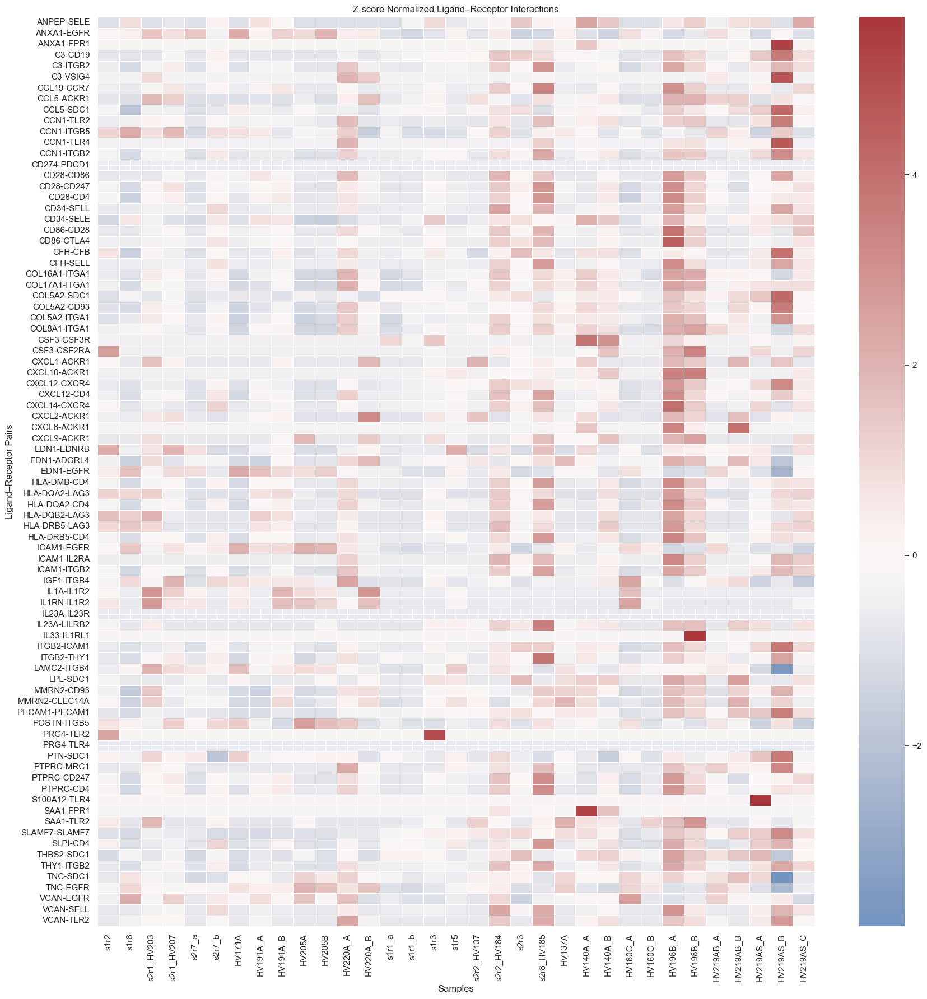

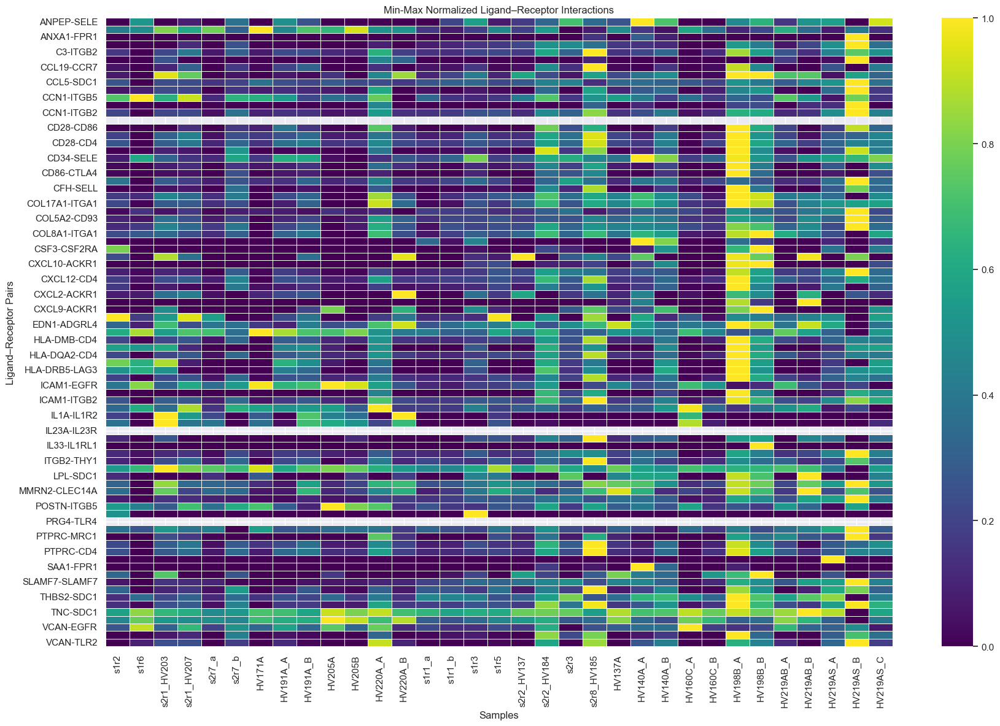

In [68]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore


# === STEP 2: Set 'L-R' column as index ===
df = df.set_index("L-R")

# === STEP 3: Drop excluded samples ===
excluded_sample_ids = [
    's2r9_a', 's2r9_b', 'HV140A_C', 'HV140A_D', 's2r4_a', 's2r4_b', 's2r5', 
    's2r8_HV188_a', 's2r8_HV188_b', 's2r8_HV211', 
    'HV192A_A', 'HV192A_B', 'HV192A_C'
]

# Drop those columns only if they exist
df = df.drop(columns=[col for col in excluded_sample_ids if col in df.columns])

# === STEP 4: Convert all values to numeric
df = df.apply(pd.to_numeric, errors='coerce')

# === STEP 5: Drop rows with too many NaNs
df = df.dropna(thresh=3)

# === STEP 6: Fill remaining NaNs (use 0 or row mean)
df_filled = df.fillna(0)  # or: df.fillna(df.mean(axis=1), axis=0)

# === STEP 7A: Z-score normalization
df_zscore = df_filled.apply(zscore, axis=1, nan_policy='omit')

# === STEP 7B: Min-Max normalization
df_minmax = df_filled.subtract(df_filled.min(axis=1), axis=0).divide(
    df_filled.max(axis=1) - df_filled.min(axis=1), axis=0)

# === STEP 8A: Z-score heatmap
plt.figure(figsize=(18, 18))
sns.heatmap(df_zscore, cmap="vlag", center=0, linewidths=0.5)
plt.title("Z-score Normalized Ligand–Receptor Interactions")
plt.xlabel("Samples")
plt.ylabel("Ligand–Receptor Pairs")
plt.tight_layout()
plt.show()

# === STEP 8B: Min-Max heatmap
plt.figure(figsize=(18, 12))
sns.heatmap(df_minmax, cmap="viridis", linewidths=0.5)
plt.title("Min-Max Normalized Ligand–Receptor Interactions")
plt.xlabel("Samples")
plt.ylabel("Ligand–Receptor Pairs")
plt.tight_layout()
plt.show()

# === STEP 9: Save output (optional)
df_zscore.to_csv("normalized_zscore_filtered.csv")
df_minmax.to_csv("normalized_minmax_filtered.csv")


# === STEP 9: Export resu


In [3]:
# List of ligand-receptor pairs
ligand_receptor_pairs = [
    ('ANPEP', 'SELE'),
    ('ANXA1', 'EGFR'),
    ('ANXA1', 'FPR1'),
    ('APOA5', 'LPL'),
    ('C3', 'CD19'),
    ('C3', 'ITGB2'),
    ('C3', 'VSIG4'),
    ('CAMP', 'EGFR'),
    ('CCL19', 'CCR7'),
    ('CCL5', 'ACKR1'),
    ('CCL5', 'SDC1'),
    ('CCN1', 'TLR2'),
    ('CCN1', 'ITGB5'),
    ('CCN1', 'TLR4'),
    ('CCN1', 'ITGB2'),
    ('CD274', 'PDCD1'),
    ('CD28', 'CD86'),
    ('CD28', 'CD247'),
    ('CD28', 'CD4'),
    ('CD34', 'SELL'),
    ('CD34', 'SELE'),
    ('CD70', 'CD27'),
    ('CD86', 'CD28'),
    ('CD86', 'CTLA4'),
    ('CFH', 'CFB'),
    ('CFH', 'SELL'),
    ('COL16A1', 'ITGA1'),
    ('COL17A1', 'ITGA1'),
    ('COL5A2', 'SDC1'),
    ('COL5A2', 'CD93'),
    ('COL5A2', 'ITGA1'),
    ('COL8A1', 'ITGA1'),
    ('CSF3', 'CSF3R'),
    ('CSF3', 'CSF2RA'),
    ('CXCL1', 'ACKR1'),
    ('CXCL10', 'ACKR1'),
    ('CXCL12', 'CXCR4'),
    ('CXCL12', 'CD4'),
    ('CXCL14', 'CXCR4'),
    ('CXCL2', 'ACKR1'),
    ('CXCL5', 'ACKR1'),
    ('CXCL6', 'ACKR1'),
    ('CXCL9', 'ACKR1'),
    ('EDN1', 'EDNRB'),
    ('EDN1', 'ADGRL4'),
    ('EDN1', 'EGFR'),
    ('GDF15', 'ERBB2'),
    ('HLA-DMB', 'CD4'),
    ('HLA-DQA2', 'LAG3'),
    ('HLA-DQA2', 'CD4'),
    ('HLA-DQB2', 'LAG3'),
    ('HLA-DRB5', 'LAG3'),
    ('HLA-DRB5', 'CD4'),
    ('ICAM1', 'EGFR'),
    ('ICAM1', 'IL2RA'),
    ('ICAM1', 'ITGB2'),
    ('IGF1', 'ITGB4'),
    ('IL1A', 'IL1R2'),
    ('IL1RN', 'IL1R2'),
    ('IL23A', 'IL23R'),
    ('IL23A', 'LILRB2'),
    ('IL33', 'IL1RL1'),
    ('ITGB2', 'ICAM1'),
    ('ITGB2', 'THY1'),
    ('KNG1', 'ITGB2'),
    ('KNG1', 'CD93'),
    ('LAMC2', 'ITGB4'),
    ('LPL', 'SDC1'),
    ('MMRN2', 'CD93'),
    ('MMRN2', 'CLEC14A'),
    ('PECAM1', 'PECAM1'),
    ('POSTN', 'ITGB5'),
    ('PRG4', 'TLR2'),
    ('PRG4', 'TLR4'),
    ('PTN', 'SDC1'),
    ('PTPRC', 'MRC1'),
    ('PTPRC', 'CD247'),
    ('PTPRC', 'CD4'),
    ('RETN', 'TLR4'),
    ('S100A12', 'TLR4'),
    ('SAA1', 'FPR1'),
    ('SAA1', 'TLR2'),
    ('SLAMF7', 'SLAMF7'),
    ('SLPI', 'CD4'),
    ('TFF2', 'CXCR4'),
    ('THBS2', 'SDC1'),
    ('THY1', 'ITGB2'),
    ('TNC', 'SDC1'),
    ('TNC', 'EGFR'),
    ('VCAN', 'EGFR'),
    ('VCAN', 'SELL'),
    ('VCAN', 'TLR2')
]
# Filter for ligand-receptor expressing cells
ligand_cells = {}
receptor_cells = {}

# Loop through each ligand-receptor pair
for ligand, receptor in ligand_receptor_pairs:
    # Assuming 'Xenium.raw.X' is a sparse CSR matrix, we convert the expression to a boolean array for each ligand and receptor
    ligand_cells_mask = (adata.raw.X[:, adata.raw.var_names == ligand].toarray() > 0).flatten()
    receptor_cells_mask = (adata.raw.X[:, adata.raw.var_names == receptor].toarray() > 0).flatten()

    # Add these boolean arrays to adata.obs as new columns
    adata.obs[f"{ligand}_expressed"] = ligand_cells_mask
    adata.obs[f"{receptor}_expressed"] = receptor_cells_mask

In [87]:
# Subset the AnnData object to include only samples whose orig.ident starts with "HV" or "TM"
mask = adata.obs['status.3'].str.startswith(('perio'))
adata_filtered = adata[mask].copy()

/gpfs/gsfs12/users/vasileiosionat2/conda/envs/scimap/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.



In [9]:
import numpy as np
import pandas as pd

# Initialize an empty list to store results for each ligand-receptor pair
interaction_results = []

# Loop through each ligand-receptor pair
for ligand, receptor in ligand_receptor_pairs:
    
    # Get ligand and receptor-expressing cells in the current sample
    ligand_cells_mask = adata_filtered.obs[f"{ligand}_expressed"] == True
    receptor_cells_mask = adata_filtered.obs[f"{receptor}_expressed"] == True
    
    # Extract the niche information for ligand- and receptor-expressing cells
    ligand_niche = adata_filtered.obs.loc[ligand_cells_mask, 'niche_knn50k10_merged']
    receptor_niche = adata_filtered.obs.loc[receptor_cells_mask, 'niche_knn50k10_merged']
    
    # Calculate the proportion of ligand and receptor cells in each niche
    ligand_niche_counts = ligand_niche.value_counts(normalize=True)
    receptor_niche_counts = receptor_niche.value_counts(normalize=True)
    
    # Determine the most common niche for ligand and receptor-expressing cells
    ligand_majority_niche = ligand_niche_counts.idxmax() if len(ligand_niche_counts) > 0 else None
    receptor_majority_niche = receptor_niche_counts.idxmax() if len(receptor_niche_counts) > 0 else None
    
    # Calculate the proportion of ligand and receptor cells in their respective majority niches
    ligand_majority_proportion = ligand_niche_counts.max() if len(ligand_niche_counts) > 0 else 0
    receptor_majority_proportion = receptor_niche_counts.max() if len(receptor_niche_counts) > 0 else 0

    # Define if the ligand and receptor-expressing cells are in the same niche (based on the threshold)
    if ligand_majority_niche == receptor_majority_niche :
        niche_status = "Same Niche"
    else:
        niche_status = "Different Niche"
    
    # Store the results for the current ligand-receptor pair
    interaction_results.append({
        'Ligand': ligand,
        'Receptor': receptor,
        'Niche Status': niche_status,
        'Ligand Cells in Niche': len(ligand_niche),
        'Receptor Cells in Niche': len(receptor_niche),
        'Ligand Majority Niche': ligand_majority_niche,
        'Receptor Majority Niche': receptor_majority_niche,
        'Ligand Majority Proportion': ligand_majority_proportion,
        'Receptor Majority Proportion': receptor_majority_proportion
    })

# Convert the results into a Pandas DataFrame
interaction_df = pd.DataFrame(interaction_results)

# Optionally, save the results to a CSV
# interaction_df.to_csv('ligand_receptor_niche_status.csv', index=False)

# Display the results
interaction_df.head(60)


,Ligand,Receptor,Niche Status,Ligand Cells in Niche,Receptor Cells in Niche,Ligand Majority Niche,Receptor Majority Niche,Ligand Majority Proportion,Receptor Majority Proportion
0,ANPEP,SELE,Different Niche,19126,18675,Fibrous CT,Plasma-Fib CT,0.317003,0.337456
1,ANXA1,EGFR,Same Niche,238599,72923,Epi-CT,Epi-CT,0.236191,0.476955
2,ANXA1,FPR1,Different Niche,238599,7479,Epi-CT,Plasma-Fib CT,0.236191,0.204974
3,APOA5,LPL,Different Niche,181,3555,Fibrous CT,Plasma-Fib CT,0.386740,0.296203
4,C3,CD19,Same Niche,49450,40687,Plasma,Plasma,0.211082,0.537199
5,C3,ITGB2,Same Niche,49450,68451,Plasma,Plasma,0.211082,0.259909
6,C3,VSIG4,Same Niche,49450,7135,Plasma,Plasma,0.211082,0.266994
7,CAMP,EGFR,Different Niche,205,72923,Fibrous CT,Epi-CT,0.292683,0.476955
8,CCL19,CCR7,Same Niche,16985,20625,Lymphoid,Lymphoid,0.264057,0.477624
9,CCL5,ACKR1,Different Niche,30143,17449,Lymphoid,Plasma-Fib CT,0.325615,0.363631


In [11]:
interaction_df.iloc[60:121]

,Ligand,Receptor,Niche Status,Ligand Cells in Niche,Receptor Cells in Niche,Ligand Majority Niche,Receptor Majority Niche,Ligand Majority Proportion,Receptor Majority Proportion
60,IL23A,LILRB2,Same Niche,5096,23281,Plasma,Plasma,0.349882,0.310339
61,IL33,IL1RL1,Different Niche,13811,6758,Plasma-Fib CT,Fibrous CT,0.258707,0.234093
62,ITGB2,ICAM1,Same Niche,68451,87540,Plasma,Plasma,0.259909,0.327553
63,ITGB2,THY1,Different Niche,68451,66775,Plasma,Fibrous CT,0.259909,0.322127
64,KNG1,ITGB2,Different Niche,60,68451,Fibrous CT,Plasma,0.233333,0.259909
65,KNG1,CD93,Different Niche,60,46123,Fibrous CT,Plasma-Fib CT,0.233333,0.286321
66,LAMC2,ITGB4,Different Niche,31594,123053,Crevicular,Epi-CT,0.331519,0.451228
67,LPL,SDC1,Different Niche,3555,263746,Plasma-Fib CT,Plasma,0.296203,0.273452
68,MMRN2,CD93,Same Niche,44429,46123,Plasma-Fib CT,Plasma-Fib CT,0.262554,0.286321
69,MMRN2,CLEC14A,Different Niche,44429,28541,Plasma-Fib CT,Fibrous CT,0.262554,0.296240
